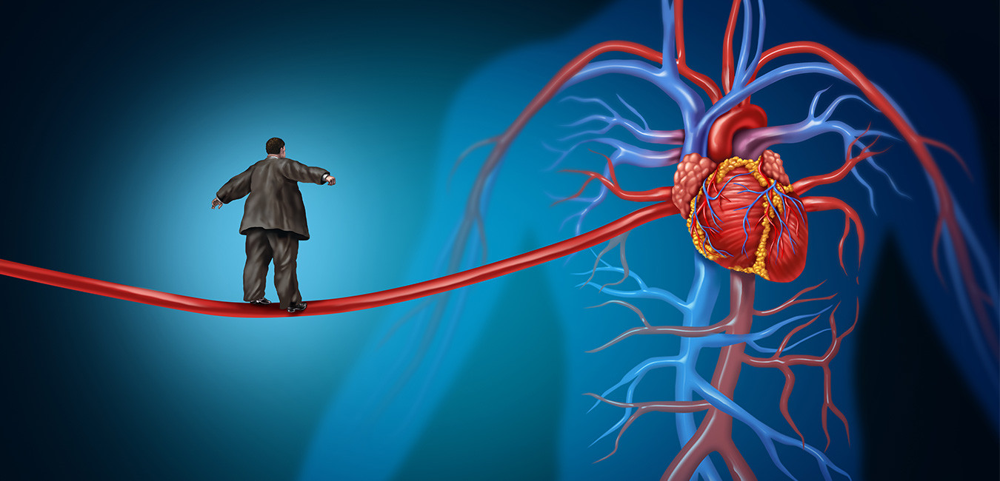

# <center> Predicting Survivability of Coronary Artery Disease (CAD) Patients </center>

Coronary artery disease (CAD) is one of the most common types of cardiovascular diseases (CVDs). CVDs are the number 1 cause of death globally, causing about 17.9 million lives in 2019 (WHO, 2021). This accounts for 32% of deaths worldwide.<br><br>

People diagnosed with cardiovascular disease, or those who are at susceptible to cardiovascular risk (resulting from one or more risk factors such as hypertension, diabetes, etc.) require early detection and management. This would in turn lead to effective access to medication and technology to effectively manage CVDs.<br><br>

The objective of this project is to build a model to predict the survival of CAD patients to help doctors formulate pre-emptive medical treatment using Machine Learning based on patient particulars (age, gender) and their medical records (smoking/diabete status). 

# Table of Contents

### I. Data Import and Explanatory Descriptive Analysis (EDA)
- [Data Import](#import)
- [Explanatory Data Analysis](#eda)
- [Multivariate Analysis](#multivariate)

### II. Feature Engineering
- [Missing Data Imputation](#impute)
- [Polynomial Feature](#poly)
- [Recursive Feature Elimination](#rfe)
- [Data Transformation and Train/Test Split](#transform)

### III. Prediction Models
- [Result definition and Plotting functions](#define)<br>

#### 1. Neighbors Family
- [K-Nearest Neighbors (KNN)](#knn)
- [Radius Neighbors Classifier](#rn)<br>
- [Ensemble with KNN](#ensembleknn)

#### 2. Tree and Ensemble Trees 
- [Decision Tree Classifier](#dt)
- [RandomForest Classifier](#rf)
- [ExtraTrees Classifier](#et)
- [BaggingTree Classifier](#bag)
- [AdaBoost Classifier](#ada)
- [GradientBoosting Classifier](#gb)
- [ExtremeGradientBoosting Classifier](#xgb) <br>

#### 3. Generative Models and Naive Bayes
- [NaiveBayes Classifier](#nb) <br>

#### 4. Logistic Regression
- [Logistic Regression](#lr)
- [Logistic Regression with Polynomial Features](#lrpoly) <br>
- [Ensemble with Logistic Regression Models](#ensemblelr)

#### 5. Support Vector Machine
- [Support Vector Classifier with Linear kernel](#svclin)
- [Support Vector Classifier with Polynomial kernel](#svcpoly)
- [Support Vector Classifier with Radial Basis Function (RBF) kernel](#svcrbf) <br>

#### 6. Artificial Neural Network
- [Artificial Neural Network](#ann)
- [Artificial Neural Network with l1/l2 regularization](#annl12)
- [Artificial Neural Network with dropout regularization](#anndrop)

### IV. Results and Summary
- [Model Comparison](#comparemodels)

# I. Data Import and Explanatory Descriptive Analysis (EDA)

## Data Import <a id='import'/>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as ss
from sklearn import model_selection, metrics, svm
from sklearn import preprocessing, impute
from sklearn import tree, ensemble, linear_model, neighbors
import xgboost
import lightgbm
import seaborn as sns
from Association import Chisq_Stats
from sklearn.experimental import enable_iterative_imputer
import sklearn.neighbors._base
import sys
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base
from missingpy import MissForest   ### -pip install under anaconda prompt
from sklearn.model_selection import cross_val_score
from sklearn import pipeline
import time
from sklearn import feature_selection
import pickle
from mlxtend.plotting import plot_decision_regions
import copy
from scipy.signal import savgol_filter
from sklearn import naive_bayes as nb
from sklearn.inspection import permutation_importance
import operator

In [2]:
data = pd.read_csv('raw.csv')
data.drop(columns = ['ID'], inplace = True)
np.random.seed(2022)
data = data.reindex(np.random.permutation(data.index)) 
print(data.shape)
data.head()

(15000, 15)


,Survive,Gender,Smoke,Diabetes,Age,Ejection Fraction,Sodium,Creatinine,Pletelets,Creatinine phosphokinase,Blood Pressure,Hemoglobin,Height,Weight,Favorite color
3248,1,Male,No,Normal,42,Low,140,0.7,189000.0,64,88,16.0,131,27,green
14180,1,Male,No,Diabetes,60,Low,140,1.7,194000.0,231,109,11.3,178,89,green
11193,1,Male,No,Diabetes,65,Low,140,1.0,188000.0,94,153,16.1,171,108,green
1874,1,Female,NO,Normal,70,L,136,1.7,293000.0,69,77,13.4,150,73,blue
10686,1,Female,NO,Diabetes,65,Normal,137,0.9,172000.0,59,48,9.4,170,85,white


In [3]:
num_var = ['Age','Sodium','Creatinine','Pletelets','Creatinine phosphokinase','Blood Pressure','Hemoglobin','Height','Weight']
cat_var = ['Gender','Smoke','Diabetes','Ejection Fraction','Favorite color']

Check for Missing Data shows that there are 499 samples with missing values for Creatinine. <br>
We will take care this data later during Feature Engineering part.

In [4]:
data.isnull().sum()

Survive                       0
Gender                        0
Smoke                         0
Diabetes                      0
Age                           0
Ejection Fraction             0
Sodium                        0
Creatinine                  499
Pletelets                     0
Creatinine phosphokinase      0
Blood Pressure                0
Hemoglobin                    0
Height                        0
Weight                        0
Favorite color                0
dtype: int64

In [5]:
data.describe()

,Age,Sodium,Creatinine,Pletelets,Creatinine phosphokinase,Blood Pressure,Hemoglobin,Height,Weight
count,15000.000000,15000.000000,14501.000000,15000.00000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,57.428467,136.604267,1.410195,263096.01649,580.151800,103.676667,12.910667,159.475200,69.340467
std,23.411173,4.364890,1.044535,98056.33034,955.418765,39.700138,2.500152,17.344439,25.298287
min,-95.000000,113.000000,0.500000,25100.00000,23.000000,40.000000,9.000000,130.000000,19.000000
25%,50.000000,134.000000,0.900000,211000.00000,115.000000,70.000000,10.700000,144.000000,50.000000
50%,60.000000,137.000000,1.100000,262000.00000,250.000000,100.000000,12.700000,160.000000,66.000000
75%,70.000000,140.000000,1.400000,304000.00000,582.000000,137.000000,15.100000,174.000000,87.000000
max,95.000000,148.000000,9.400000,850000.00000,7861.000000,179.000000,17.500000,189.000000,141.000000


## Explanatory Data Analysis <a id='eda'/>

### Distribution of Target Variable Survive

<AxesSubplot:xlabel='Survive', ylabel='count'>

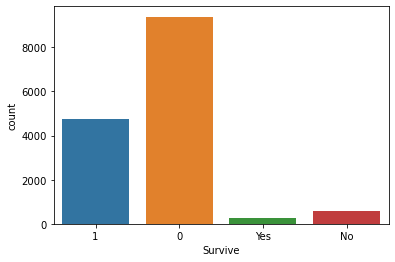

In [6]:
sns.countplot(x = 'Survive', data = data)

Target variables contain two types of output 0/1 and NO/YES. We will standardize output to 0/1.

In [7]:
def update_label(x):
    if x in ['No','0']:
        return 0
    elif x in ['Yes','1']:
        return 1
data['Survive'] = data['Survive'].apply(lambda x: update_label(x))

<AxesSubplot:xlabel='Survive', ylabel='count'>

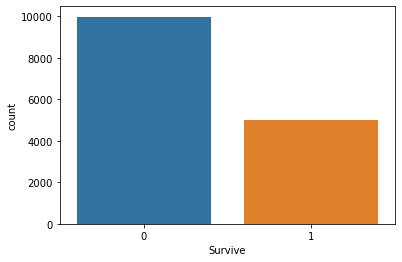

In [8]:
sns.countplot(x = 'Survive', data = data)

### Distribution for continuous variables

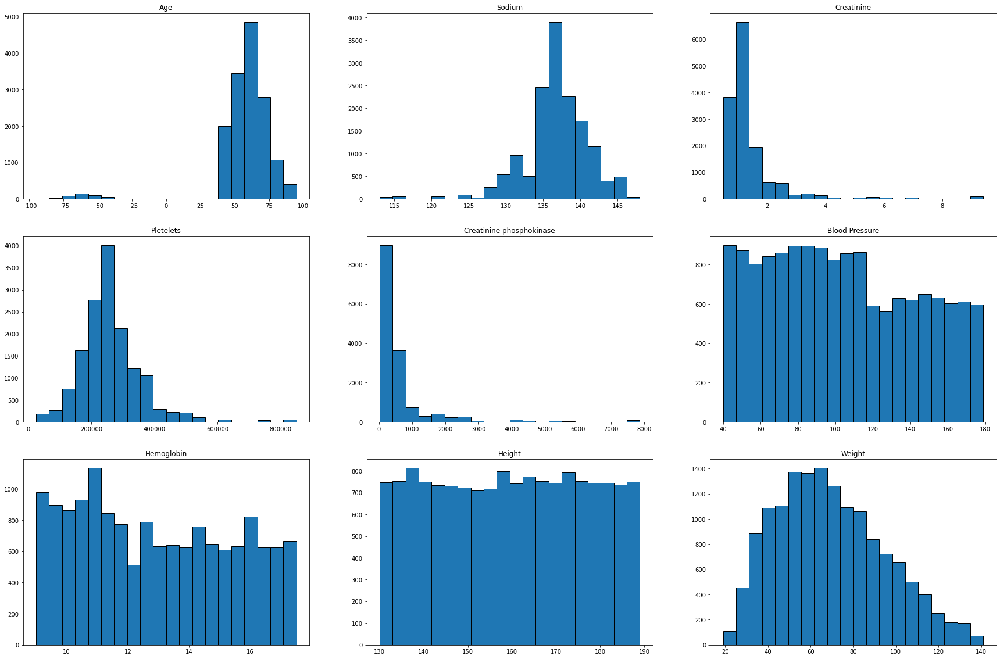

In [9]:
plt.figure(figsize = (30,20))
for i in range(3):
    for j in range(3):
        ind = i*3 + j
        plt.subplot(3,3,ind + 1)
        plt.hist(data[num_var[ind]],bins = 20,ec='black')
        plt.title(num_var[ind])

Histogram for continuous variables show the distributions of 9 continuous variables in the dataset. There are some invalid data for AGE variable whereby the AGE value is negative. Suspect some data entry mistake causing extra negative signs, as the magnitude of the AGE variables for these negative data falls within expected magnitude of AGE.<br><br>

In [10]:
data['Age'] = data['Age'].apply(lambda x: (-1)*x if x < 0 else x)

We converted all negative AGE to positive values.

Text(0.5, 1.0, 'Age')

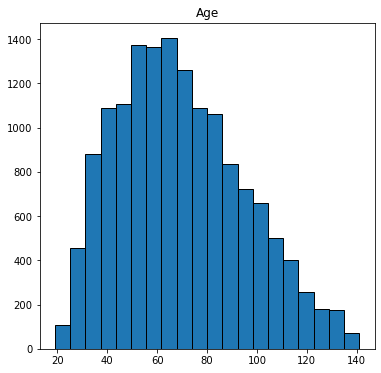

In [11]:
plt.figure(figsize = (6,6))
plt.hist(data[num_var[ind]],bins = 20,ec='black')
plt.title('Age')

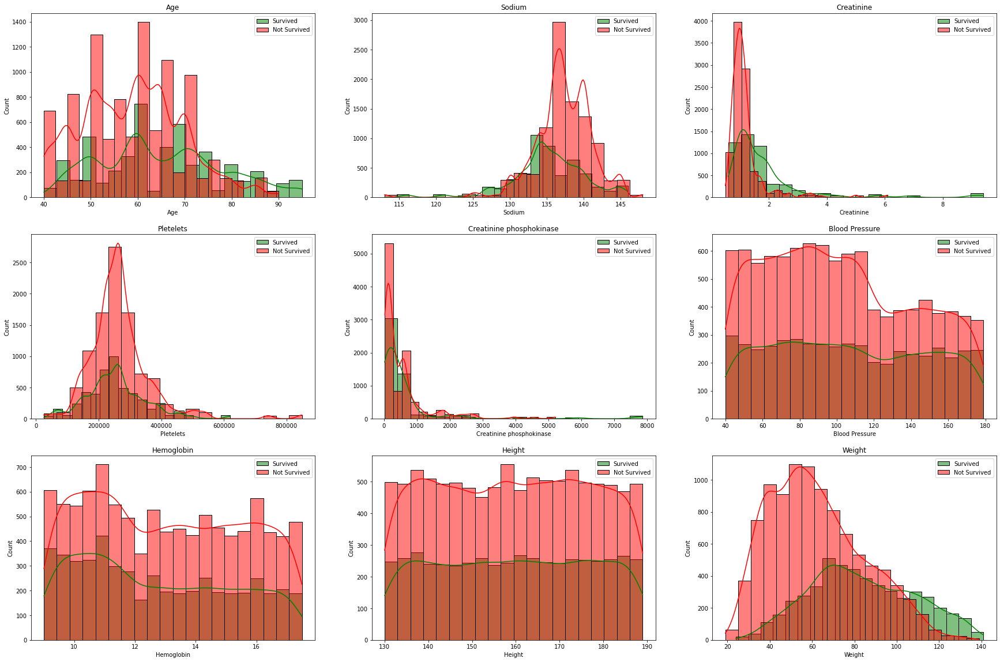

In [12]:
plt.figure(figsize = (30,20))
for i in range(3):
    for j in range(3):
        ind = i*3 + j
        plt.subplot(3,3,ind + 1)
        sns.histplot(x = num_var[ind], bins = 20, data = data[data['Survive'] == 1][num_var], 
                    color = 'green', alpha = 0.5, kde = 'False', label = 'Survived')
        sns.histplot(x = num_var[ind], bins = 20, data = data[data['Survive'] == 0][num_var],
                    color = 'red', alpha = 0.5, kde = 'False', label = 'Not Survived')
        plt.title(num_var[ind])
        plt.legend()

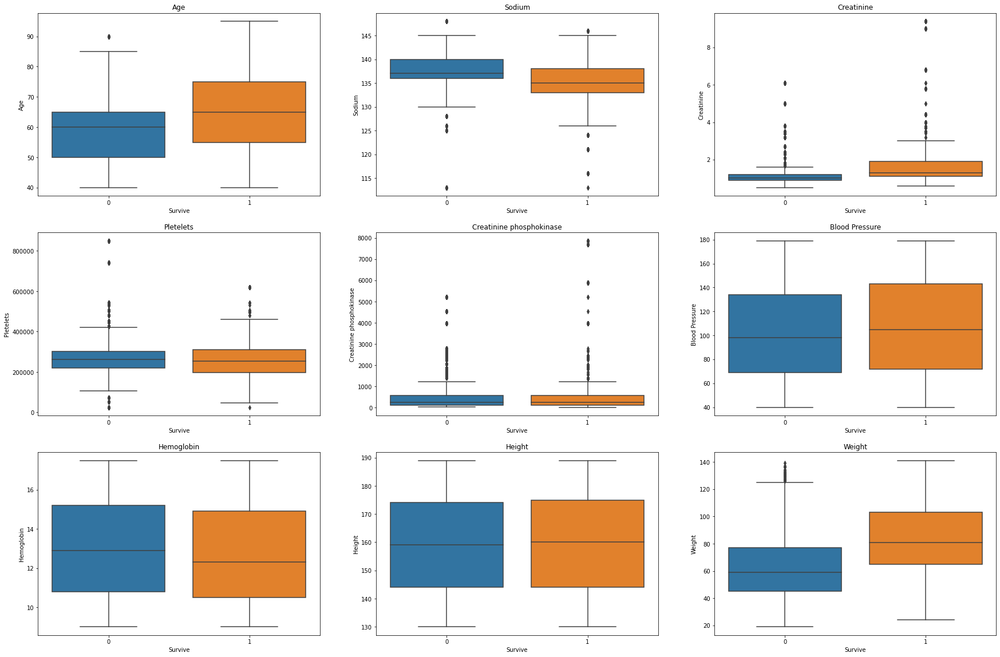

In [13]:
plt.figure(figsize = (30,20))
for i in range(3):
    for j in range(3):
        ind = i*3 + j
        plt.subplot(3,3,ind + 1)
        sns.boxplot(x = 'Survive', y = num_var[ind], data = data)
        plt.title(num_var[ind])

### Distribution for categorical variables

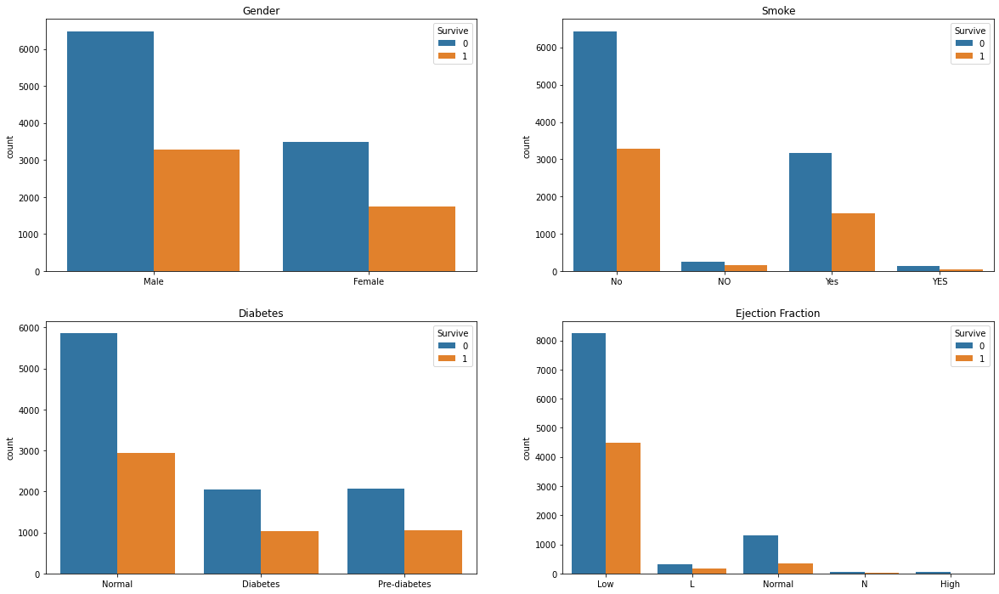

In [14]:
plt.figure(figsize = (20,12))
for i in range(2):
    for j in range(2):
        ind = 2*i + j
        plt.subplot(2,2,ind + 1)
        sns.countplot(x= cat_var[ind],  hue="Survive", data=data)
        plt.xlabel(None)
        plt.title(cat_var[ind])

We recategorized labels for SMOKE and Ejection Fraction to standardize the label convention

In [15]:
def update_smoke(x):
    if x == 'NO':
        return 'No'
    elif x == 'YES':
        return 'Yes'
    else:
        return x
data['Smoke'] = data['Smoke'].apply(lambda x: update_smoke (x))
data['Ejection Fraction'] = data['Ejection Fraction'].apply(lambda x: 'Low' if x in ['L','N'] else x)

## Multivariate Analysis <a id='multivariate'/>

#### Pearson Correlation Matrix for continuous variables

Pairwise comparison between variables show that there are no strong correlation between continuous variables (> 0.8). However, features Height and Weight do have moderate positive correlation with each other, as we expect tall people will generally have higher weights.

<AxesSubplot:>

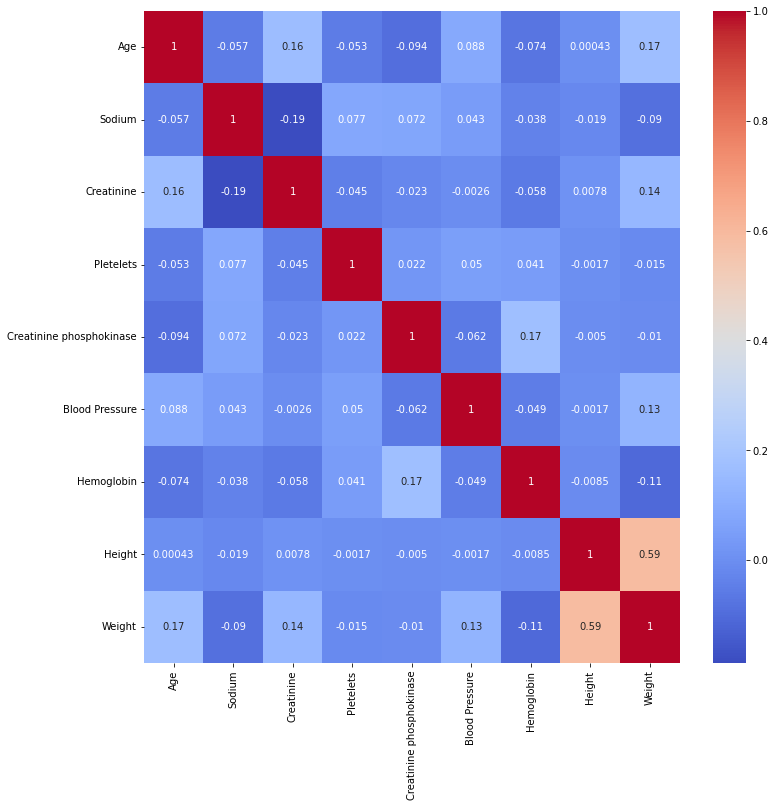

In [16]:
pearson_mat = data[num_var].corr()
plt.figure(figsize = (12,12))
sns.heatmap(pearson_mat,annot = True, cmap = "coolwarm")

### Cramer's V Matrix for categorical variables

We use the Cramer's V coefficient to check if there are strong Association between categorical variables. The matrix shows that there are no pairs of cat variables with significantly strong Association.

In [17]:
chisq = Chisq_Stats(data[cat_var])

14999.999999999998 15000 1
[[5243    0]
 [   0 9757]]
2964.661202852502 15000 1
[[5024  219]
 [5085 4672]]
307.09262886083866 15000 1
[[1333 2568 1342]
 [1754 6221 1782]]
279.43460155866023 15000 1
[[  60 4371  812]
 [   0 8911  846]]
1.4621181219575619 15000 1
[[ 856  892  857  880  881  877]
 [1608 1640 1650 1611 1595 1653]]
2964.661202852502 15000 1
[[5024 5085]
 [ 219 4672]]
14999.999999999996 15000 1
[[10109     0]
 [    0  4891]]
249.46897133695077 15000 1
[[2289 5477 2343]
 [ 798 3312  781]]
35.90511840157735 15000 1
[[  60 8887 1162]
 [   0 4395  496]]
6.58787598247322 15000 1
[[1662 1682 1650 1710 1685 1720]
 [ 802  850  857  781  791  810]]
307.0926288608387 15000 1
[[1333 1754]
 [2568 6221]
 [1342 1782]]
249.46897133695077 15000 1
[[2289  798]
 [5477 3312]
 [2343  781]]
30000.0 15000 2
[[3087    0    0]
 [   0 8789    0]
 [   0    0 3124]]
43.182510863976134 15000 2
[[   0 2749  338]
 [  60 7746  983]
 [   0 2787  337]]
6.472431696664777 15000 2
[[ 498  522  530  525  496  5

Text(0.5, 1.0, 'Association Analysis between Categorical Variables using Crimers V Coefficients')

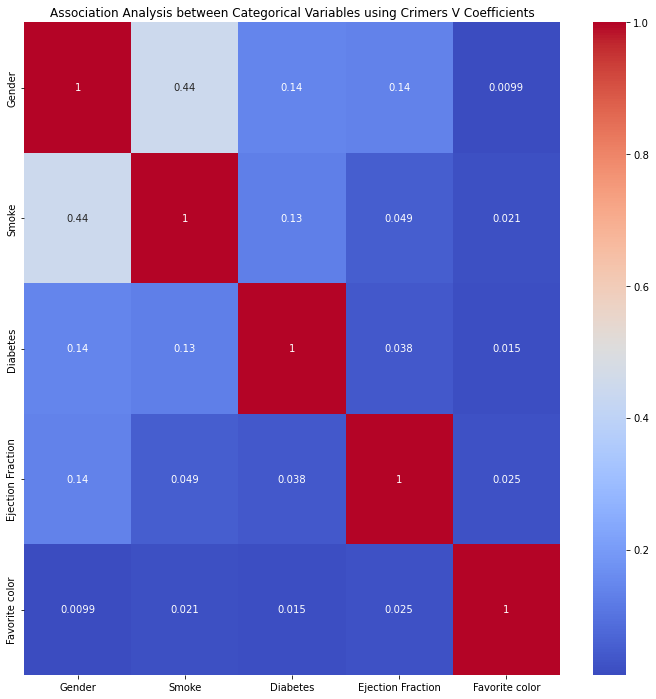

In [18]:
plt.figure(figsize = (12,12))
sns.heatmap(chisq.crimer_v_mat,annot = True, cmap = "coolwarm")
plt.title('Association Analysis between Categorical Variables using Crimers V Coefficients')

# II. Feature Engineering

## 1. Missing Data <a id='impute'/>

There are 499 samples with missing data for Creatinine. However, Creatinine level is a critical parameter which directly measures the heart performance. Hence we do not want to drop this feature. In this project, we evaluate the performance of several different imputations methods from simple method such as mean imputation to more sophiscated methods such as KNN imputation and RandomForest imputation.

In [19]:
data.isnull().sum()

Survive                       0
Gender                        0
Smoke                         0
Diabetes                      0
Age                           0
Ejection Fraction             0
Sodium                        0
Creatinine                  499
Pletelets                     0
Creatinine phosphokinase      0
Blood Pressure                0
Hemoglobin                    0
Height                        0
Weight                        0
Favorite color                0
dtype: int64

To evaluate the performance of the imputation method, we use 2 different base models: Logistic Regression and Support Vector Classification. We will then test the performance of different methods of imputation on the chosen performance parameter (Accuracy) of the base models and choose the imputation method which gives the highest score. <br><br>

In [20]:
y = data['Survive'].values
lr = linear_model.LogisticRegression(max_iter=1000, tol = 0.01, random_state = 2022)
svc = svm.SVC(random_state = 2022)
estimators = [lr, svc]

In [21]:
import copy
data_imp = copy.copy(data)
labels = data_imp['Survive'].values
missing_index = data_imp[data_imp['Creatinine'].isnull()].index.tolist()
np.random.seed(2022)
test_index = np.random.choice(missing_index, size = 300, replace = False)
val_index = [ind for ind in data_imp.index if ind not in test_index]

As we are testing imputation using sklearn.impute.KNNImputer and imputer.IterativeImputer with KNeighborRegressor. Both methods are sensitive to outliers as they are based on Euclidean distance. Hence before the evaluation of different imputation methods, a simple step was done to ONE-HOT encode categorical variables and scale continuous variables using StandardScaler module.

In [22]:
num_var1 = ['Age','Sodium','Pletelets','Creatinine phosphokinase','Blood Pressure','Hemoglobin','Height','Weight']
enc = preprocessing.OneHotEncoder(drop = 'first')
data_cat = enc.fit_transform(data_imp[cat_var])
column_labels = num_var + list(enc.get_feature_names_out())
scl1 = preprocessing.StandardScaler()
scl1.fit(data_imp[num_var1].values)

StandardScaler()

In [23]:
def data_transform (data):
    global cat_var, enc, scl1, num_var1
    num_arr = scl1.transform(data[num_var1].values)
    cat_arr = enc.transform(data[cat_var]).toarray()
    return np.concatenate((data['Creatinine'].values.reshape(-1,1),num_arr,cat_arr),
                          axis = 1)

data_transformed = data_transform (data_imp)

Scikit-learn provides several methods for missing data imputation. We test the 3 main family: SimpleImputer, IterativeImputer and KNNImputer. In addition, we also test another very popular imputation method which is based on Random Forest iterative method.

In [24]:
imputers = [impute.SimpleImputer(strategy = 'mean'),
            impute.SimpleImputer(strategy = 'median'),
            impute.IterativeImputer(estimator = linear_model.BayesianRidge()),
            impute.IterativeImputer(estimator = neighbors.KNeighborsRegressor()),
            impute.KNNImputer(n_neighbors = 5),
            MissForest(n_estimators = 10, criterion= 'squared_error',random_state = 2022)]

In [25]:
val_score = pd.DataFrame((np.zeros((len(imputers),len(estimators)))),
                                columns = ['lr','svc'],
                                index = ['mean_imputer',
                                         'median_imputer',
                                         'iterative_bayesian_ridge',
                                         'iterative_knn',
                                         'knn_imputer',
                                         'missforest'])

for e in range(len(estimators)):
    for i in range(len(imputers)):
        pipe = pipeline.Pipeline(steps = [('impute',imputers[i]),
                                          ('estimator',estimators[e])])
        val_score.iloc[i, e] = cross_val_score(pipe,
                                               data_transformed, labels,
                                               scoring = 'accuracy', cv = 3
                                               ).mean()
        print(f'Validation score for base model {val_score.columns[e]} using {val_score.index[i]} : %.4f' %val_score.iloc[i, e])

Validation score for base model lr using mean_imputer : 0.8145
Validation score for base model lr using median_imputer : 0.8157
Validation score for base model lr using iterative_bayesian_ridge : 0.8142
Validation score for base model lr using iterative_knn : 0.8153
Validation score for base model lr using knn_imputer : 0.8153
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 0
Iteration: 1
Iteration: 2
Validation score for base model lr using missforest : 0.8156
Validation score for base model svc using mean_imputer : 0.9152
Validation score for base model svc using median_imputer : 0.9168
Validation score for base model svc using iterative_bayesian_ridge : 0.9145
Validation score for base model svc using iterative_knn : 0.9165
Validation score for base model svc using knn_imputer : 0.9165
Iteration: 0
Ite

### Evaluation of different Imputation methods <br>
The charts below shows the accuracy score based on 5-fold cross validation for 6 different imputation methods. Median imputation and Missforest perform the best while Mean imputation and Iterative Imputation using Bayesian Ridge perform worst. <br>

Text(0.5, 1.0, 'Support Vector Classifier')

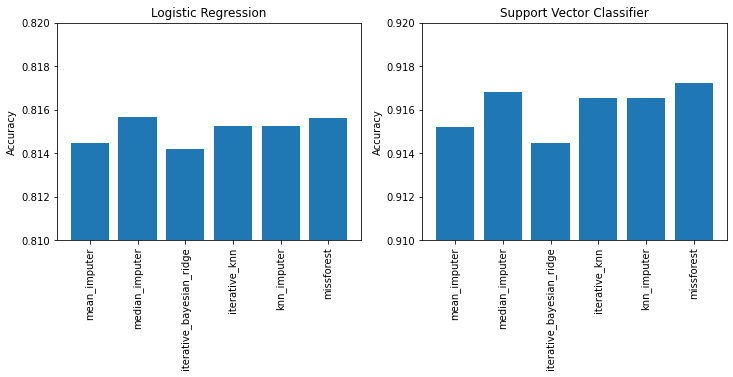

In [26]:
plt.figure(figsize = (12,4))
plt.subplot(1,2,1)
plt.bar(np.array(val_score.index), val_score['lr'])
plt.ylim(0.81,0.82)
plt.xticks(rotation=90)
plt.ylabel('Accuracy')
plt.title('Logistic Regression')
plt.subplot(1,2,2)
plt.bar(np.array(val_score.index), val_score['svc'])
plt.ylim(0.91,0.92)
plt.xticks(rotation=90)
plt.ylabel('Accuracy')
plt.title('Support Vector Classifier')

For this project, the amount of missing data only applies for 1 continuous variables. In cases where missing data issue becomes more serious, methods such as KNN or MissingForest is expected to perform better than simple methods such as Mean/Median imputation. We will proceed to use MissingForest to impute the missing data for 'Creatinine'.

In [27]:
scl1.fit(data[num_var].values)
np.random.seed(2022)
data_imputed = imputers[5].fit_transform(data_transformed)
data['Creatinine'] = data_imputed[:,0]
data.isnull().sum()

Iteration: 0
Iteration: 1
Iteration: 2
Iteration: 3
Iteration: 4


Survive                     0
Gender                      0
Smoke                       0
Diabetes                    0
Age                         0
Ejection Fraction           0
Sodium                      0
Creatinine                  0
Pletelets                   0
Creatinine phosphokinase    0
Blood Pressure              0
Hemoglobin                  0
Height                      0
Weight                      0
Favorite color              0
dtype: int64

## 2. Feature Creation <a id='poly'/>

This part is linked to later sections when we compare the performance between different models (Refer to Section III). We observe that there is significant discrepancy between linear and non-linear models by more than 15% difference in performance metrics when we use the original dataset, indicating that there is significant non-linearity in this dataset. <br><br>
To improve the performance of linear models such as Logistic Regression or Support Vector Classifier (using Linear kernel), we performed polynomial transformation on the numerical variables of the dataset. 

In [28]:
def poly_transform(data, degree, random_state = 2020):
    global num_var, cat_var, y, poly_feature_names
    poly = preprocessing.PolynomialFeatures(degree = degree, interaction_only = False)
    poly_data = poly.fit_transform(data[num_var])
    
    x_train_cont, x_test_cont, y_train, y_test = model_selection.train_test_split(poly_data, y, 
                                                                              test_size = 0.3,stratify = y,
                                                                              random_state = random_state)
    
    enc = preprocessing.OneHotEncoder(drop = 'first')
    data_cat = enc.fit_transform(data[cat_var])
    print(poly.get_feature_names_out().shape)
    print(enc.get_feature_names_out().shape)
    poly_feature_names = np.concatenate((poly.get_feature_names_out(),enc.get_feature_names_out()), axis = 0)
    x_train_cat, x_test_cat, y_train, y_test = model_selection.train_test_split(data_cat, y,
                                                                           test_size = 0.3, stratify = y,
                                                                           random_state = random_state)

    poly_scl = preprocessing.StandardScaler()
    x_train_cont_scl = poly_scl.fit_transform(x_train_cont)
    x_test_cont_scl = poly_scl.transform(x_test_cont)
    x_train = np.concatenate((x_train_cont_scl,x_train_cat.toarray()), axis = 1)
    x_test = np.concatenate((x_test_cont_scl,x_test_cat.toarray()), axis = 1)
    print(f'No of variables on polynomial {degree}:',x_train.shape[1])
    return x_train, x_test, y_train, y_test

In [29]:
enc = preprocessing.OneHotEncoder(drop = 'first')
data_cat = enc.fit_transform(data[cat_var])
cat_labels = enc.get_feature_names_out()
    
x_train_cat, x_test_cat, y_train, y_test = model_selection.train_test_split(data_cat, y,
                                                                           test_size = 0.3, stratify = y,
                                                                           random_state = 2022)

In [30]:
ftwo_scorer = metrics.make_scorer(metrics.fbeta_score, beta=2)

In [31]:
cv = model_selection.StratifiedKFold(n_splits = 10, shuffle = True, random_state = 2020)
cv_scoring = 'accuracy'
# cv_scoring = ftwo_scorer

In [32]:
##### THIS PORTION WILL RUN ~ 5 MINUTES #########
 # Remove this line to run
lr_validation = {}
lr_time = {}
for degree in range(2,6):
    x_train, x_test, y_train, y_test = poly_transform(data,degree)
    if degree == 2:
        lr_params_grid = {'C':[1,10,100]}
    else: 
        lr_params_grid = {'C':[1000,10000,100000]}

    start_time = time.time()
    lr_grid = model_selection.GridSearchCV(estimator = linear_model.LogisticRegression(max_iter = 1000),
                                          param_grid = lr_params_grid, cv = cv, scoring = cv_scoring, n_jobs = -1)
    lr_grid.fit(x_train, y_train)
    lr_validation[degree] = lr_grid.cv_results_
    lr_time[degree] = time.time() - start_time
    best_lr = lr_grid.best_estimator_
    print(f'Best C value for Logistic Regression using polynomial {degree}:', lr_grid.best_params_)

(55,)
(11,)
No of variables on polynomial 2: 66
Best C value for Logistic Regression using polynomial 2: {'C': 10}
(220,)
(11,)
No of variables on polynomial 3: 231


C:\Users\QUAN\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Best C value for Logistic Regression using polynomial 3: {'C': 10000}
(715,)
(11,)
No of variables on polynomial 4: 726


C:\Users\QUAN\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Best C value for Logistic Regression using polynomial 4: {'C': 1000}
(2002,)
(11,)
No of variables on polynomial 5: 2013
Best C value for Logistic Regression using polynomial 5: {'C': 1000}


C:\Users\QUAN\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


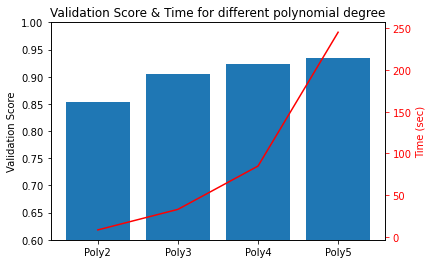

In [33]:
##### PLOT ABOVE VALIDATION SCORES #########
lr_validation_score = {}
for k,v in lr_validation.items():
    mean_score = lr_validation[k]['mean_test_score'].mean()
    lr_validation_score[k] = mean_score

fig, ax1 = plt.subplots()

ax1.bar(lr_validation_score.keys(),lr_validation_score.values())

ax1.set_ylabel('Validation Score')
plt.ylim(0.6,1)
plt.xticks([2,3,4,5], ['Poly2', 'Poly3', 'Poly4', 'Poly5'])

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('Time (sec)',color='red')  # we already handled the x-label with ax1
ax2.plot(lr_time.keys(),lr_time.values(), color='red')
ax2.tick_params(axis='y',color = 'red',labelcolor='red')

plt.title('Validation Score & Time for different polynomial degree')
plt.show()

As it can be seen from the above chart, while the model validation performance improves as we introduce more variables with higher degree of polynomial, the time required to fit such model grow exponentially. We will use polynomial transformer using degree 4 to proceed with the subsequent steps for Feature Selection, since degree 5 does not significantly further improve the validation accuracy.

## Feature Selection with RFE <a id='rfe'/> <br>
Currently using polynomial transformation of degree 4, we created a total of 715 features from the original 9 numerical features. While new features may allow to better capture the non-linearity of the dataset, there may be issues with overfitting and multicollinearity. In addition, the computational cost with additional features are much higher, as demonstrated in the above analysis. In this section, we will try to identify key features which are more critical to the models performance and should be kept. <br><br>
We use the recursive feature elimination function of scikit-learn to reduce the number of dimensions. This method recursively removes less important features based on feature importance (after fitting the subsets of features at current stage).<br><br>
The purpose of this step is to reduce overfitting issues due to high number of features as well as reduce the number of features in the dataset for subsequent steps. We will choose the number of features to keep based on cross_validation score, which can be obtained directly using RFECV of sklearn.

In [34]:
x_train_p4, x_test_p4, y_train, y_test = poly_transform(data,4)

(715,)
(11,)
No of variables on polynomial 4: 726


In [35]:
## This step is running RFECV, which takes very long. We extract the model using pickle for future usage.
# rfe_cv = feature_selection.RFECV(estimator = linear_model.LogisticRegression(C=10000, max_iter = 1000),
#                                  step = 25, min_features_to_select = 50, n_jobs = 6, verbose = 1)
# rfe_cv.fit(x_train_p4,y_train_p4)
# filename = 'rfe_model.sav'
# pickle.dump(rfe_cv, open(filename, 'wb'))

In [36]:
## Reload rfe model
rfe_model = pickle.load(open('pickle_files/rfe_model.sav', 'rb'))

C:\Users\QUAN\anaconda3\lib\site-packages\sklearn\base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 1.0.1 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  warnings.warn(
C:\Users\QUAN\anaconda3\lib\site-packages\sklearn\base.py:329: UserWarning: Trying to unpickle estimator RFECV from version 1.0.1 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  warnings.warn(


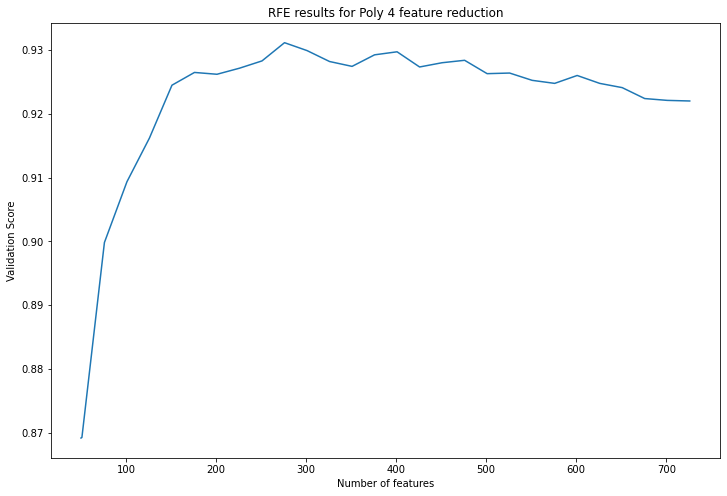

In [37]:
rfe_val_score = rfe_model.cv_results_['mean_test_score']
rfe_features = np.array([50] + list(range(51,727,25)))
plt.figure(figsize = (12,8))
plt.plot(rfe_features, rfe_val_score)
plt.xlabel('Number of features')
plt.ylabel('Validation Score')
plt.title('RFE results for Poly 4 feature reduction')
plt.show()

In [38]:
rfe_model.n_features_

276

After reduction procedure, we are left with 276 features which gives the highest cross-validatation scores. Feature Names for the 276 remaining features are as below:

In [39]:
reduced_poly_feature_names = poly_feature_names[np.where(rfe_model.ranking_ == 1)]
reduced_poly_feature_names

array(['Pletelets', 'Weight', 'Age^2', 'Age Pletelets',
       'Age Blood Pressure', 'Age Weight', 'Sodium Pletelets',
       'Creatinine^2', 'Creatinine Creatinine phosphokinase',
       'Creatinine Weight', 'Pletelets^2',
       'Pletelets Creatinine phosphokinase', 'Pletelets Hemoglobin',
       'Pletelets Weight', 'Creatinine phosphokinase^2',
       'Creatinine phosphokinase Hemoglobin', 'Hemoglobin Height',
       'Hemoglobin Weight', 'Height Weight', 'Weight^2',
       'Age^2 Pletelets', 'Age^2 Blood Pressure', 'Age^2 Height',
       'Age Sodium Pletelets', 'Age Sodium Hemoglobin',
       'Age Sodium Height', 'Age Sodium Weight',
       'Age Creatinine Creatinine phosphokinase',
       'Age Creatinine Blood Pressure', 'Age Creatinine Weight',
       'Age Pletelets^2', 'Age Pletelets Blood Pressure',
       'Age Blood Pressure^2', 'Age Height^2', 'Age Height Weight',
       'Sodium^2 Pletelets', 'Sodium^2 Height', 'Sodium Creatinine^2',
       'Sodium Pletelets Weight', 'Sodium H

## 3. Train/Test split, One-Hot Encoding & Different Data Transformation Function <a id='transform'/>

- Train_test_split: 70% training, 30% testing
- Onehot Encoding for Categorical Variables
- Standard Scaling for Continuous Variables for fitting with loss function.
- Normalization between 0 and 1 for Continuous Variables (For Methods which classifies based on l1/l2 distance instead of loss function)
- Here we defined 3 methods for data transformation which will be used during Model Building:
    1. Standard_Transform: Transform using Standard Scaler fitting data to Gaussian Distribution
    2. Poly_Transform: Transform using a polynomial degree 4 with

In [40]:
## Preprocessing ##
y = data['Survive'].values

def standard_transform(random_state = 2020):
    global cat_var, num_var
    enc = preprocessing.OneHotEncoder(drop = 'first')
    data_cat = enc.fit_transform(data[cat_var])
    column_labels = num_var + list(enc.get_feature_names_out())

    x_train_cat, x_test_cat, y_train, y_test = model_selection.train_test_split(data_cat, y,
                                                                               test_size = 0.3, stratify = y,
                                                                               random_state = random_state)

    x_train_cont, x_test_cont, y_train, y_test = model_selection.train_test_split(data[num_var].values, y, 
                                                                                  test_size = 0.3, stratify = y,
                                                                                  random_state = random_state)

    standard_scl = preprocessing.StandardScaler()
    x_train_cont_scl = standard_scl.fit_transform(x_train_cont)
    x_test_cont_scl = standard_scl.transform(x_test_cont)

    x_train_std = np.concatenate((x_train_cont_scl,x_train_cat.toarray()), axis = 1)
    x_test_std = np.concatenate((x_test_cont_scl,x_test_cat.toarray()), axis = 1)
    return x_train_std, x_test_std, y_train, y_test

In [41]:
def min_max_transform(random_state = 2020):
    global num_var, cat_var
    norm_scl = preprocessing.MinMaxScaler()
    x_cont_norm = norm_scl.fit_transform(data[num_var].values)
    x_train_cont, x_test_cont, y_train, y_test = model_selection.train_test_split(x_cont_norm, y, 
                                                                              test_size = 0.3,stratify = y,
                                                                              random_state = random_state)
    
    enc = preprocessing.OneHotEncoder(drop = 'first')
    data_cat = enc.fit_transform(data[cat_var])
    x_train_cat, x_test_cat, y_train, y_test = model_selection.train_test_split(data_cat, y,
                                                                           test_size = 0.3, stratify = y,
                                                                           random_state = random_state)

    x_train = np.concatenate((x_train_cont,x_train_cat.toarray()), axis = 1)
    x_test = np.concatenate((x_test_cont,x_test_cat.toarray()), axis = 1)
    return x_train, x_test, y_train, y_test

In [42]:
def norm_transform(dist = 'l2', random_state = 2020):
    global num_var, cat_var
    norm_scl = preprocessing.Normalizer(norm = dist)
    x_cont_norm = norm_scl.fit_transform(data[num_var].values)
    x_train_cont, x_test_cont, y_train, y_test = model_selection.train_test_split(x_cont_norm, y, 
                                                                              test_size = 0.3,stratify = y,
                                                                              random_state = random_state)
    
    enc = preprocessing.OneHotEncoder(drop = 'first')
    data_cat = enc.fit_transform(data[cat_var])
    x_train_cat, x_test_cat, y_train, y_test = model_selection.train_test_split(data_cat, y,
                                                                           test_size = 0.3, stratify = y,
                                                                           random_state = random_state)

    x_train = np.concatenate((x_train_cont,x_train_cat.toarray()), axis = 1)
    x_test = np.concatenate((x_test_cont,x_test_cat.toarray()), axis = 1)
    return x_train, x_test, y_train, y_test

In [43]:
def final_poly_transform(random_state = 2020):
    x_train_p4, x_test_p4, y_train, y_test = poly_transform(data,4,random_state)
    rfe_model = pickle.load(open('pickle_files/rfe_model.sav', 'rb'))
    x_train = rfe_model.transform(x_train_p4)
    x_test = rfe_model.transform(x_test_p4)
    print('x_train dimension after rfe: ', x_train.shape)
    return x_train, x_test, y_train, y_test

# III. Predictive Models

## 0. Result definition and Plotting functions <a id='define'/>

In [44]:
result_dict = {}

In [45]:
def print_results(y_pred, y_test):
    results = {'accuracy':metrics.accuracy_score(y_test, y_pred),
               'precision':metrics.precision_score(y_test, y_pred),
              'recall':metrics.recall_score(y_test, y_pred),
              'fbeta':metrics.fbeta_score(y_test, y_pred, beta = 2),
              'roc_auc':metrics.roc_auc_score(y_test, y_pred),
              'y_pred':y_pred}
    
    print('Model Accuracy Score:', results['accuracy'])
    print('Model Recall Score:', results['recall'])
    print('Model FBeta Score (Beta = 2):', results['fbeta'])
    print('Model ROC_AUC Score:', results['roc_auc'])
    
    return results

In [46]:
def plot_decision_boundary_2D (estimator, var1, var2):
    
    from matplotlib.colors import ListedColormap
    
    x_sub = data[[var1,var2]].values
    x_sub_scl = preprocessing.StandardScaler().fit_transform(x_sub)
    x_train, x_test, y_train, y_test = model_selection.train_test_split(x_sub_scl, y, 
                                                                        test_size = 0.3, stratify = y,
                                                                        random_state = 2020)
    model_sub = copy.copy(estimator)
    model_sub.fit(x_train,y_train)
    
#     plot_decision_regions(x_train, y_train, clf = model_sub, legend = 2)
#     plt.xlabel(var1)
#     plt.ylabel(var2)
#     plt.title(var2 + ' vs '+var1)
    
    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    
    # cmap_light = ListedColormap(["blue", "red"])
    # cmap_bold = ["r", "g"]
    color = ['blue','red']
    
    def my_linspace (min_value, max_value, steps):
        diff = max_value - min_value
        return np.linspace (min_value - 0.1 * diff, max_value + 0.1 * diff, steps)
    
    steps = 200
    x0 = my_linspace(min(x_sub_scl[:,0]), max(x_sub_scl[:,0]), steps)
    x1 = my_linspace(min(x_sub_scl[:,1]), max(x_sub_scl[:,1]), steps)
    xx0, xx1 = np.meshgrid(x0, x1)
    mesh_data = np.c_[xx0.ravel(), xx1.ravel()]
       
    Z = model_sub.predict(mesh_data)
    
    Z = Z.reshape(xx0.shape)
    plt.contourf(xx0, xx1, Z, 10, cmap=plt.cm.RdBu, alpha=0.5)
    
    y_test_color = np.array([color[i] for i in y_test])
    y_pred = model_sub.predict(x_test)
    
    plt.scatter(x_test[:,0][y_pred != y_test], x_test[:,1][y_pred != y_test], 
                c=y_test_color[y_pred != y_test], marker='x', s = 100) 
    
    plt.xlim(xx0.min(), xx0.max())
    plt.ylim(xx1.min(), xx1.max())
    
    xmin, xmax = plt.xlim()
    ymin, ymax = plt.ylim()
    plt.xlabel(var1)
    plt.ylabel(var2)
    plt.title(var2 + ' vs '+var1)
    plt.text(xmin + (xmin * 0.05)*np.sign(xmin), ymax * 0.9, model_sub.score(x_test, y_test))

In [47]:
def plot_proba_boundary(model, var1, var2):
    
    def my_linspace (min_value, max_value, steps):
        diff = max_value - min_value
        return np.linspace (min_value - 0.1 * diff, max_value + 0.1 * diff, steps)

    x_sub = data[[var1,var2]].values
    x_sub_scl = preprocessing.StandardScaler().fit_transform(x_sub)
    x_train, x_test, y_train, y_test = model_selection.train_test_split(x_sub_scl, y, 
                                                                        test_size = 0.3,stratify = y,
                                                                        random_state = 2020)
    
    color = ['blue', 'red']

    y_test_color = np.array([color[i] for i in y_test])

    steps = 200
    x0 = my_linspace(min(x_sub_scl[:,0]), max(x_sub_scl[:,0]), steps)
    x1 = my_linspace(min(x_sub_scl[:,1]), max(x_sub_scl[:,1]), steps)
    xx0, xx1 = np.meshgrid(x0, x1)
    mesh_data = np.c_[xx0.ravel(), xx1.ravel()]
    
    model_sub = copy.copy(model)
    model_sub.fit(x_train, y_train)

    mesh_prob = model_sub.predict_proba(mesh_data).reshape(steps, steps, 2)
    plt.contourf(xx0, xx1, mesh_prob[:,:,0], 10, cmap=plt.cm.RdBu, alpha=0.5)
    y_pred = model_sub.predict(x_test)
  #  plt.scatter(x_test[:,0][y_pred == y_test], x_test[:,1][y_pred == y_test], 
  #              c=y_test_color[y_pred == y_test], marker='o', label = 'Correct')
    
    plt.scatter(x_test[:,0][y_pred != y_test], x_test[:,1][y_pred != y_test], 
                c=y_test_color[y_pred != y_test], marker='x', s = 100)    
    
    xmin, xmax = plt.xlim()
    ymin, ymax = plt.ylim()
    plt.xlabel(var1)
    plt.ylabel(var2)
    plt.title(var2 + ' vs '+var1)
    plt.text(xmin + (xmin * 0.05)*np.sign(xmin), ymax * 0.9, model_sub.score(x_test, y_test))

In [48]:
def multi_decision_boundary_2D(model):
    plt.figure(figsize = (36,63))
    ind = 1
    for i in range(5):
        for j in range(i+1,6):
            plt.subplot(7,3,ind)
            ind += 1
            plot_decision_boundary_2D(model,vars[i],vars[j])
    plt.show()

In [49]:
def multi_proba_boundary_2D(model):
    plt.figure(figsize = (36,63))
    ind = 1
    for i in range(5):
        for j in range(i+1,6):
            plt.subplot(7,3,ind)
            ind += 1
            plot_proba_boundary(model,vars[i],vars[j])
    plt.show()

## 1a. K-Nearest Neighbors (KNN) <a id='knn'/>

K-Nearest Neighbors is a lazy classifier which does not perform any model fitting, but classifies samples based on the labels of its K nearest neighbors. There are many ways to compute the distance between samples, the two most common methods are using Manhattan Distance (l1) and Euclidean Distance (l2). For an n-dimension space, the distance between point p and q can be calculated using the two different methods as follow: <br><br>

<center>Manhattan Distance: $d_{l2}(p,q) = \sum_i^n |p_i - q_i|$ </center> <br>
<center>Euclidean Distance: $d_{l1}(p,q) = \sqrt{\sum_i^n (p_i - q_i)^2}$ </center> <br>

In [50]:
x_train, x_test, y_train, y_test = norm_transform() ## Default using l2 norm

In [51]:
knn_base = neighbors.KNeighborsClassifier()
knn_base.fit(x_train, y_train)
y_pred = knn_base.predict(x_test)
print_results(y_test, y_pred)

Model Accuracy Score: 0.8846666666666667
Model Recall Score: 0.8523537803138374
Model FBeta Score (Beta = 2): 0.8397751229796205
Model ROC_AUC Score: 0.8758218223712505


{'accuracy': 0.8846666666666667,
 'precision': 0.7929661579296616,
 'recall': 0.8523537803138374,
 'fbeta': 0.8397751229796205,
 'roc_auc': 0.8758218223712505,
 'y_pred': array([0, 1, 1, ..., 0, 0, 1], dtype=int64)}

The default KNN classifiers set K = 5 and use equal 'uniform' weight for each of the neighbors, meaning that each nearest neighbors has equal voting power in the final classification outcome. We tested another method 'distance' whereby the K nearest neighbors voting power is scaled to the inverse relative distance to the sample (neighbors which are nearer to the sample has more voting power in the final classification.

## Hyper Parameter Tuning for L1/L2 norm

In [52]:
x_train, x_test, y_train, y_test = norm_transform() ## Default using l2 norm

In [53]:
knn_params_grid = {'n_neighbors' : [3,5,7,9,11,13,15],
                  'weights' : ['uniform','distance']}

x_train_l2, x_test_l2, y_train, y_test = norm_transform(dist = 'l2')

knn_grid_l2 = model_selection.GridSearchCV(estimator = neighbors.KNeighborsClassifier(p = 2),
                                       param_grid = knn_params_grid,
                                        cv = cv, scoring = cv_scoring,
                                       n_jobs = 4)
knn_grid_l2.fit(x_train, y_train)
print(knn_grid_l2.best_params_)
print(knn_grid_l2.best_score_)

filename = 'knn_l2_search.sav'
pickle.dump(knn_grid_l2, open(filename, 'wb'))

{'n_neighbors': 3, 'weights': 'distance'}
0.9228571428571429


In [54]:
## Reload knn_l2_grid_search model
#knn_grid_l2 = pickle.load(open('pickle_files/knn_l2_search.sav', 'rb'))

In [55]:
x_train_l1, x_test_l1, y_train, y_test = norm_transform(dist = 'l1')

knn_grid_l1 = model_selection.GridSearchCV(estimator = neighbors.KNeighborsClassifier(p = 1),
                                       param_grid = knn_params_grid, scoring = cv_scoring,
                                       cv = cv, n_jobs = 4)
knn_grid_l1.fit(x_train, y_train)
print(knn_grid_l1.best_params_)
print(knn_grid_l1.best_score_)

filename = 'knn_l1_search.sav'
pickle.dump(knn_grid_l1, open(filename, 'wb'))

{'n_neighbors': 3, 'weights': 'distance'}
0.942952380952381


In [56]:
## Reload knn_l1_grid_search model
# knn_grid_l1 = pickle.load(open('pickle_files/knn_l1_search.sav', 'rb'))

GridSearch on 2 hyperparameters 'n_neighbors' and 'weights' for l1 and l2 norm show that the optimum set of hyperparameters which yields the highest cross-validation score is using 3 Nearest Neighbors using weighted Manhattan distance for the final classifiers. The weighted Manhattan Distance yields (Average Validation Score 95~%) significantly better results compared to Weighted Euclidean Distance (Average Fbeta Score ~92%). In both distance methods, K=3 neighbors yields the best cross validataion score in comparison to other K values. 

In [57]:
manhattan_score = knn_grid_l1.cv_results_['mean_test_score'][list(range(1,15,2))]
euclidean_score = knn_grid_l2.cv_results_['mean_test_score'][list(range(1,15,2))]
knn_labels = [str(i) + ' neighbors' for i in knn_params_grid['n_neighbors']]

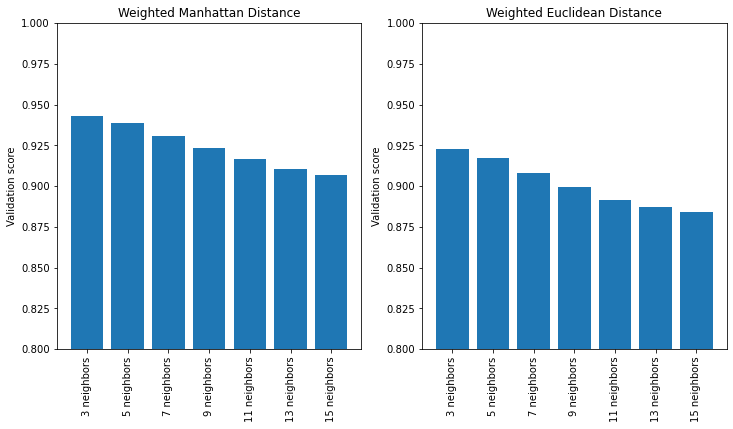

In [58]:
plt.figure(figsize = (12,6))
plt.subplot(1,2,1)
plt.bar(knn_labels,manhattan_score)
plt.ylim(0.8,1)
plt.xticks(rotation = 90)
plt.ylabel('Validation score')
plt.title('Weighted Manhattan Distance')
plt.subplot(1,2,2)
plt.bar(knn_labels,euclidean_score)
plt.ylim(0.8,1)
plt.xticks(rotation = 90)
plt.ylabel('Validation score')
plt.title('Weighted Euclidean Distance')
plt.show()

Finally, we fit all training data on the best model with the set of hyperparameters which yield the best cross validation score. The best model is used for prediction on the test dataset. The Summary of the prediction performance for the best model is found as follow:

In [59]:
best_knn_model = knn_grid_l1.best_estimator_
best_knn_model.fit(x_train_l1, y_train)
y_pred = best_knn_model.predict(x_test_l1)
result_dict['K Nearest Neighbors'] = print_results(y_test, y_pred)

Model Accuracy Score: 0.9364444444444444
Model Recall Score: 0.9167235494880546
Model FBeta Score (Beta = 2): 0.9114972173204833
Model ROC_AUC Score: 0.9313436528329894


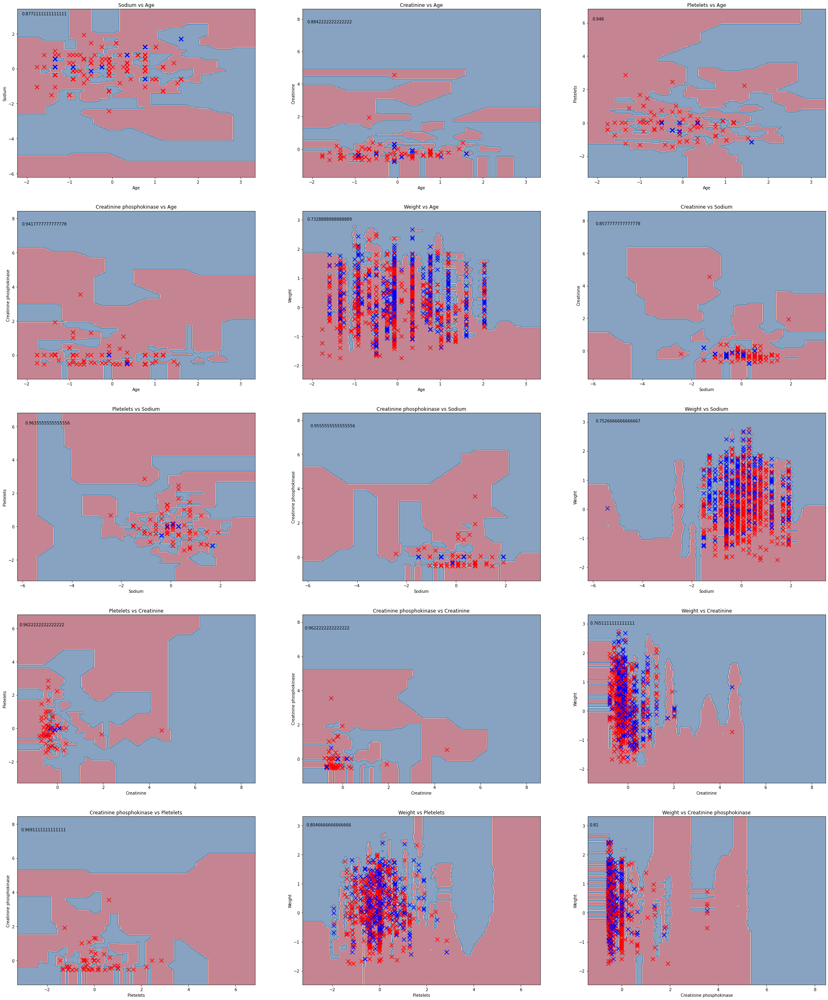

In [60]:
vars = ['Age','Sodium','Creatinine','Pletelets','Creatinine phosphokinase','Weight']
multi_decision_boundary_2D(best_knn_model)

## 1b. Radius Neighbors Classifier <a id='rn'/>

Under the same family with KNN is Radius Neighbor Classifier, which does not fix the number of nearest neighbors, but depending on the neighbors within a certain radius. This method hence is better for handling cases in which there are dense regions with many samples and sparse region with few samples, in which it will not be appropriate to choose the same number of neighbors for both cases.<br><br>
Similarly, the distance can be calculated using both l1 and l2 norm.

In [61]:
x_train_l2, x_test_l2, y_train, y_test = norm_transform()

In [62]:
x_train_l2, x_test_l2, y_train, y_test = norm_transform(random_state = 2024)

rn_params_grid = {'radius' : [0.25,0.5,0.75,1,1.25,1.5],
                  'weights' : ['uniform','distance']}

rn_l2 = model_selection.GridSearchCV(estimator = neighbors.RadiusNeighborsClassifier(p = 2),
                                       param_grid = rn_params_grid,
                                       scoring = 'accuracy', cv = cv,
                                       n_jobs = 4)

rn_l2.fit(x_train_l2, y_train)
print(rn_l2.best_params_)
print(rn_l2.best_score_)

filename = 'rn_l2_search.sav'
pickle.dump(rn_l2, open(filename, 'wb'))

{'radius': 1.25, 'weights': 'distance'}
0.785904761904762


C:\Users\QUAN\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan 0.66704762 0.78590476 0.66514286 0.78533333]
  warnings.warn(


In [63]:
## Reload rn_l2_grid_search model
print_results(y_test,rn_l2.best_estimator_.predict(x_test_l2))

Model Accuracy Score: 0.7844444444444445
Model Recall Score: 0.9268680445151033
Model FBeta Score (Beta = 2): 0.7245836440467314
Model ROC_AUC Score: 0.8440850168325968


{'accuracy': 0.7844444444444445,
 'precision': 0.38686131386861317,
 'recall': 0.9268680445151033,
 'fbeta': 0.7245836440467314,
 'roc_auc': 0.8440850168325968,
 'y_pred': array([0, 0, 0, ..., 0, 0, 0], dtype=int64)}

In [64]:
x_train_l1, x_test_l1, y_train, y_test = norm_transform(dist = 'l1')

rn_l1 = model_selection.GridSearchCV(estimator = neighbors.RadiusNeighborsClassifier(p = 1),
                                       param_grid = rn_params_grid,
                                        cv = cv, scoring = 'accuracy',
                                       n_jobs = 4)

rn_l1.fit(x_train_l1, y_train)
print(rn_l1.best_params_)
print(rn_l1.best_score_)

filename = 'rn_l1_search.sav'
pickle.dump(rn_l1, open(filename, 'wb'))

{'radius': 1.25, 'weights': 'distance'}
0.7984761904761906


C:\Users\QUAN\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan 0.66533333 0.79847619 0.66533333 0.79847619]
  warnings.warn(


In [65]:
## Reload rn_l1_search model
best_rn_model = rn_l1.best_estimator_
best_rn_model.fit(x_train_l1, y_train)
y_pred = best_rn_model.predict(x_test_l1)

result_dict['Radius Neighbors'] = print_results(y_test,best_rn_model.predict(x_test_l1))

Model Accuracy Score: 0.7973333333333333
Model Recall Score: 0.9514415781487102
Model FBeta Score (Beta = 2): 0.7566980448950036
Model ROC_AUC Score: 0.8611672873820875


It can be seen that the performance of Radius Method is much worse compared to the performance of KNN. This can be because the distance between majority of the points are dense and there are not many separated regions in terms of density.

From the decision boundary plots above, it can be observed that there are many points which lie quite far apart from the remaining points. Hence the performance of using a radial method may not yield good result as there may be only a single point in the radius of the sample.

## 1c. Ensemble with K-Nearest Neighbors <a id='ensembleknn'/>

In [66]:
x_train_l1, x_test_l1, y_train, y_test = norm_transform(dist = 'l1')

knn_ensemble_params = {'base_estimator__n_neighbors':[3,5,7,9,11],
                       'max_features':[0.5, 0.75, 1.0]}

# knn_ensemble = model_selection.GridSearchCV(ensemble.BaggingClassifier(base_estimator = neighbors.KNeighborsClassifier(),
#                                                                       n_estimators = 50),
#                                             param_grid = knn_ensemble_params,
#                                             cv = cv, scoring = 'accuracy', n_jobs = 6)

# knn_ensemble.fit(x_train, y_train)
# print(knn_ensemble.best_params_)
# print(knn_ensemble.best_score_)

# filename = 'ensemble_knn.sav'
# pickle.dump(knn_ensemble, open(filename, 'wb'))

In [67]:
knn_ensemble = pickle.load(open('pickle_files/ensemble_knn.sav', 'rb'))
best_knn_ensemble = knn_ensemble.best_estimator_
best_knn_ensemble.fit(x_train, y_train)
y_pred = best_knn_ensemble.predict(x_test)
result_dict['Ensemble (K-NearestNeighbors)'] = print_results(y_test, y_pred)

Model Accuracy Score: 0.9833333333333333
Model Recall Score: 0.9972222222222222
Model FBeta Score (Beta = 2): 0.9880280721067841
Model ROC_AUC Score: 0.9870098039215687


Text(0.5, 1.0, 'Ensemble with KNN')

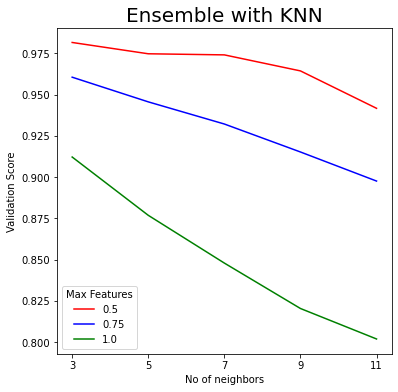

In [68]:
knn_ensemble.cv_results_['params']
colors = ['red','blue','green']
plt.figure(figsize = (6,6))
for i in range(len(knn_ensemble_params['max_features'])):
    plt.plot([str(j) for j in knn_ensemble_params['base_estimator__n_neighbors']],
            knn_ensemble.cv_results_['mean_test_score'][i::3],
            color = colors[i], label = knn_ensemble_params['max_features'][i])
plt.legend(loc = 'lower left',title="Max Features")
plt.xlabel('No of neighbors')
plt.ylabel('Validation Score')
plt.title('Ensemble with KNN',fontsize = 20)

## 2a. Decision Tree <a id='dt'/>
Decision Tree Classification is a method which involves "recursively partitioning the input space and defining a local model in each resulting region of input space. This can be represented by a tree, with one leaf per region" (Kevin P.Murphy: Machine Learning, A probabilistic Perspective). The idea is to split the tree so that the childrens of the binary trees provide some additional information to help classifying the input data into different classes. By running down a trained tree from the root to a certain leave node, we can classify the sample output based on the route that it has taken and the final leaf node which it arrives at the end of the traversal.

A decision tree is built using the training dataset. The choices of features chosen at each step are based on the amount of information gained that the features split will give, which are the differences in purity/impurity before and after the split. We pick the feature split that maximizes the information gain. There are two common ways to quantify the amount of impurity at certain nodes: Gini Impurity and Entropy.

- $ Entropy = \large -\sum_i^n(p_ilog(p_i)) $ <br><br> 
- $ Gini\_Impurity = 1 - \sum_i \large \frac{|S_i|}{|S|} $ <br>

### Basic Decision Tree

In [69]:
x_train, x_test, y_train, y_test = standard_transform()

In [70]:
base_tree = tree.DecisionTreeClassifier(criterion = 'gini',
                                     random_state = 2022)
base_tree.fit(x_train, y_train)

DecisionTreeClassifier(random_state=2022)

In [71]:
y_pred = base_tree.predict(x_test)
print_results(y_pred, y_test)

Model Accuracy Score: 0.9606666666666667
Model Recall Score: 0.948905109489051
Model FBeta Score (Beta = 2): 0.9460174649378141
Model ROC_AUC Score: 0.9577469082360057


{'accuracy': 0.9606666666666667,
 'precision': 0.934640522875817,
 'recall': 0.948905109489051,
 'fbeta': 0.9460174649378141,
 'roc_auc': 0.9577469082360057,
 'y_pred': array([0, 1, 1, ..., 0, 0, 1], dtype=int64)}

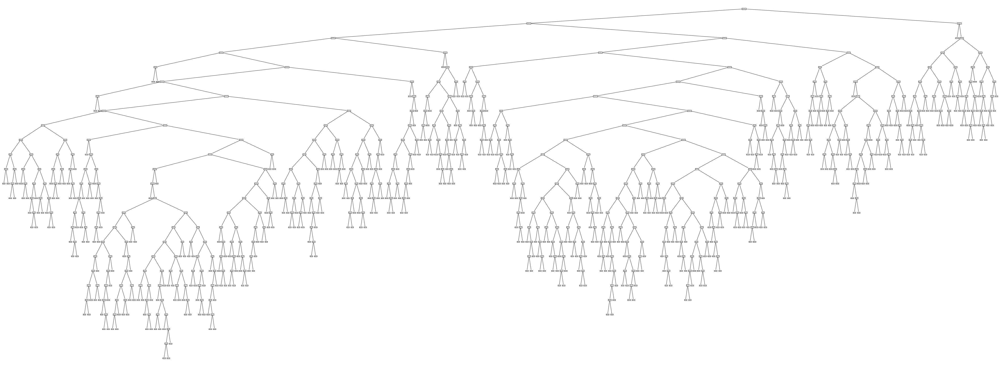

In [72]:
plt.figure(figsize = (80,30))
tree.plot_tree(base_tree)
plt.show()

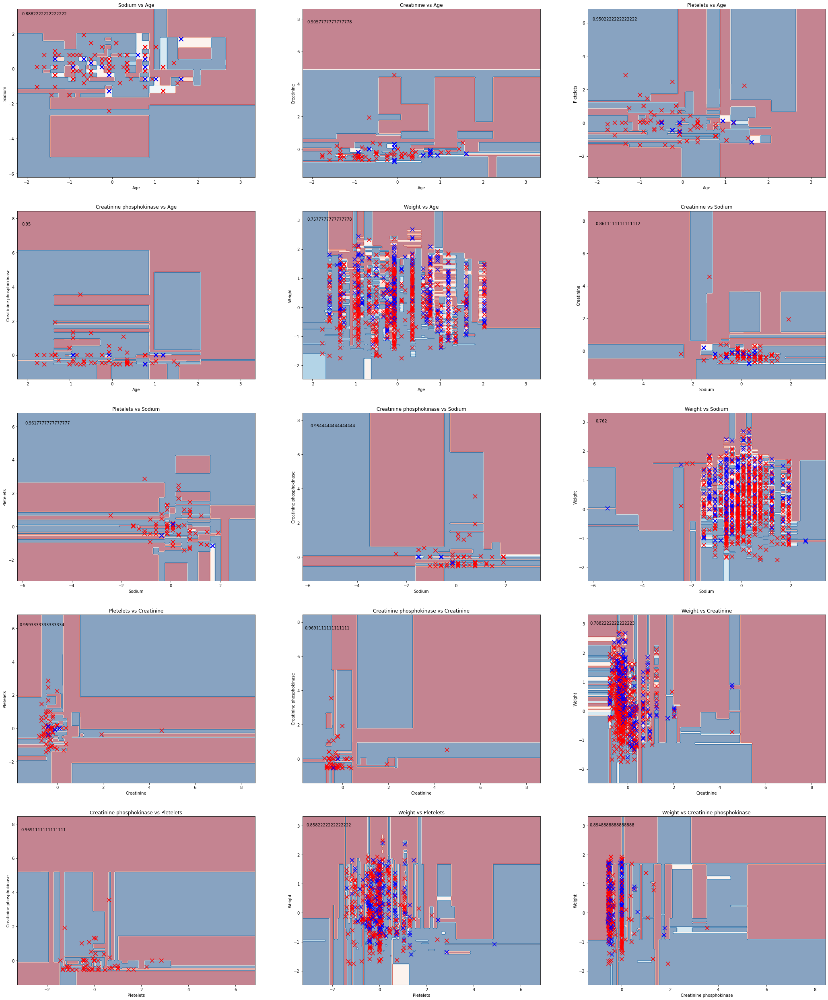

In [73]:
multi_proba_boundary_2D(tree.DecisionTreeClassifier(criterion = 'gini',
                                         random_state = 2022))

### Pre-Prune using GridSearch

In [74]:
x_train, x_test, y_train, y_test = standard_transform()

In [75]:
dt_params_grid = {'max_depth' : [10,15,20,25,30,35],
                  'min_samples_split' : [10,15,20,25,30,35],
                  'min_samples_leaf' : [5,10,15,20,25,30]
                  }

# dt_pre_prune = model_selection.GridSearchCV(tree.DecisionTreeClassifier(criterion = 'gini',
#                                                                        random_state = 2022),
#                                            param_grid = dt_params_grid,
#                                             cv = cv, scoring = cv_scoring,
#                                            n_jobs = 6)
# dt_pre_prune.fit(x_train, y_train)
# print('Best set of hyperparameters:',dt_pre_prune.best_params_)
# print('Validation Score on best set of hyperparameters',dt_pre_prune.best_score_)

# filename = 'dt_grid_search.sav'
# pickle.dump(dt_pre_prune, open(filename, 'wb'))

In [76]:
## Reload dt_grid_search model
dt_pre_prune = pickle.load(open('pickle_files/dt_grid_search.sav', 'rb'))

In [77]:
best_dt_pre_prunt = dt_pre_prune.best_estimator_
best_dt_pre_prunt.fit(x_train, y_train)
y_pred = best_dt_pre_prunt.predict(x_test)
result_dict['Pre-prune Tree'] = print_results(y_pred, y_test)

Model Accuracy Score: 0.9717777777777777
Model Recall Score: 0.9382879893828799
Model FBeta Score (Beta = 2): 0.9456928838951311
Model ROC_AUC Score: 0.9634640748785431


### Post-Prune using Cost Complexity Penalty method <br>

Cost Complexity Pruning assigns a regularization factor which penalizes the tree for having additional nodes. This method is analogous to regularization in linear models such as linear regression and logistic regression. The general formula for the cost/misclassification rate governed by the cost complexity method is as follow: <br><br>
<center> $ \large R_\alpha(T) = R(T) + \alpha  T $ </center> <br>
where T is the number of terminal nodes of the tree, $\alpha$ is the penalty per terminal nodes, R(T) is the objective cost function which we want to minimize.

Scikit-learn Tree Classifier traces the ccp_alpha values for each node by the tree.cost_complexity_pruning_path method when splitting occurs. For each alpha values, we will build a tree using a training dataset and validate the performance of the tree against a validation dataset. The alpha values which gives the highest score will be then used to fit against the entire the training data to form the optimum tree.

In [78]:
alphas = base_tree.cost_complexity_pruning_path(x_train, y_train)['ccp_alphas']
ccp_params = {'ccp_alpha':list(alphas)}

# ccp_grid = model_selection.GridSearchCV(estimator = tree.DecisionTreeClassifier(criterion = 'gini', random_state = 2022),
#                                        param_grid = ccp_params, cv = cv, scoring = cv_scoring, n_jobs = 6)
# ccp_grid.fit(x_train, y_train)
# print('Best set of hyperparameters:',ccp_grid.best_params_)
# print('Number of Nodes removed:',np.where(alphas == ccp_grid.best_params_['ccp_alpha'])[0][0])
# print('Validation Score on best set of hyperparameters',ccp_grid.best_score_)

# filename = 'ccp_grid_search.sav'
# pickle.dump(ccp_grid, open(filename, 'wb'))

In [79]:
## Reload ccp_grid_search model
ccp_grid = pickle.load(open('pickle_files/ccp_grid_search.sav', 'rb'))

In [80]:
best_dt_CCP = ccp_grid.best_estimator_
best_dt_CCP.fit(x_train, y_train)
y_pred = best_dt_CCP.predict(x_test)
result_dict['CCP Tree'] = print_results(y_pred, y_test)

Model Accuracy Score: 0.9762222222222222
Model Recall Score: 0.9442601194426012
Model FBeta Score (Beta = 2): 0.9519668183034521
Model ROC_AUC Score: 0.9682877610243411


For each cost per node, we performed a 10-fold Cross Validation on Accuracy score to find the trees which gives the best mean validation score. In this case, CCP post-pruning procedure removed 109 nodes from the original tree. The CCP_alpha cost per node in the best tree is 0.00020277. The Accuracy score for the CCP method is 97.6%, which is better than base tree as well as best tree using pre-prune method.

In [81]:
validation_score = [0] * len(alphas)
training_score = [0] * len(alphas)
for ind in range(len(alphas)):
    ccp_val = alphas[ind]
    print('The CCP alpha value for Node' + str(ind+1) + ' to be removed:',ccp_val)
    alpha_tree = tree.DecisionTreeClassifier(criterion = 'gini',random_state = 2022,ccp_alpha = ccp_val)
    alpha_tree.fit(x_train, y_train)
    y_train_pred = alpha_tree.predict(x_train)
    training_score[ind] = metrics.fbeta_score(y_train, y_train_pred, beta=2)
    validation_score[ind] = model_selection.cross_val_score(estimator = alpha_tree, X = x_train, y = y_train,
                                                           scoring = cv_scoring, cv = 5, verbose = 1, n_jobs = 6).mean()

The CCP alpha value for Node1 to be removed: 0.0


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    1.5s finished


The CCP alpha value for Node2 to be removed: 4.681194511702989e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    1.0s finished
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.


The CCP alpha value for Node3 to be removed: 4.7328687572590075e-05


[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.


The CCP alpha value for Node4 to be removed: 4.755884654746762e-05


[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.


The CCP alpha value for Node5 to be removed: 5.411942554799698e-05


[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node6 to be removed: 6.105006105006109e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node7 to be removed: 6.137566137566135e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node8 to be removed: 6.14439324116743e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node9 to be removed: 6.167800453514739e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node10 to be removed: 6.186406186406181e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node11 to be removed: 6.198034769463338e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node12 to be removed: 6.21963070942663e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node13 to be removed: 6.245120999219352e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node14 to be removed: 6.246799795186892e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node15 to be removed: 6.276226965882125e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node16 to be removed: 6.280193236714963e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node17 to be removed: 6.285072951739606e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node18 to be removed: 6.290143964562561e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node19 to be removed: 6.300366300366279e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node20 to be removed: 6.302157676108763e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node21 to be removed: 6.304806304806285e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node22 to be removed: 6.316478481426961e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node23 to be removed: 6.31730078966259e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node24 to be removed: 6.349206349206349e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node25 to be removed: 7.08163265306122e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node26 to be removed: 7.92882379973032e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node27 to be removed: 7.936507936507937e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node28 to be removed: 7.997641105787937e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node29 to be removed: 8.14000814000813e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node30 to be removed: 8.465608465608466e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node31 to be removed: 8.571428571428574e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node32 to be removed: 8.616780045351474e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node33 to be removed: 8.695652173913041e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node34 to be removed: 8.791208791208787e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node35 to be removed: 8.828562871689562e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node36 to be removed: 8.843537414965989e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node37 to be removed: 8.843537414965989e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node38 to be removed: 8.88888888888889e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node39 to be removed: 8.88888888888889e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node40 to be removed: 9.047619047619045e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node41 to be removed: 9.05923344947735e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node42 to be removed: 9.070294784580502e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node43 to be removed: 9.091338768758108e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node44 to be removed: 9.109730848861285e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node45 to be removed: 9.116644381000571e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node46 to be removed: 9.146997929606641e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node47 to be removed: 9.157509157509163e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node48 to be removed: 9.189406631267086e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node49 to be removed: 9.195402298850568e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node50 to be removed: 9.216589861751147e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node51 to be removed: 9.226190476190476e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node52 to be removed: 9.241182676643273e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node53 to be removed: 9.242829044809269e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node54 to be removed: 9.243697478991595e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node55 to be removed: 9.2453721518829e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node56 to be removed: 9.262883235485981e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node57 to be removed: 9.266409266409275e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node58 to be removed: 9.285714285714278e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node59 to be removed: 9.291521486643442e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node60 to be removed: 9.291521486643442e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node61 to be removed: 9.333333333333336e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node62 to be removed: 9.359795335405063e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node63 to be removed: 9.367681498829028e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node64 to be removed: 9.384311037878405e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node65 to be removed: 9.386776293251121e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node66 to be removed: 9.409955821721255e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node67 to be removed: 9.415584415584434e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node68 to be removed: 9.432234432234449e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node69 to be removed: 9.441842310694797e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node70 to be removed: 9.447783731182132e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node71 to be removed: 9.469696969696951e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node72 to be removed: 9.478935698447878e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node73 to be removed: 9.48157940639143e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node74 to be removed: 9.49900793650796e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node75 to be removed: 9.519428956150319e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node76 to be removed: 9.645909645909637e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node77 to be removed: 9.723870007211492e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node78 to be removed: 9.787346112534104e-05


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node79 to be removed: 0.00010215453117647566


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node80 to be removed: 0.0001087282039252485


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node81 to be removed: 0.00012078977932636467


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node82 to be removed: 0.0001218011013929381


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node83 to be removed: 0.00012523262178434612


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node84 to be removed: 0.0001260625190941456


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node85 to be removed: 0.00012698412698412698


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node86 to be removed: 0.00012698412698412698


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node87 to be removed: 0.00012698412698412698


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node88 to be removed: 0.00013057620688600342


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node89 to be removed: 0.00013544973544973537


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node90 to be removed: 0.00014285714285714287


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node91 to be removed: 0.00014285714285714287


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node92 to be removed: 0.00014545737554422418


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node93 to be removed: 0.00014766049316450395


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node94 to be removed: 0.00015238095238095234


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node95 to be removed: 0.00015238095238095234


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node96 to be removed: 0.00015873015873015873


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node97 to be removed: 0.00016099773242630392


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node98 to be removed: 0.00017173955296404295


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node99 to be removed: 0.00017264202978488688


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node100 to be removed: 0.0001728110599078342


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node101 to be removed: 0.0001743757259001161


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node102 to be removed: 0.0001777777777777778


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node103 to be removed: 0.00017989417989417992


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node104 to be removed: 0.00018270165208940714


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node105 to be removed: 0.00018307838561921984


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node106 to be removed: 0.0001836734693877551


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node107 to be removed: 0.00018390804597701136


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node108 to be removed: 0.00018452380952380953


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node109 to be removed: 0.00018571428571428555


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node110 to be removed: 0.00018583042973286884


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node111 to be removed: 0.00018668882438105795


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node112 to be removed: 0.00018674136321195168


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node113 to be removed: 0.00018719211822660126


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node114 to be removed: 0.00018765944574262658


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node115 to be removed: 0.0001900826446280974


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node116 to be removed: 0.00020994042800459757


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node117 to be removed: 0.00021468327590776594


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node118 to be removed: 0.00022677376171352146


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node119 to be removed: 0.00022857142857142857


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node120 to be removed: 0.00023313588313588363


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node121 to be removed: 0.0002688018857669224


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node122 to be removed: 0.0002928104575163398


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node123 to be removed: 0.0003047619047619047


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node124 to be removed: 0.0003157369614512471


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node125 to be removed: 0.00032941176470588243


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node126 to be removed: 0.0003333333333333333


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node127 to be removed: 0.00035324675324675326


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node128 to be removed: 0.0003585083559168916


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node129 to be removed: 0.0003643892339544514


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node130 to be removed: 0.00040634920634920635


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node131 to be removed: 0.00040719954807562326


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node132 to be removed: 0.0004589089457399797


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node133 to be removed: 0.0005052658784002067


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node134 to be removed: 0.0005407690780173694


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node135 to be removed: 0.0006171428571428569


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node136 to be removed: 0.0007030060450330241


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node137 to be removed: 0.0007223252937538649


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node138 to be removed: 0.0007450670876085236


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node139 to be removed: 0.0008021881010183808


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node140 to be removed: 0.0008673469387755103


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node141 to be removed: 0.0008831746031746021


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node142 to be removed: 0.0008994319131161237


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node143 to be removed: 0.0009285714285714286


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node144 to be removed: 0.0010216435195616325


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node145 to be removed: 0.0010504595568634973


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node146 to be removed: 0.0010740740740740739


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node147 to be removed: 0.0010884353741496598


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node148 to be removed: 0.001116279069767442


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node149 to be removed: 0.0011913667463029094


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node150 to be removed: 0.0012264808362369341


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node151 to be removed: 0.001233139515784633


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node152 to be removed: 0.0012554704970435284


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node153 to be removed: 0.001369068835487543


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node154 to be removed: 0.0013953593161513962


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node155 to be removed: 0.001413589092899438


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node156 to be removed: 0.0014745614745614718


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node157 to be removed: 0.0015028507666690516


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node158 to be removed: 0.0016507197696043138


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node159 to be removed: 0.0018013211958865876


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node160 to be removed: 0.0018541751439096787


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node161 to be removed: 0.0018866959413234045


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node162 to be removed: 0.0019205601217656021


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node163 to be removed: 0.0019622641509433963


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node164 to be removed: 0.0021908577585204037


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node165 to be removed: 0.0022222786909142263


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node166 to be removed: 0.0022905341817786177


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node167 to be removed: 0.0023796947341187535


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node168 to be removed: 0.002546938775510204


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node169 to be removed: 0.002734511317125117


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node170 to be removed: 0.0029020275499148734


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node171 to be removed: 0.0032307692307692315


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node172 to be removed: 0.0033195338451112617


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node173 to be removed: 0.003371950804250727


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node174 to be removed: 0.0033946919528302466


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node175 to be removed: 0.0034822479186397866


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node176 to be removed: 0.003718078408499824


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node177 to be removed: 0.0037560915275200992


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node178 to be removed: 0.0037977553568144104


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node179 to be removed: 0.003875830560368266


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node180 to be removed: 0.003957059383068352


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node181 to be removed: 0.003962302581851454


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node182 to be removed: 0.004142859459717346


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node183 to be removed: 0.004831671555393028


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node184 to be removed: 0.005067883012312964


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node185 to be removed: 0.0051419486940188636


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node186 to be removed: 0.00516748144255471


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node187 to be removed: 0.005554535245940188


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node188 to be removed: 0.006496124651725374


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node189 to be removed: 0.0072270863282137415


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node190 to be removed: 0.008740408889265687


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node191 to be removed: 0.008928826038470042


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node192 to be removed: 0.009080287929125139


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node193 to be removed: 0.00979590109825114


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node194 to be removed: 0.011453372322497199


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished


The CCP alpha value for Node195 to be removed: 0.01618496947152981


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node196 to be removed: 0.02845243646683754


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


The CCP alpha value for Node197 to be removed: 0.06837084669479815


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished


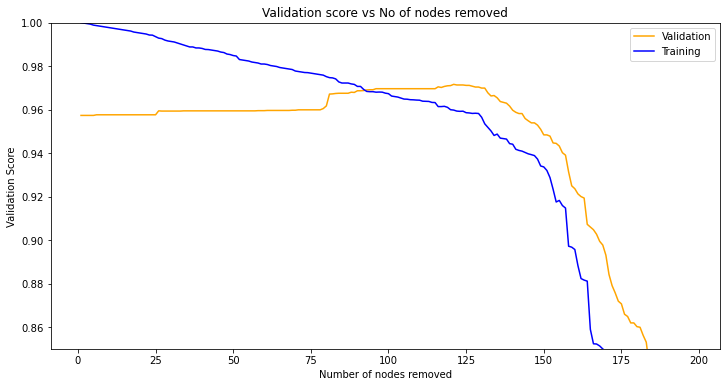

In [82]:
plt.figure(figsize = (12,6))
plt.plot(list(range(1,len(alphas)+1)),validation_score,color = 'orange', label = 'Validation')
plt.plot(list(range(1,len(alphas)+1)),training_score,color = 'blue', label = 'Training')
plt.ylim(0.85,1)
plt.legend()
plt.xlabel('Number of nodes removed')
plt.ylabel('Validation Score')
plt.title('Validation score vs No of nodes removed')
plt.show()

It can be observed from the plot of cross-validation score against number of nodes removed that by removing some nodes at the beginning of the pruning process, our cross validation improved as we reduce the overfitting effect (variance). As we continue to remove more nodes, towards the end, the score decreases quickly when there are only fewer nodes remaining, indicating the tree has high bias and not fitting well to the training data.

Text(0.5, 1.0, 'Feature Importance on best CCP tree')

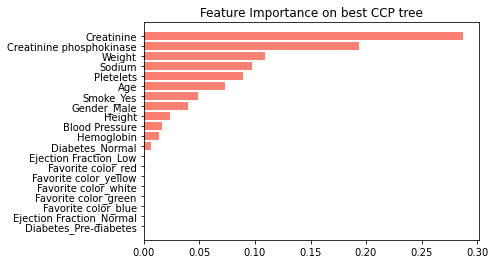

In [83]:
import operator
ccp_tree_feature_importance = {column_labels[i] : best_dt_CCP.feature_importances_[i]
                                for i in range(len(best_dt_CCP.feature_importances_))}
ccp_feature_importance = dict(sorted(ccp_tree_feature_importance.items(), key=operator.itemgetter(1)))
plt.barh(list(ccp_feature_importance.keys()),list(ccp_feature_importance.values()),color = 'salmon')
plt.title('Feature Importance on best CCP tree')

From the list above, it can be observed that the most important features to classify the survivability of a heart disease patient is the levels of Creatinine, Creatinine phosphokinase, Age and Weight. On the other hand, features such as favorite colors have no impact on the classification results. <br><br>
This observation matches with the industrial knowledge. Many studies have shown that a rise in Creatinine and Creatinine Phosphokinase level correlates to higher risks of heart failures. On the other hand, it is also expected that favorite color choice should have no impact on the survivability of the patient.

## 2b. Ensemble Methods

Ensemble models try to combine many weakers classifiers to reduce variance and bias of the entire classifier. In this exercise, we will explore two main families of ensembles which use homogenuous classifiers (Bagging and Boosting). The base classifier used will be decision trees. 

## Bagging

For bagging, bootstrap datasets are created to fit many weaker trees, all of which are independent to each other. All sub-classiifers have similar weight in the final classification. Final classification uses either voting (class with the most votes) or using the aggregated probability function: <br> <br>

<center> $ \large c^* (x) = argmax_c \sum_{i=1}^k p(c|h_i, x) $ </center> <br>
    
where c is the classification labels, x is the input, $h_i$ is the sub classifier, k = total number of sub classifiers.

### RandomForest <a id='rf'/>

In [84]:
x_train, x_test, y_train, y_test = standard_transform()

In [85]:
####  Fit multiple rf gridsearches  ####

rf_params = [('max_depth',[15,20,25,30]),
             ('min_samples_split',[10,20,30,40]),
             ('min_samples_leaf',[10,20,30,40])]

n_estimators_list = list(range(20,105,5))

# rf_grids = []

# for k,v in rf_params:
#     rf_sub_params = {'n_estimators' : n_estimators_list,
#                       k : v}
#     grid_rf = model_selection.GridSearchCV(ensemble.RandomForestClassifier(criterion = 'gini',random_state = 2022, oob_score = True),
#                                           param_grid = rf_sub_params, scoring = cv_scoring,
#                                           cv = cv, n_jobs = 6)
#     grid_rf.fit(x_train, y_train)
#     print('Best set of hyperparameters:',grid_rf.best_params_)
#     print('Validation Score on best set of hyperparameters',grid_rf.best_score_)
#     rf_grids.append(grid_rf)

# filename = 'rf_grid_search1.sav'
# pickle.dump(rf_grids, open(filename, 'wb'))

In [86]:
## Reload rf_grids model
rf_grids = pickle.load(open('pickle_files/rf_grid_search1.sav', 'rb'))

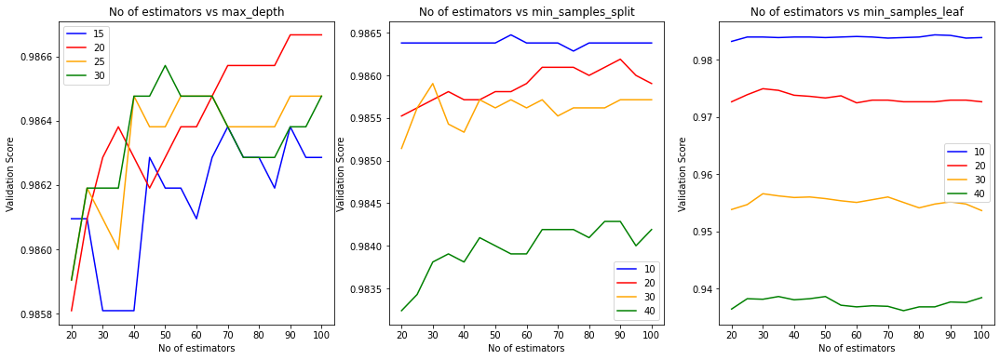

In [87]:
plt.figure(figsize = (18,6))
ind = 1
for j in range(len(rf_grids)):
    rf_result = rf_grids[j].cv_results_['mean_test_score']
    colors = ['blue','red','orange','green']
    labels = rf_params[j][1]
    estimators_no = len(n_estimators_list)
    plt.subplot(1,3,ind)
    for i in range(len(labels)):
        plt.plot(n_estimators_list,rf_result[0+estimators_no*i : (i+1)*estimators_no],
                color = colors[i], label = labels [i])
    plt.legend()
    plt.xlabel('No of estimators')
    plt.ylabel('Validation Score')
    plt.title('No of estimators vs ' + rf_params[j][0])
    ind += 1

In [88]:
rf_final_params = {'max_depth':[20,22,24,26,28,30],
             'min_samples_split':[10,20,30],
             'min_samples_leaf':[5,10,15,20]}

# rf_final_grid = model_selection.GridSearchCV(ensemble.RandomForestClassifier(n_estimators = 100, criterion = 'gini',
#                                                                              random_state = 2022, oob_score = True),
#                                              param_grid = rf_final_params, scoring = cv_scoring, cv = cv, n_jobs = 6)

# rf_final_grid.fit(x_train, y_train)

# print('Best set of hyperparameters:',rf_final_grid.best_params_)
# print('Validation Score on best set of hyperparameters',rf_final_grid.best_score_)

# filename = 'rf_grid_search_final.sav'
# pickle.dump(rf_final_grid, open(filename, 'wb'))

In [89]:
## Reload rf_grids model
rf_final_grid = pickle.load(open('pickle_files/rf_grid_search_final.sav', 'rb'))
print('Best set of hyperparameters:',rf_final_grid.best_params_)
print('Validation Score on best set of hyperparameters',rf_final_grid.best_score_)

best_rf = rf_final_grid.best_estimator_
best_rf.fit(x_train,y_train)
y_pred = best_rf.predict(x_test)
result_dict['Random Forest Classifier'] = print_results(y_test, y_pred)

Best set of hyperparameters: {'max_depth': 20, 'min_samples_leaf': 5, 'min_samples_split': 10}
Validation Score on best set of hyperparameters 0.9860000000000001
Model Accuracy Score: 0.9855555555555555
Model Recall Score: 1.0
Model FBeta Score (Beta = 2): 0.9910652920962197
Model ROC_AUC Score: 0.9893721386527141


Text(0.5, 1.0, 'Feature Importance on best Random Forest model')

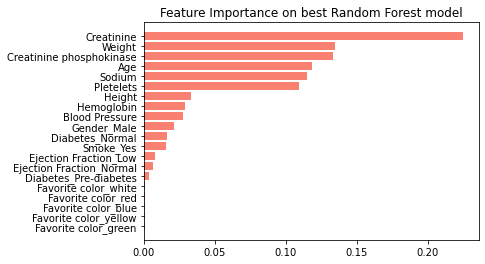

In [90]:
rf_feature_importance = {column_labels[i] : best_rf.feature_importances_[i]
                                for i in range(len(best_rf.feature_importances_))}
rf_feature_importance = dict(sorted(rf_feature_importance.items(), key=operator.itemgetter(1)))
plt.figure(figsize = (6,4))
plt.barh(list(rf_feature_importance.keys()),list(rf_feature_importance.values()),color = 'salmon')
plt.title('Feature Importance on best Random Forest model')

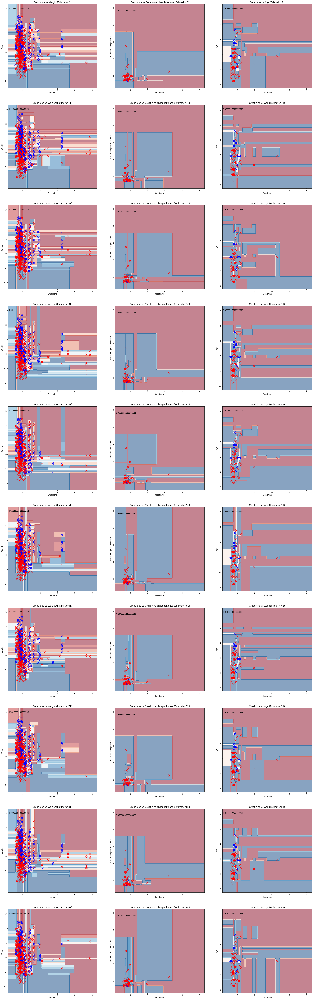

In [91]:
plt.figure(figsize = (30,100))
ind = 1
for i in range(0,len(best_rf.estimators_),10):
    plt.subplot(10,3,ind)
    plot_proba_boundary(best_rf[i],'Creatinine','Weight')
    plt.title(f'Creatinine vs Weight (Estimator {i+1})')
    ind += 1
    plt.subplot(10,3,ind)
    plot_proba_boundary(best_rf[i],'Creatinine','Creatinine phosphokinase')
    plt.title(f'Creatinine vs Creatinine phosphokinase (Estimator {i+1})')
    ind += 1
    plt.subplot(10,3,ind)
    plot_proba_boundary(best_rf[i],'Creatinine','Age')
    plt.title(f'Creatinine vs Age (Estimator {i+1})')
    ind += 1

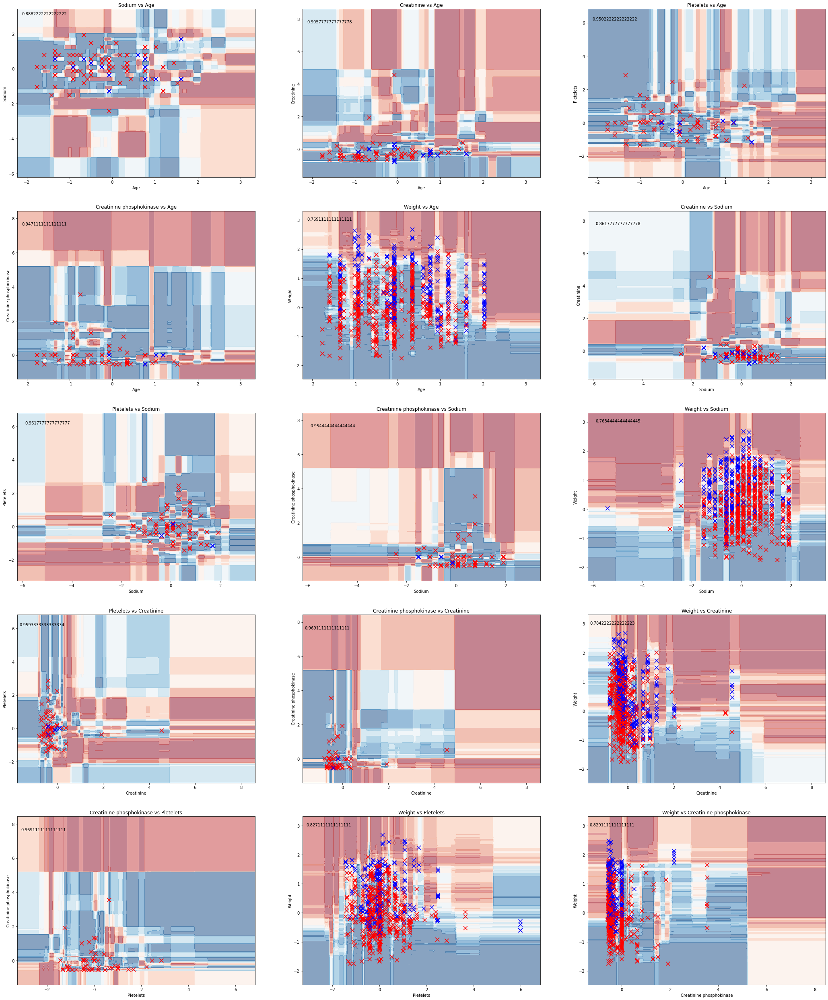

In [92]:
multi_proba_boundary_2D(best_rf)

### ExtraTreesClassifier <a id='et'/>

In extremely randomized trees (ExtraTreesClassifier), further randomness is introduced when splits are computed. When a random subset of candidate features is used (similar to RF), instead of looking for the most discriminative thresholds, thresholds are drawn at random for each candidate feature and the best of these randomly-generated thresholds is picked as the splitting rule.<br><br>

The advantage of this is that variance is reduced further at the expense of increasing bias.

In [93]:
x_train, x_test, y_train, y_test = standard_transform()

In [94]:
et_final_params = {'max_depth':[20,22,24,26,28,30],
             'min_samples_split':[10,20,30],
             'min_samples_leaf':[5,10,15,20]}

# et_final_grid = model_selection.GridSearchCV(ensemble.ExtraTreesClassifier(n_estimators = 100, criterion = 'gini',
#                                                                                random_state = 2022, bootstrap = True,
#                                                                            oob_score = True),
#                                              param_grid = et_final_params, scoring = cv_scoring,
#                                              cv = cv, n_jobs = 6)

# et_final_grid.fit(x_train, y_train)

# print('Best set of hyperparameters:',et_final_grid.best_params_)
# print('Validation Score on best set of hyperparameters',et_final_grid.best_score_)

# filename = 'et_grid_search.sav'
# pickle.dump(et_final_grid, open(filename, 'wb'))

In [95]:
## Reload et_grid_search model
et_final_grid = pickle.load(open('pickle_files/et_grid_search.sav', 'rb'))
print('Best set of hyperparameters:',et_final_grid.best_params_)
print('Validation Score on best set of hyperparameters',et_final_grid.best_score_)

best_et = et_final_grid.best_estimator_
best_et.fit(x_train,y_train)
y_pred = best_et.predict(x_test)
result_dict['ExtraTree Classifier'] = print_results(y_test, y_pred)

Best set of hyperparameters: {'max_depth': 28, 'min_samples_leaf': 5, 'min_samples_split': 10}
Validation Score on best set of hyperparameters 0.9740952380952381
Model Accuracy Score: 0.9757777777777777
Model Recall Score: 0.9992857142857143
Model FBeta Score (Beta = 2): 0.9842408892641059
Model ROC_AUC Score: 0.9822235023041476


Text(0.5, 1.0, 'Feature Importance on best Extra Trees model')

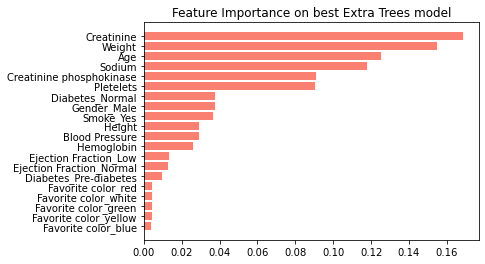

In [96]:
et_feature_importance = {column_labels[i] : best_et.feature_importances_[i]
                                for i in range(len(best_et.feature_importances_))}
et_feature_importance = dict(sorted(et_feature_importance.items(), key=operator.itemgetter(1)))
plt.barh(list(et_feature_importance.keys()),list(et_feature_importance.values()),color = 'salmon')
plt.title('Feature Importance on best Extra Trees model')

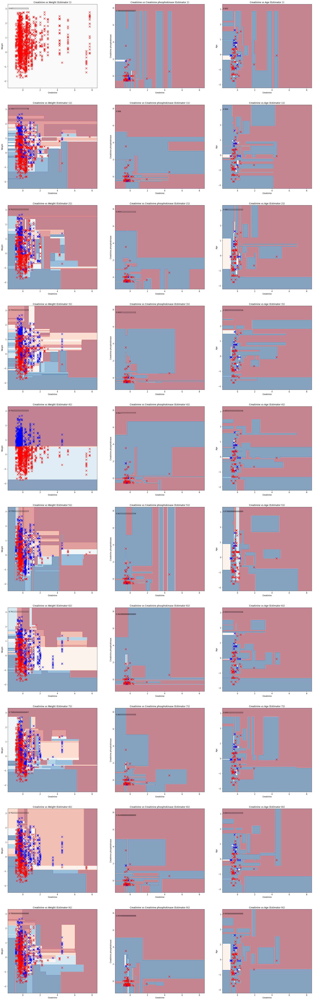

In [97]:
plt.figure(figsize = (30,100))
ind = 1
for i in range(0,len(best_et.estimators_),10):
    plt.subplot(10,3,ind)
    plot_proba_boundary(best_et[i],'Creatinine','Weight')
    plt.title(f'Creatinine vs Weight (Estimator {i+1})')
    ind += 1
    plt.subplot(10,3,ind)
    plot_proba_boundary(best_et[i],'Creatinine','Creatinine phosphokinase')
    plt.title(f'Creatinine vs Creatinine phosphokinase (Estimator {i+1})')
    ind += 1
    plt.subplot(10,3,ind)
    plot_proba_boundary(best_et[i],'Creatinine','Age')
    plt.title(f'Creatinine vs Age (Estimator {i+1})')
    ind += 1

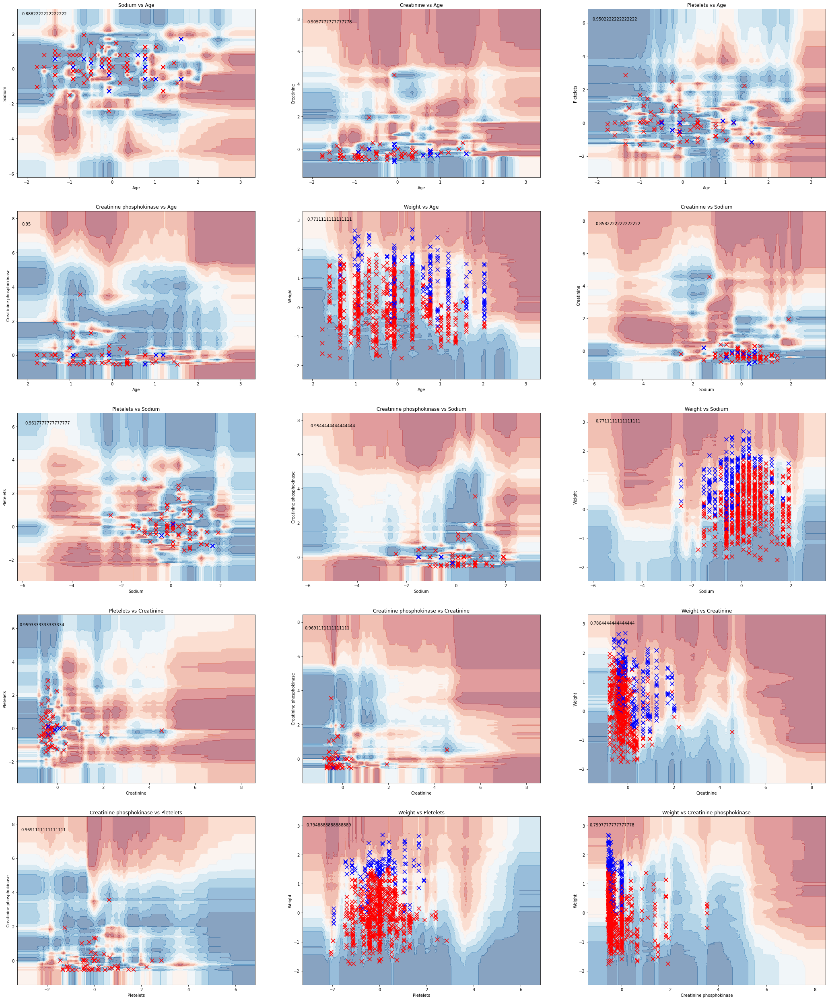

In [98]:
multi_proba_boundary_2D(best_et)

### BaggingClassifier with Trees <a id='bag'/>

In [99]:
x_train, x_test, y_train, y_test = standard_transform()

In [100]:
bag_final_params = {'max_samples':[0.3,0.4,0.5,0.6],
                    'max_features':[0.3,0.4,0.5,0.6]}

# bag_final_grid = model_selection.GridSearchCV(ensemble.BaggingClassifier(base_estimator = tree.DecisionTreeClassifier(criterion = 'gini',
#                                                                 max_depth = 10, min_samples_leaf = 5, 
#                                                                 min_samples_split = 15, random_state = 2022),
#                                                                 n_estimators = 50, oob_score = True,random_state = 2022),
#                                              param_grid = bag_final_params, scoring = cv_scoring, cv = cv, n_jobs = 6)

# bag_final_grid.fit(x_train, y_train)

# print('Best set of hyperparameters:',bag_final_grid.best_params_)
# print('Validation Score on best set of hyperparameters',bag_final_grid.best_score_)

# filename = 'bag_grid_search.sav'
# pickle.dump(bag_final_grid, open(filename, 'wb'))

In [101]:
## Reload bag_grid_search model
bag_final_grid = pickle.load(open('pickle_files/bag_grid_search.sav', 'rb'))
print('Best set of hyperparameters:',bag_final_grid.best_params_)
print('Validation Score on best set of hyperparameters',bag_final_grid.best_score_)

best_bag = bag_final_grid.best_estimator_
best_bag.fit(x_train,y_train)
y_pred = best_bag.predict(x_test)
result_dict['Bagging Tree Classifier'] = print_results(y_test, y_pred)

Best set of hyperparameters: {'max_features': 0.5, 'max_samples': 0.6}
Validation Score on best set of hyperparameters 0.9778095238095238
Model Accuracy Score: 0.9777777777777777
Model Recall Score: 1.0
Model FBeta Score (Beta = 2): 0.9859845830413455
Model ROC_AUC Score: 0.9838344649207889


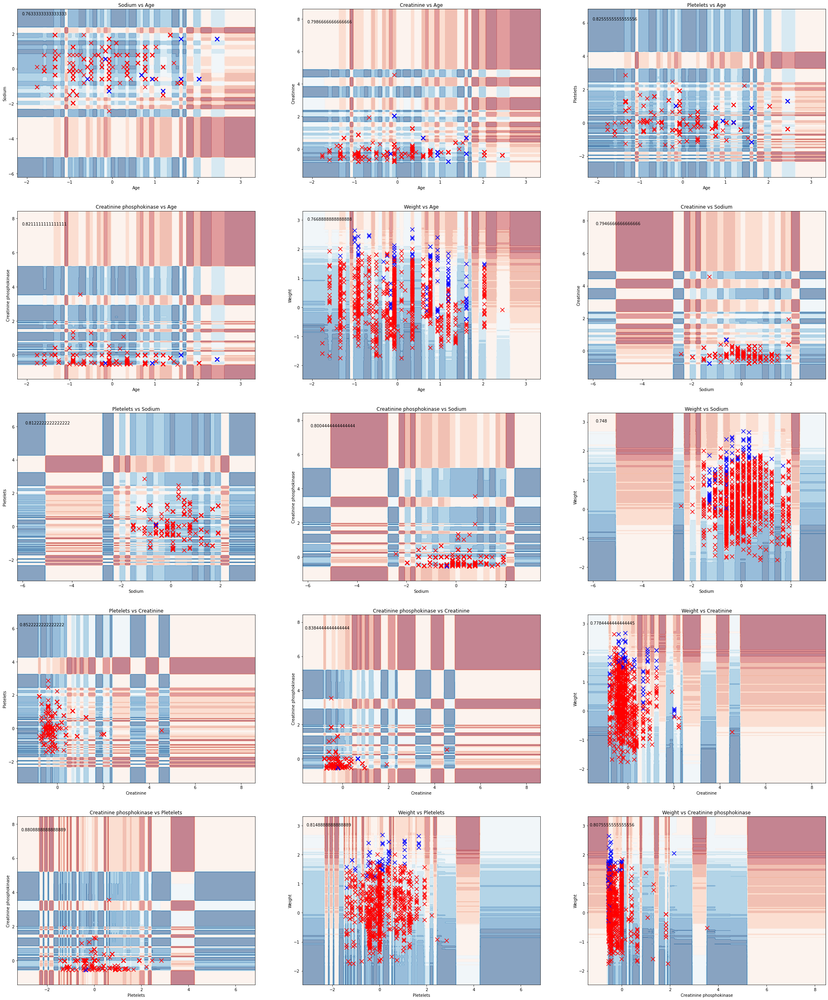

In [102]:
multi_proba_boundary_2D(best_bag)

Text(0.5, 1.0, 'Bagging Ensemble with Trees')

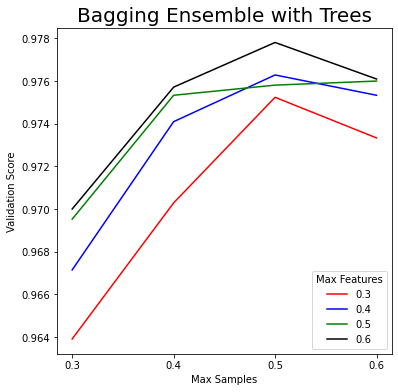

In [103]:
colors = ['red','blue','green','black']
plt.figure(figsize = (6,6))
for i in range(len(bag_final_params['max_features'])):
    plt.plot([str(j) for j in bag_final_params['max_samples']],
            bag_final_grid.cv_results_['mean_test_score'][i::4],
            color = colors[i], label = bag_final_params['max_features'][i])
plt.legend(loc = 'lower right',title="Max Features")
plt.xlabel('Max Samples')
plt.ylabel('Validation Score')
plt.title('Bagging Ensemble with Trees',fontsize = 20)

## Boosting

Different from bagging classifier family whereas all subclassifiers have the same say (weight) to the final outcome of classification, Boosting Classifier family attempts to put weights to subclassifiers which better performance and lower weights to subclassifiers with lower performance. Another aspect of boosting classifiers is that weights are also put on training samples, with the intuition that we want to put more emphasis (weight) on samples which have previously been misclassified so that subsequent classifiers put more focus on these misclassified samples. <br><br>

We will build 3 models using 3 boosting classifiers: Adaboost, GradientBoostingClassifier & Extreme Gradient Boosting Classifier (Xgboost). Generally, Adaboost is used for classification problems and GradientBoost (Xgboost) is more suited for regression problems. However, both have the options to do the other types of Machine Learning problems.

### AdaBoost <a id='ada'/>

In [104]:
x_train, x_test, y_train, y_test = standard_transform()

In [105]:
ada_params = {'learning_rate':[0.01,0.1,1.0,10], 'base_estimator__max_depth':[1,2,3,4,5]}

# ada_grid = model_selection.GridSearchCV(estimator = ensemble.AdaBoostClassifier(base_estimator = tree.DecisionTreeClassifier(criterion = 'gini',
#                                                                                                                             random_state = 2022,
#                                                                                                                             max_depth = 20), 
#                                                                                 n_estimators = 50, learning_rate = 1.0,
#                                                                                 random_state = 2022),
#                                        param_grid = ada_params, cv = cv, scoring = cv_scoring, n_jobs = 6)

# ada_grid.fit(x_train, y_train)

# print('Best set of hyperparameters:',ada_grid.best_params_)
# print('Validation Score on best set of hyperparameters',ada_grid.best_score_)

# filename = 'ada_grid_search.sav'
# pickle.dump(ada_grid, open(filename, 'wb'))

In [106]:
## Reload ada_grid_search model
ada_grid = pickle.load(open('pickle_files/ada_grid_search.sav', 'rb'))
print('Best set of hyperparameters:',ada_grid.best_params_)
print('Validation Score on best set of hyperparameters',ada_grid.best_score_)

best_ada = ada_grid.best_estimator_
best_ada.fit(x_train,y_train)
y_pred = best_ada.predict(x_test)
result_dict['AdaBoost Classifier'] = print_results(y_test, y_pred)

Best set of hyperparameters: {'base_estimator__max_depth': 5, 'learning_rate': 0.1}
Validation Score on best set of hyperparameters 0.9847619047619046
Model Accuracy Score: 0.9848888888888889
Model Recall Score: 0.9972356599861782
Model FBeta Score (Beta = 2): 0.9890335846470185
Model ROC_AUC Score: 0.9881363363802493


Text(0.5, 1.0, 'AdaBoost with Trees')

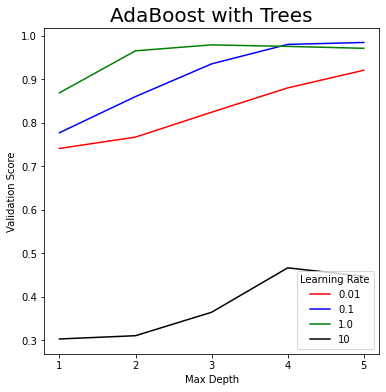

In [107]:
colors = ['red','blue','green','black']
plt.figure(figsize = (6,6))
for i in range(len(ada_params['learning_rate'])):
    plt.plot([str(j) for j in ada_params['base_estimator__max_depth']],
            ada_grid.cv_results_['mean_test_score'][i::4],
            color = colors[i], label = ada_params['learning_rate'][i])
plt.legend(loc = 'lower right',title="Learning Rate")
plt.xlabel('Max Depth')
plt.ylabel('Validation Score')
plt.title('AdaBoost with Trees',fontsize = 20)

Text(0.5, 1.0, 'Errors on AdaBoost estimators')

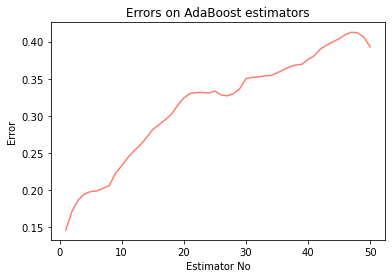

In [108]:
plt.figure()
plt.plot(list(range(1,best_ada.n_estimators + 1)),savgol_filter(best_ada.estimator_errors_,11,3),
         color = 'salmon')
plt.xlabel('Estimator No')
plt.ylabel('Error')
plt.title('Errors on AdaBoost estimators')

Text(0.5, 1.0, 'Feature Importance on best AdaBoost model')

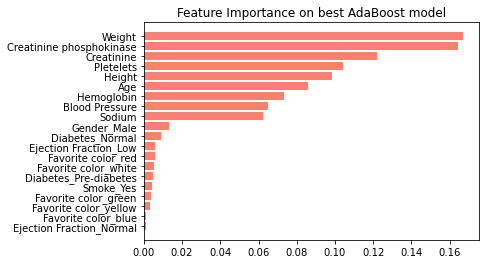

In [109]:
ada_feature_importance = {column_labels[i] : best_ada.feature_importances_[i]
                                for i in range(len(best_ada.feature_importances_))}
ada_feature_importance = dict(sorted(ada_feature_importance.items(), key=operator.itemgetter(1)))
plt.barh(list(ada_feature_importance.keys()),list(ada_feature_importance.values()),color = 'salmon')
plt.title('Feature Importance on best AdaBoost model')

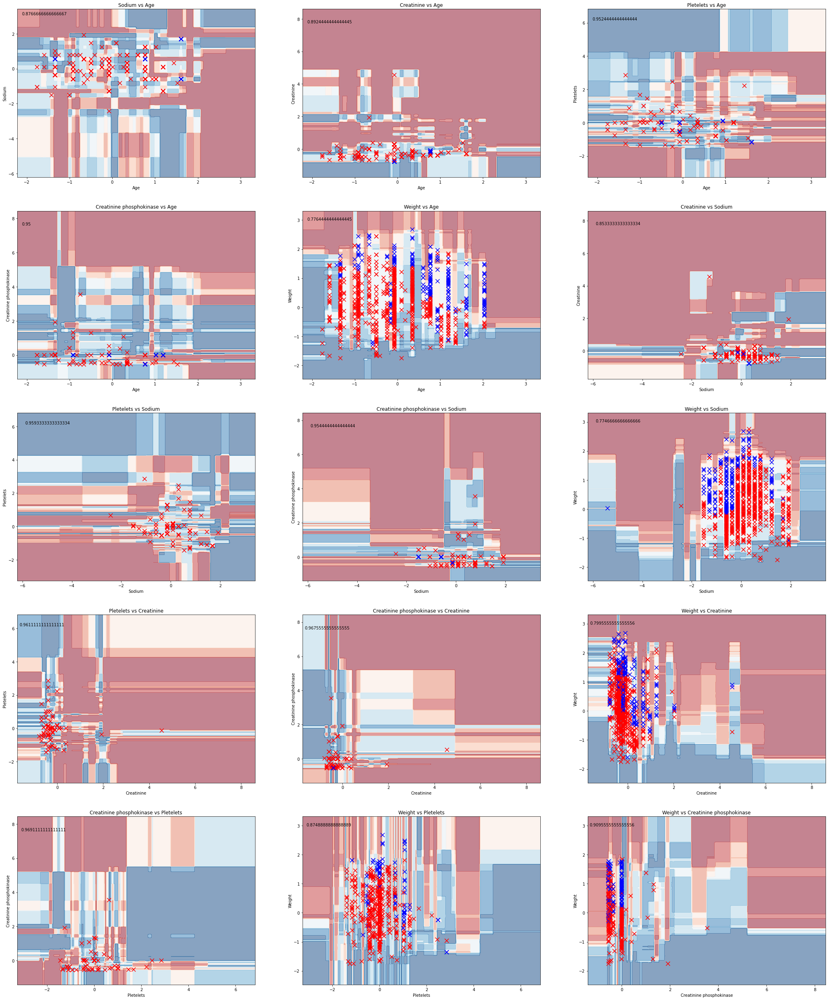

In [110]:
multi_proba_boundary_2D(best_ada)

In [111]:
ada_seq_fbeta = []
for i in range(1,25):
    ada_sub_model = estimator = ensemble.AdaBoostClassifier(base_estimator = tree.DecisionTreeClassifier(criterion = 'gini',
                                                                                                    random_state = 2022,
                                                                                                    max_depth = 20), 
                                                                                    n_estimators = i, learning_rate = 0.1,
                                                                                    random_state = 2022)

    ada_grid.fit(x_train, y_train)
    ada_seq_fbeta.append(model_selection.cross_val_score(estimator = ada_sub_model,
                                                      X = x_train, y = y_train, scoring = cv_scoring,
                                                      cv = 5, n_jobs = 6, verbose = 1).mean())

[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.2s finished
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.3s finished
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:    0.3s finished
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   5 out of   5 | elapsed:   

Text(0.5, 1.0, 'Validation Accuracy vs No of Estimators for AdaBoost')

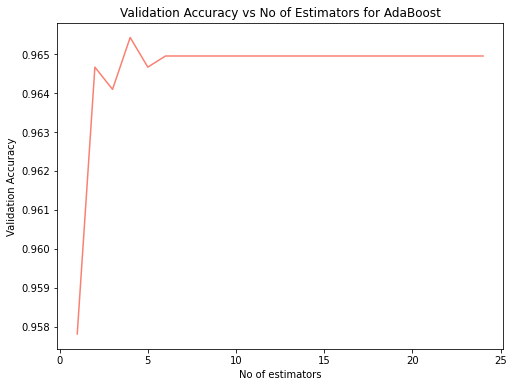

In [112]:
plt.figure(figsize = (8,6))
plt.plot(list(range(1,25)),ada_seq_fbeta,color = 'salmon')
plt.xlabel('No of estimators')
plt.ylabel('Validation Accuracy')
plt.title('Validation Accuracy vs No of Estimators for AdaBoost')

### GradientBoost <a id='gb'/>

In [113]:
x_train, x_test, y_train, y_test = standard_transform()

In [114]:
gb_params1 = {'learning_rate':[0.01, 0.1, 1, 10],
              'n_estimators':list(range(25,225,25))}
# gb_grid1 = model_selection.GridSearchCV(ensemble.GradientBoostingClassifier(random_state = 2022, max_depth = 5),
#                                         param_grid = gb_params1, cv = cv, scoring = cv_scoring, n_jobs = 6)
# gb_grid1.fit(x_train, y_train)
# print('Best set of hyperparameters:',gb_grid1.best_params_)
# print('Validation Score on best set of hyperparameters',gb_grid1.best_score_)

# filename = 'gb_grid_search1.sav'
# pickle.dump(gb_grid1, open(filename, 'wb'))

Best set of hyperparameters: {'learning_rate': 0.1, 'n_estimators': 125}
Validation Score on best set of hyperparameters 0.9862857142857143


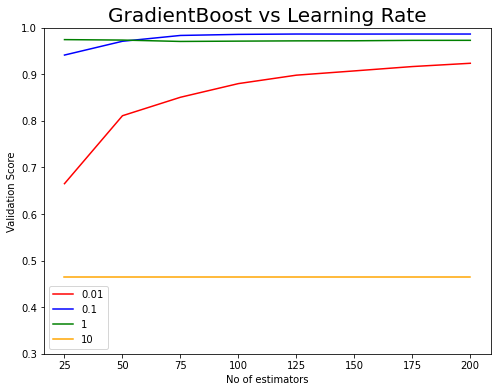

In [115]:
## Reload gb_grid_search1 model
gb_grid1 = pickle.load(open('pickle_files/gb_grid_search1.sav', 'rb'))
print('Best set of hyperparameters:',gb_grid1.best_params_)
print('Validation Score on best set of hyperparameters',gb_grid1.best_score_)

plt.figure(figsize = (8,6))
gb_n_estimators = len(gb_params1['n_estimators'])
colors = ['red','blue','green','orange']
for i in range(len(gb_params1['learning_rate'])):
    gb_result = gb_grid1.cv_results_['mean_test_score'][0+i*gb_n_estimators:gb_n_estimators*(i+1)]
    plt.plot(gb_params1['n_estimators'], gb_result,color = colors[i],
            label = gb_params1['learning_rate'][i])

plt.ylim(0.3,1)
plt.legend()
plt.xlabel('No of estimators')
plt.ylabel('Validation Score')
plt.title('GradientBoost vs Learning Rate', fontsize = 20)
plt.show()

In [116]:
gb_params2 = [{'max_depth': [3,4,5,6,7,8,9,10],
               'min_samples_split' : [10,20,30],
               'max_features': [0.5]},
                {'max_depth': [3,4,5,6,7,8,9,10],
               'min_samples_split' : [10,20,30],
               'max_features': [0.75]},
                {'max_depth': [3,4,5,6,7,8,9,10],
               'min_samples_split' : [10,20,30],
               'max_features': [1.0]},]

# gb_grid2 = model_selection.GridSearchCV(ensemble.GradientBoostingClassifier(random_state = 2022, learning_rate = 0.1,
#                                                                            n_estimators = 100, validation_fraction = 0.15,
#                                                                            subsample = 0.5, n_iter_no_change = 10),
#                                         param_grid = gb_params2, cv = cv, scoring = cv_scoring, n_jobs = 6)

# gb_grid2.fit(x_train, y_train)
# print('Best set of hyperparameters:',gb_grid2.best_params_)
# print('Validation Score on best set of hyperparameters',gb_grid2.best_score_)

# filename = 'gb_grid_search2.sav'
# pickle.dump(gb_grid2, open(filename, 'wb'))

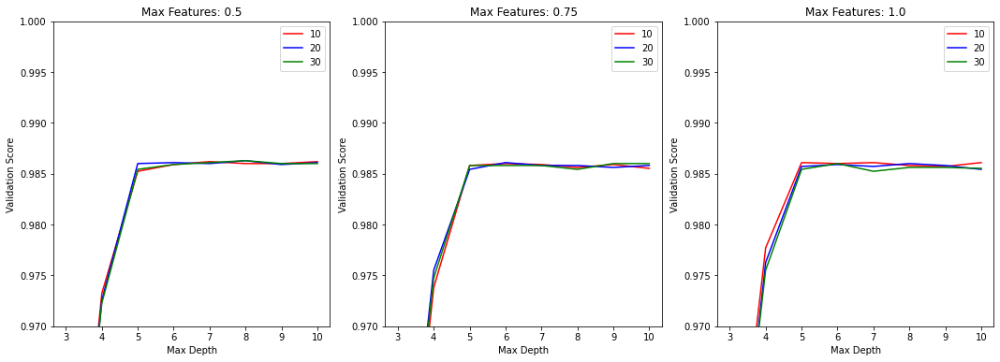

In [117]:
## Reload gb_grid_search2 model
gb_grid2 = pickle.load(open('pickle_files/gb_grid_search2.sav', 'rb'))

plt.figure(figsize = (18,6))
for sub in range(3):
    gb_sub_param = gb_params2[sub]
    len_max_depth = len(gb_sub_param['max_depth'])
    gb_sub_result = gb_grid2.cv_results_['mean_test_score'][(sub*len_max_depth*3):((sub+1)*len_max_depth*3)]
    plt.subplot(1, 3, sub + 1)
    for j in range(len(gb_sub_param['min_samples_split'])):
        plt.plot(gb_sub_param['max_depth'],gb_sub_result[j:24:3],
                 color = colors[j], label = gb_sub_param['min_samples_split'][j])
    plt.xlabel('Max Depth')
    plt.ylabel('Validation Score')
    plt.title('Max Features: ' + str(gb_sub_param['max_features'][0]))
    plt.ylim(0.97,1)
    plt.legend()

In [118]:
best_gb = gb_grid2.best_estimator_
best_gb.fit(x_train,y_train)
y_pred = best_gb.predict(x_test)
result_dict['GradientBoosting Classifier'] = print_results(y_test, y_pred)

Model Accuracy Score: 0.9862222222222222
Model Recall Score: 1.0
Model FBeta Score (Beta = 2): 0.9914916975435707
Model ROC_AUC Score: 0.9898527004909984


Text(0.5, 1.0, 'Feature Importance on best GradientBoost model')

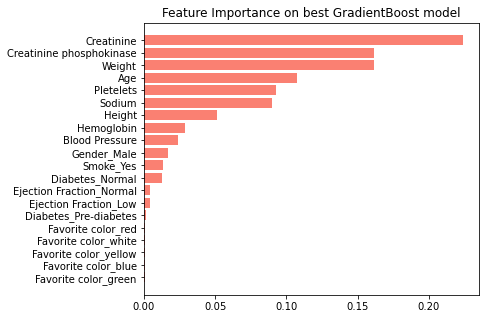

In [119]:
gb_feature_importance = {column_labels[i] : best_gb.feature_importances_[i]
                                for i in range(len(best_gb.feature_importances_))}
gb_feature_importance = dict(sorted(gb_feature_importance.items(), key=operator.itemgetter(1)))
plt.figure(figsize = (6,5))
plt.barh(list(gb_feature_importance.keys()),list(gb_feature_importance.values()),color = 'salmon')
plt.title('Feature Importance on best GradientBoost model')

In [120]:
# fig, ax1 = plt.subplots()

# ax1.plot(list(range(1,best_gb.n_estimators + 1)),best_gb.train_score_,color = 'blue')
# ax1.set_ylabel('GB Train Score',color = 'blue')
# ax1.tick_params(axis='y',color = 'blue',labelcolor='blue')

# ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

# ax2.set_ylabel('OOB Improvement per estimator',color='black')  # we already handled the x-label with ax1
# ax2.plot(list(range(1,101)),best_gb.oob_improvement_, color='black')
# ax2.tick_params(axis='y',color = 'black',labelcolor='black')

# plt.title('Train Score and OOB score gained for each estimator')
# plt.show()

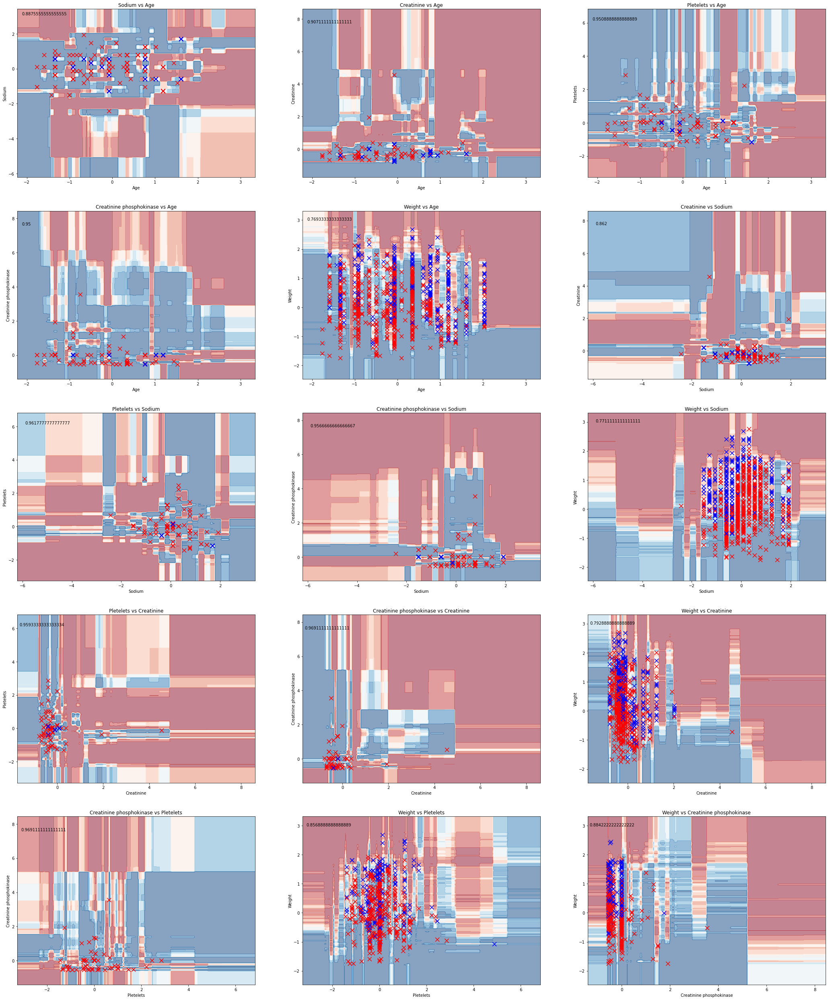

In [121]:
multi_proba_boundary_2D(best_gb)

### XGBoost <a id='xgb'/>

In [122]:
x_train, x_test, y_train, y_test = standard_transform()

In [123]:
xgb_params = {'max_depth': [3,4,5,6,7,8],
               'min_samples_split' : [10,20,30]}

# xgb_grid = model_selection.GridSearchCV(xgboost.XGBClassifier(random_state = 2022, learning_rate = 0.3,
#                                                               n_estimators = 100, subsample = 0.5,
#                                                               use_label_encoder = False, max_features = 0.5),
#                                         param_grid = xgb_params, cv = 5, scoring = cv_scoring, n_jobs = 6)

# xgb_grid.fit(x_train, y_train)
# print('Best set of hyperparameters:',xgb_grid.best_params_)
# print('Validation Score on best set of hyperparameters',xgb_grid.best_score_)

# filename = 'xgb_grid_search.sav'
# pickle.dump(xgb_grid, open(filename, 'wb'))

In [124]:
## Reload xgb_grid_search model
xgb_grid = pickle.load(open('pickle_files/xgb_grid_search.sav', 'rb'))

best_xgb = xgb_grid.best_estimator_
best_xgb.fit(x_train,y_train)
y_pred = best_xgb.predict(x_test)
result_dict['XGBoost Classifier'] = print_results(y_test, y_pred)

[02:04:03] WARNING: ..\src\learner.cc:576: 
Parameters: { "max_features", "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[02:04:03] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Model Accuracy Score: 0.9855555555555555
Model Recall Score: 0.9993074792243767
Model FBeta Score (Beta = 2): 0.9906631882466015
Model ROC_AUC Score: 0.9891825354237066


## 3. Naive Bayes Classifier <a id='nb'/>

Naive Bayes Classifiers are a family of simple classifiers which models the posterior A probability of the classes given the dataset. It is a probabilistic model using Bayes Theorem to calculate the posterior probability based on the class prior and the likelihood of observing the data provided the class of interest. The formula is as follow:
<br><br>
<center>$ Posterior Probability = \large \frac{Prior Probability\  x \ Likelihood}{Evidence} $ </center> <br>
<center>$ P(C_k|x) = \large \frac{p(C_k)p(x|C_k)}{P(x)}$</center> <br>

where $P(C_k)$ represents the prior probability of class k, $P(x|C_k)$ represents the likelihood to observe a particular set of input x under class k, which can be estimated by the probablity distribution based on the dataset. Naive Bayes classifiers are fast and simple. However, the classifiers under Naive Bayes operate under the assumption that all features are independent of each other, which is not realistic in most scenarios. <br><br>

In this project, we will use CategoricalNB to handle categorical variables, which are assumed to follow Multinomial distribution. For continuous variables, GaussianNB will be used assuming that continuous variables follow Normal Distribution.

In [125]:
ord_enc = preprocessing.OrdinalEncoder()
cat_data = ord_enc.fit_transform(data[cat_var])

x_cat_train, x_cat_test, y_train, y_test = model_selection.train_test_split(cat_data,y,test_size = 0.3,stratify = y,
                                                                    random_state = 2020)

# Categorical
cnb = nb.CategoricalNB(alpha = 1)
cnb.fit(x_cat_train,y_train)
cat_pred_log_prob = cnb.predict_log_proba(x_cat_test)
cat_train_log_prob = cnb.predict_log_proba(x_cat_train)

# Continuous
log_data = copy.copy(data[num_var])
log_data['Creatinine'] = np.log(log_data['Creatinine'])
log_data['Creatinine phosphokinase'] = np.log(log_data['Creatinine phosphokinase'])
log_data['Pletelets'] = np.log(log_data['Pletelets'])
log_data['Sodium'] = np.log(log_data['Sodium'])

x_train_cont, x_test_cont, y_train, y_test = model_selection.train_test_split(log_data.values, y, stratify = y,
                                                                              test_size = 0.3,
                                                                              random_state = 2020)

# x_train_cont, x_test_cont, y_train, y_test = model_selection.train_test_split(data[num_var].values, y, 
#                                                                               test_size = 0.3,stratify = y,
#                                                                               random_state = 2020)

gnb = nb.GaussianNB()
gnb.fit(x_train_cont, y_train)
cont_pred_log_prob = gnb.predict_log_proba(x_test_cont)
cont_train_log_prob = gnb.predict_log_proba(x_train_cont)

# Combine
pred_prob = (-1) * (cat_pred_log_prob + cont_pred_log_prob)
train_prob = cat_train_log_prob + cont_train_log_prob
y_pred = 1*(pred_prob[:,1] <= pred_prob[:,0])
y_train_nb = 1*(train_prob[:,1] >= train_prob[:,0])

print_results(y_test, y_pred)

Model Accuracy Score: 0.7535555555555555
Model Recall Score: 0.720620842572062
Model FBeta Score (Beta = 2): 0.635386119257087
Model ROC_AUC Score: 0.7412164802076541


{'accuracy': 0.7535555555555555,
 'precision': 0.43132050431320507,
 'recall': 0.720620842572062,
 'fbeta': 0.635386119257087,
 'roc_auc': 0.7412164802076541,
 'y_pred': array([0, 1, 1, ..., 0, 0, 1], dtype=int64)}

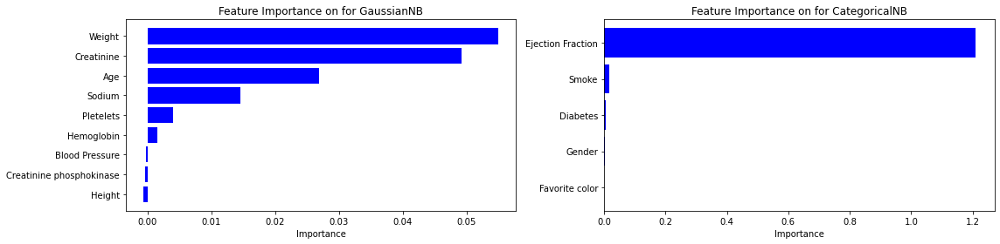

In [126]:
plt.figure(figsize = (16,4))
imps = permutation_importance(gnb, x_test_cont, y_test)
gnb_feature_importance = {column_labels[i] : imps.importances_mean[i]
                                for i in range(len(imps.importances_mean))}
gnb_feature_importance = dict(sorted(gnb_feature_importance.items(), key=operator.itemgetter(1)))
plt.subplot(1,2,1)
plt.barh(list(gnb_feature_importance.keys()),list(gnb_feature_importance.values()),color = 'blue')
plt.xlabel('Importance')
plt.title('Feature Importance on for GaussianNB')

cnb_feature_importance = []
for i in range(len(cnb.feature_log_prob_)):
    class_0_importance = cnb.feature_log_prob_[i].mean(axis = 1)[0]
    class_1_importance = cnb.feature_log_prob_[i].mean(axis = 1)[1]
    cnb_feature_importance.append(abs(class_1_importance-class_0_importance))
cnb_feature_importance
plt.subplot(1,2,2)
cnb_feature_importance = {data[cat_var].columns[i] : cnb_feature_importance[i]
                                for i in range(len(cnb_feature_importance))}
cnb_feature_importance = dict(sorted(cnb_feature_importance.items(), key=operator.itemgetter(1)))
plt.subplot(1,2,2)
plt.barh(list(cnb_feature_importance.keys()),list(cnb_feature_importance.values()),color = 'blue')
plt.xlabel('Importance')
plt.title('Feature Importance on for CategoricalNB')
plt.tight_layout()
plt.show()

In [127]:
data['Creatinine'].quantile([0.1,0.3,0.5,0.7,0.9])

0.1    0.8
0.3    1.0
0.5    1.1
0.7    1.3
0.9    2.2
Name: Creatinine, dtype: float64

In [128]:
data['Creatinine phosphokinase'].quantile([0.1,0.3,0.5,0.7,0.9])

0.1      68.0
0.3     131.0
0.5     250.0
0.7     582.0
0.9    1211.0
Name: Creatinine phosphokinase, dtype: float64

In [129]:
data['Age'].quantile([0.25,0.5,0.75])

0.25    51.0
0.50    60.0
0.75    70.0
Name: Age, dtype: float64

In [130]:
cat_var1 = ['Creatinine','Creatinine phosphokinase', 'Age'] + cat_var
#cat_var1 = ['Creatinine','Creatinine phosphokinase'] + cat_var

cat_data = data[cat_var1]

cat_data['Creatinine'] = pd.cut(data['Creatinine'], 
                         bins = [0] + list(data['Creatinine'].quantile([0.1,0.3,0.5,0.7,0.9])) + [float('inf')],
                         right = True,
                         labels = ["<0.8","0.8-1,0","1.0-1.1","1.1-1.3","1.3-2.2",">2.2"])

cat_data['Creatinine phosphokinase'] = pd.cut(data['Creatinine phosphokinase'], right = True,
                                       bins = [0] + list(data['Creatinine phosphokinase'].quantile([0.1,0.3,0.5,0.7,0.9])) + [float('inf')],
                                       labels = ["<68","68-131","131-250","250-582","582-1211",">1211"])

cat_data['Age'] = pd.cut(data['Age'], right = True,
                  bins = [0] + list(data['Age'].quantile([0.25,0.5,0.75])) + [float('inf')],
                  labels = ["<51","51-60","60-70",">70"])

ord_enc = preprocessing.OrdinalEncoder()
cat_data_enc = ord_enc.fit_transform(cat_data)

x_cat_train, x_cat_test, y_train, y_test = model_selection.train_test_split(cat_data_enc,y,test_size = 0.3, stratify = y,
                                                                    random_state = 2020)

# Categorical
cnb = nb.CategoricalNB(alpha = 1)
cnb.fit(x_cat_train,y_train)
cat_pred_log_prob = cnb.predict_log_proba(x_cat_test)
cat_train_log_prob = cnb.predict_log_proba(x_cat_train)

# Continuous
num_var_reduced = ['Sodium','Pletelets','Blood Pressure','Hemoglobin','Height','Weight']
#num_var_reduced = ['Age','Sodium','Pletelets','Blood Pressure','Hemoglobin','Height','Weight']
log_data = copy.copy(data[num_var_reduced])
log_data['Pletelets'] = np.log(log_data['Pletelets'])
log_data['Sodium'] = np.log(log_data['Sodium'])

x_train_cont, x_test_cont, y_train, y_test = model_selection.train_test_split(log_data.values, y,stratify = y,
                                                                              test_size = 0.3,
                                                                              random_state = 2020)

# x_train_cont, x_test_cont, y_train, y_test = model_selection.train_test_split(data[num_var].values, y, 
#                                                                               test_size = 0.3,stratify = y,
#                                                                               random_state = 2020)

gnb = nb.GaussianNB()
gnb.fit(x_train_cont, y_train)
cont_pred_log_prob = gnb.predict_log_proba(x_test_cont)
cont_train_log_prob = gnb.predict_log_proba(x_train_cont)

# Combine
pred_prob = (-1) * (cat_pred_log_prob + cont_pred_log_prob)
train_prob = cat_train_log_prob + cont_train_log_prob
y_pred = 1*(pred_prob[:,1] <= pred_prob[:,0])
y_train_nb = 1*(train_prob[:,1] >= train_prob[:,0])

result_dict['NaiveBayes Classifier'] = print_results(y_test,y_pred)

Model Accuracy Score: 0.7686666666666667
Model Recall Score: 0.7672018348623854
Model FBeta Score (Beta = 2): 0.6696696696696697
Model ROC_AUC Score: 0.7681102889857683


C:\Users\QUAN\AppData\Local\Temp/ipykernel_90696/658933809.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['Creatinine'] = pd.cut(data['Creatinine'],
C:\Users\QUAN\AppData\Local\Temp/ipykernel_90696/658933809.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['Creatinine phosphokinase'] = pd.cut(data['Creatinine phosphokinase'], right = True,
C:\Users\QUAN\AppData\Local\Temp/ipykernel_90696/658933809.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fro

Text(0.5, 1.0, 'Creatinine phosphokinase')

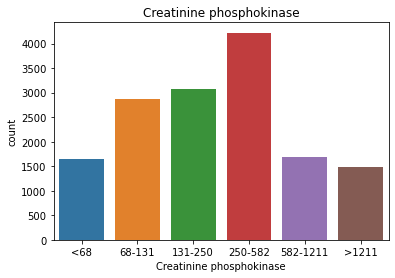

In [131]:
sns.countplot(x = 'Creatinine phosphokinase', data = cat_data)
plt.title('Creatinine phosphokinase')


## 4. Logistic Regression

Logistic Regression model attempts to fit the logit function $ log(\large\frac{1}{1-p})$ or logit(p) against multiple and maximizes the probability of getting the observed results based on the fitted coefficients. predictors based on the following equation: <br><br>
<center>$\large logit(p)=\beta_0+\beta_1 X_1+ \beta_2 X_2+ \beta_3 X_3+⋯+\beta_n X_n$<center/> <br>
The regression procedure tries to fit a high-dimensional linear decision boundaries (hyperplane) which ultimately helps to classify between different classes. 

### Logistic Regression <a id='lr'/>

In [132]:
x_train, x_test, y_train, y_test = standard_transform()

In [133]:
lr_params = [{'penalty':['l1'], 'solver':['liblinear','saga'],
             'C':[0.01,0.1,1,10,100,1000,10000,100000]},
             {'penalty':['l2'], 'solver':['newton-cg','lbfgs','liblinear'],
             'C':[0.01,0.1,1,10,100,1000,10000,100000]}]

# lr_grid = model_selection.GridSearchCV(estimator = linear_model.LogisticRegression(random_state = 2022, max_iter = 10000),
#                                       param_grid = lr_params, cv = cv, scoring = cv_scoring, verbose = 1, n_jobs = 6)

# lr_grid.fit(x_train, y_train)
# print('Best set of hyperparameters:',lr_grid.best_params_)
# print('Validation Score on best set of hyperparameters',lr_grid.best_score_)

# filename = 'lr_grid_search.sav'
# pickle.dump(lr_grid, open(filename, 'wb'))

In [134]:
## Reload lr_grid_search model
lr_grid = pickle.load(open('pickle_files/lr_grid_search.sav', 'rb'))
print(lr_grid.best_params_)
print(lr_grid.best_score_)

best_lr = lr_grid.best_estimator_
best_lr.fit(x_train, y_train)
y_pred = best_lr.predict(x_test)
result_dict['Logistic Regression'] = print_results(y_test, y_pred)

{'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}
0.8155238095238095
Model Accuracy Score: 0.8135555555555556
Model Recall Score: 0.7659235668789809
Model FBeta Score (Beta = 2): 0.7364875210534375
Model ROC_AUC Score: 0.7989605503938678


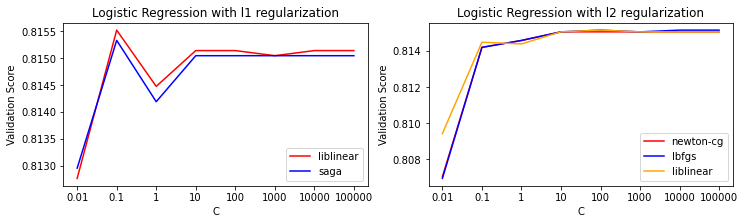

In [135]:
plt.figure(figsize = (12,3))
## l1
plt.subplot(1,2,1)
colors = ['red','blue','orange']
l1_result = lr_grid.cv_results_['mean_test_score'][:len(lr_params[0]['solver']) * len(lr_params[0]['C'])]
for i in range(len(lr_params[0]['solver'])):
    plt.plot([str(j) for j in lr_params[0]['C']],l1_result[i::len(lr_params[0]['solver'])],
             color = colors[i],label = lr_params[0]['solver'][i])
plt.xlabel('C')
plt.ylabel('Validation Score')
plt.title('Logistic Regression with l1 regularization')
plt.legend()

## l2
plt.subplot(1,2,2)
l2_result = lr_grid.cv_results_['mean_test_score'][len(lr_params[0]['solver']) * len(lr_params[0]['C']):]
for i in range(len(lr_params[1]['solver'])):
    plt.plot([str(j) for j in lr_params[1]['C']],l2_result[i::len(lr_params[1]['solver'])],
             color = colors[i],label = lr_params[1]['solver'][i])
plt.xlabel('C')
plt.ylabel('Validation Score')
plt.title('Logistic Regression with l2 regularization')
plt.legend()

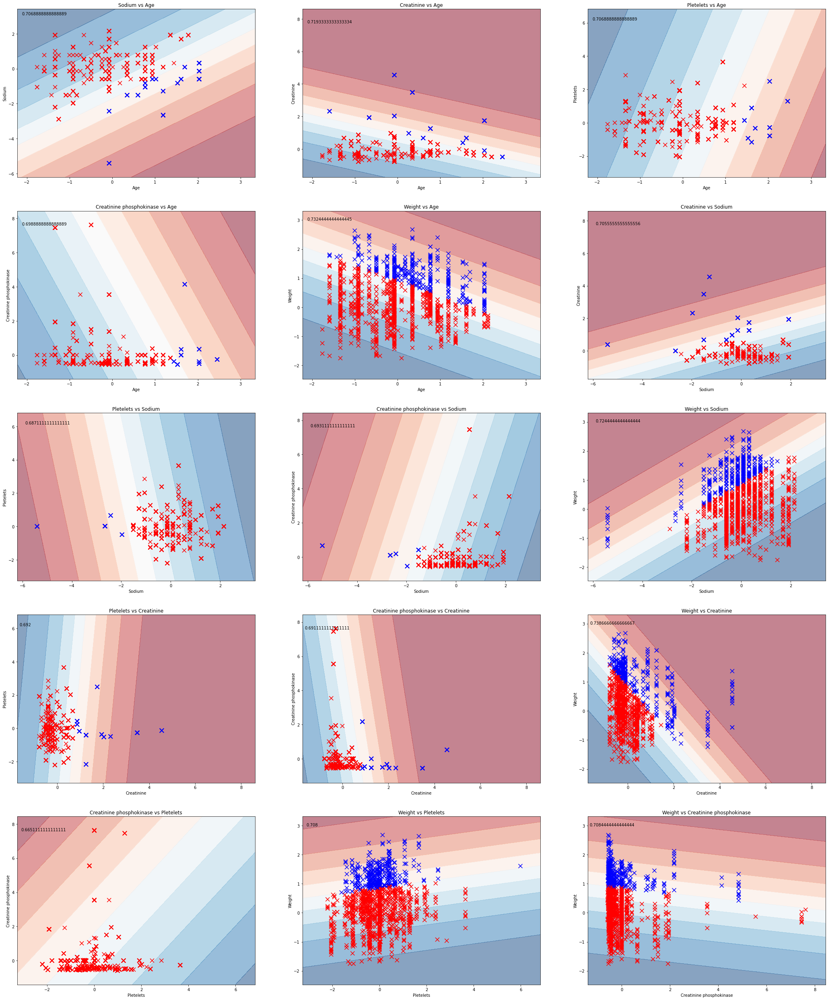

In [136]:
multi_proba_boundary_2D(best_lr)

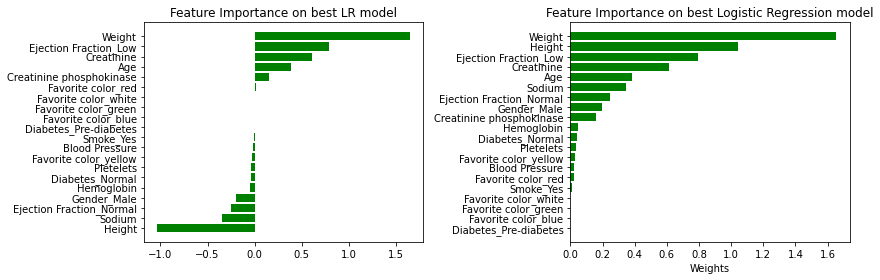

In [139]:
lr_feature_importance = {column_labels[i] : best_lr.coef_[0][i]
                                for i in range(len(best_lr.coef_[0]))}

lr_feature_importance_magnitude = {column_labels[i] : np.abs(best_lr.coef_[0][i])
                                for i in range(len(best_lr.coef_[0]))}

lr_feature_importance = dict(sorted(lr_feature_importance.items(), key=operator.itemgetter(1)))
lr_feature_importance_magnitude = dict(sorted(lr_feature_importance_magnitude.items(), key=operator.itemgetter(1)))
plt.figure(figsize = (12,4))
plt.subplot(1,2,1)
plt.barh(list(lr_feature_importance.keys()),list(lr_feature_importance.values()),color = 'green')
plt.title('Feature Importance on best LR model')

plt.subplot(1,2,2)
plt.barh(list(lr_feature_importance_magnitude.keys()),list(lr_feature_importance_magnitude.values()),color = 'green')
plt.xlabel('Weights')
plt.title('Feature Importance on best Logistic Regression model')

plt.tight_layout()

### Logistic Regression with Polynomial Features <a id='lrpoly'/>

In [140]:
x_train, x_test, y_train, y_test = final_poly_transform()

(715,)
(11,)
No of variables on polynomial 4: 726
x_train dimension after rfe:  (10500, 276)


C:\Users\QUAN\anaconda3\lib\site-packages\sklearn\base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 1.0.1 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  warnings.warn(
C:\Users\QUAN\anaconda3\lib\site-packages\sklearn\base.py:329: UserWarning: Trying to unpickle estimator RFECV from version 1.0.1 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [141]:
lr_poly_params = {'C':[100,1000,10000,100000]}

# lr_poly_grid = model_selection.GridSearchCV(estimator = linear_model.LogisticRegression(random_state = 2022, max_iter = 100000,
#                                                                                        solver = 'liblinear'),
#                                             param_grid = lr_poly_params, cv = cv, scoring = cv_scoring,
#                                             verbose = 1, n_jobs = 6)
# lr_poly_grid.fit(x_train, y_train)
# print('Best set of hyperparameters:',lr_poly_grid.best_params_)
# print('Validation Score on best set of hyperparameters',lr_poly_grid.best_score_)

# filename = 'lr_poly_grid_acc.sav'
# pickle.dump(lr_poly_grid, open(filename, 'wb'))

In [142]:
## Reload lr_poly_grid file
lr_poly_grid = pickle.load(open('pickle_files/lr_poly_grid_acc.sav', 'rb'))
print(lr_poly_grid.best_score_)
print(lr_poly_grid.best_params_)

0.9501904761904763
{'C': 100000}


Text(0.5, 1.0, 'Logistic Regression Tuning with Polynomial Features')

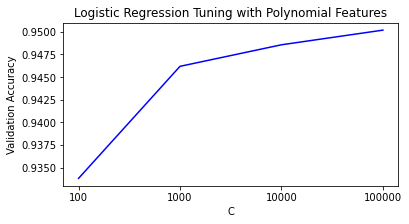

In [143]:
plt.figure(figsize = (6,3))
plt.plot([str(j) for j in lr_poly_params['C']], lr_poly_grid.cv_results_['mean_test_score'], color = 'blue')
plt.xlabel('C')
plt.ylabel('Validation Accuracy')
plt.title('Logistic Regression Tuning with Polynomial Features')

In [144]:
best_poly_lr = lr_poly_grid.best_estimator_
best_poly_lr.fit(x_train, y_train)
y_pred = best_poly_lr.predict(x_test)
result_dict['Logistic Regression with Poly Features'] = print_results(y_test, y_pred)

Model Accuracy Score: 0.9504444444444444
Model Recall Score: 0.962536023054755
Model FBeta Score (Beta = 2): 0.9463096755914435
Model ROC_AUC Score: 0.9537937184682516


Text(0.5, 1.0, 'Feature Importance on best Logistic Regression model')

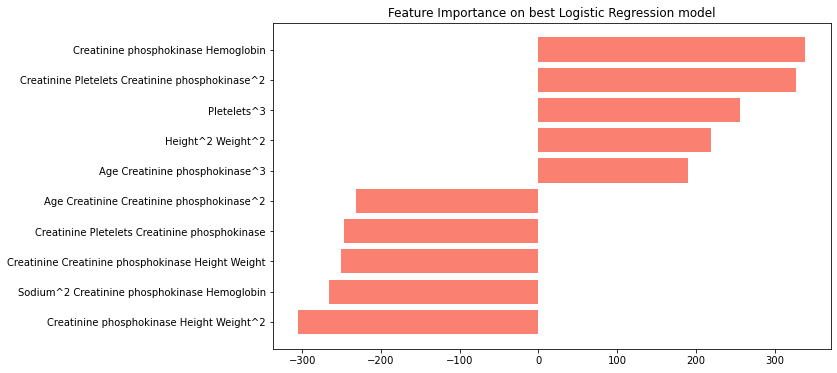

In [145]:
lr_poly_feature_importance = {reduced_poly_feature_names[i] : best_poly_lr.coef_[0][i]
                                for i in range(len(best_poly_lr.coef_[0]))}

lr_poly_feature_importance = dict(sorted(lr_poly_feature_importance.items(), key=operator.itemgetter(1)))

plt.figure(figsize = (10,6))
plt.barh(list(lr_poly_feature_importance.keys())[:5] + list(lr_poly_feature_importance.keys())[-5:],
         list(lr_poly_feature_importance.values())[:5] + list(lr_poly_feature_importance.values())[-5:],
         color = 'salmon')
plt.title('Feature Importance on best Logistic Regression model')

Text(0.5, 1.0, 'Feature Importance on best Logistic Regression model by magnitude')

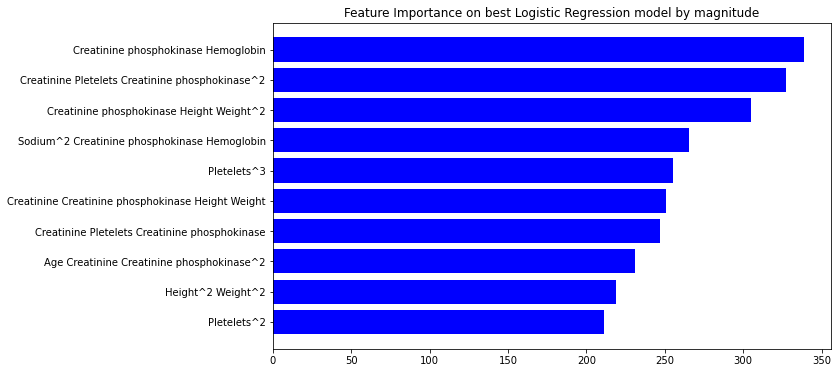

In [146]:
lr_poly_importance_magnitude = {reduced_poly_feature_names[i] : np.abs(best_poly_lr.coef_[0][i])
                                for i in range(len(best_poly_lr.coef_[0]))}

lr_poly_importance_magnitude = dict(sorted(lr_poly_importance_magnitude.items(), key=operator.itemgetter(1)))
plt.figure(figsize = (10,6))
plt.barh(list(lr_poly_importance_magnitude.keys())[-10:],
         list(lr_poly_importance_magnitude.values())[-10:],
         color = 'blue')
plt.title('Feature Importance on best Logistic Regression model by magnitude')

## Ensemble For Logistic Regression <a id='ensemblelr'/>

In [147]:
x_train, x_test, y_train, y_test = standard_transform()

In [148]:
lr_ensemble_params1 = {'base_estimator__C':[0.01,0.1,1,10,100,1000,10000],
                       'max_features':[0.5, 0.75, 1.0]}

# lr_ensemble_bag = model_selection.GridSearchCV(ensemble.BaggingClassifier(base_estimator = linear_model.LogisticRegression(max_iter = 10000),
#                                                                       n_estimators = 50),
#                                             param_grid = lr_ensemble_params1,
#                                             cv = cv, scoring = 'accuracy', n_jobs = 6)

# lr_ensemble_bag.fit(x_train, y_train)
# print(lr_ensemble_bag.best_params_)
# print(lr_ensemble_bag.best_score_)

# filename = 'ensemble_lr_bag.sav'
# pickle.dump(lr_ensemble_bag, open(filename, 'wb'))

In [149]:
## Reload lr_ensemble_bag model
lr_ensemble_bag = pickle.load(open('pickle_files/ensemble_lr_bag.sav', 'rb'))

print(lr_ensemble_bag.best_params_)
print(lr_ensemble_bag.best_score_)

best_lr_ensemble_bag = lr_ensemble_bag.best_estimator_
best_lr_ensemble_bag.fit(x_train,y_train)
y_pred = best_lr_ensemble_bag.predict(x_test)
result_dict['Bagging Ensemble with Logistic Regression'] = print_results(y_test, y_pred)

{'base_estimator__C': 100, 'max_features': 1.0}
0.8158095238095238
Model Accuracy Score: 0.8142222222222222
Model Recall Score: 0.7652173913043478
Model FBeta Score (Beta = 2): 0.7370184254606366
Model ROC_AUC Score: 0.7993011222364088


Text(0.5, 1.0, 'Ensemble with Logistic Regression')

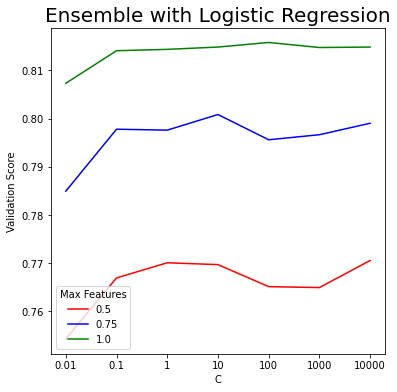

In [150]:
lr_ensemble_bag.cv_results_['params']
colors = ['red','blue','green']
plt.figure(figsize = (6,6))
for i in range(len(lr_ensemble_params1['max_features'])):
    plt.plot([str(j) for j in lr_ensemble_params1['base_estimator__C']],
            lr_ensemble_bag.cv_results_['mean_test_score'][i::3],
            color = colors[i], label = lr_ensemble_params1['max_features'][i])
plt.legend(loc = 'lower left',title="Max Features")
plt.xlabel('C')
plt.ylabel('Validation Score')
plt.title('Ensemble with Logistic Regression',fontsize = 20)

## 5. Support Vector Machine

Support Vector Machines (SVM) are supervised Machine Learning models associated with both Regression and Classification tasks. The basic idea of SVM is to construct a hyperplane or a set of hyperplanes in high dimension space for the purpose of Classification, Regression and Outlier Detection. <br><br>



In [151]:
svc_params = {'linear': {'C':[0.1,1,10,100,1000,10000,100000], 'max_iter':[100000]},
              'poly': {'C':[0.1,1,10,100,1000,10000,100000], 'degree':[2,3,4,5],'max_iter':[100000],
                       'gamma':[0.001,0.01,0.1,1,10,100,1000,1000]},
              'rbf': {'C':[0.1,1,10,100,1000,10000,100000],'gamma':[0.001,0.01,0.1,1,10,100,1000,1000],'max_iter':[100000]}}


# svc_acc_grid = {}

# for kernel, params in svc_params.items():
#     svc_acc_grid[kernel] = model_selection.GridSearchCV(svm.SVC(kernel=kernel, random_state = 2022,cache_size = 2000,verbose = True,
#                                                       max_iter = 10000),
#                                                     param_grid = params, cv = cv, scoring = 'accuracy',
#                                                     verbose = 1, n_jobs = 6)
#     start_time = time.time()
#     svc_acc_grid[kernel].fit(x_train, y_train)
#     total_time = time.time() - start_time
#     print(f'Total fit time using {kernel} kernel:', total_time)
    
# filename = 'svc_acc_grid.sav'
# pickle.dump(svc_acc_grid, open(filename, 'wb'))

In [152]:
# filename = 'svc_acc_grid.sav'
# pickle.dump(svc_acc_grid, open(filename, 'wb'))
svc_acc_grid = pickle.load(open('pickle_files/svc_acc_grid.sav', 'rb'))

### Support Vector Classifier with Linear Kernel <a id='svclin'/>

In [153]:
svc_linear_grid = svc_acc_grid['linear']
print('Best set of hyperparameters:',svc_linear_grid.best_params_)
print('Validation Score on best set of hyperparameters',svc_linear_grid.best_score_)

Best set of hyperparameters: {'C': 1, 'max_iter': 100000}
Validation Score on best set of hyperparameters 0.8216190476190477


Text(0.5, 1.0, 'Linear Kernel SVC with different C')

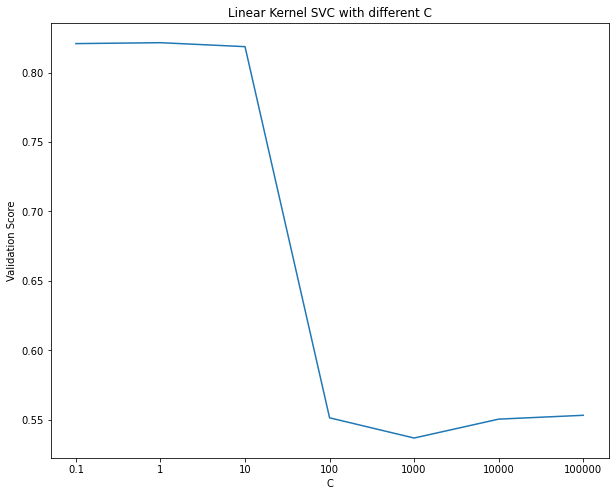

In [154]:
plt.figure(figsize=(10,8))
plt.plot([str(i) for i in svc_params['linear']['C']],svc_linear_grid.cv_results_['mean_test_score'])
plt.xlabel('C')
plt.ylabel('Validation Score')
plt.title('Linear Kernel SVC with different C')

In [155]:
best_linear_C = svc_linear_grid.best_params_['C']
best_linear_SVC = svm.SVC(kernel='linear', random_state = 2022,cache_size = 2000,
                          verbose = True, C = best_linear_C, max_iter = 100000, probability = True)
best_linear_SVC.fit(x_train, y_train)
y_pred = best_linear_SVC.predict(x_test)
result_dict['Linear SVC'] = print_results(y_test, y_pred)

[LibSVM]

C:\Users\QUAN\anaconda3\lib\site-packages\sklearn\svm\_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Model Accuracy Score: 0.814
Model Recall Score: 0.7613104524180967
Model FBeta Score (Beta = 2): 0.7354935945742275
Model ROC_AUC Score: 0.79815056492875


In [156]:
# multi_decision_boundary_2D(best_linear_SVC)

### Support Vector Classifier with Polynomial Kernel <a id='svcpoly'/>

In [157]:
svc_poly_grid = svc_acc_grid['poly']
print('Best set of hyperparameters:',svc_poly_grid.best_params_)
print('Validation Score on best set of hyperparameters',svc_poly_grid.best_score_)

Best set of hyperparameters: {'C': 10, 'degree': 4, 'gamma': 0.1, 'max_iter': 10000}
Validation Score on best set of hyperparameters 0.9694285714285715


Text(0.5, 1.0, 'SVC with Polynomial Kernel Degree 4')

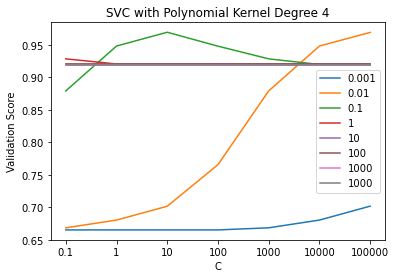

In [158]:
svc_poly_grid.cv_results_['params']
for i in range(8):
    plt.plot([str(j) for j in svc_params['poly']['C']],
             svc_poly_grid.cv_results_['mean_test_score'][16+i::32],
             label = svc_params['poly']['gamma'][i])
plt.xlabel('C')
plt.ylabel('Validation Score')
plt.legend()
plt.title('SVC with Polynomial Kernel Degree 4')

In [159]:
best_poly_C = svc_poly_grid.best_params_['C']
best_poly_deg = svc_poly_grid.best_params_['degree']
best_poly_gamma = svc_poly_grid.best_params_['gamma']
best_poly_SVC = svm.SVC(kernel='poly',  random_state = 2022,cache_size = 2000,verbose = True, 
                        C = best_poly_C, degree = best_poly_deg, gamma = best_poly_gamma,
                        max_iter = 100000, probability = True)
best_poly_SVC.fit(x_train, y_train)
y_pred = best_poly_SVC.predict(x_test)
result_dict['Polynomial SVC'] = print_results(y_test, y_pred)

[LibSVM]Model Accuracy Score: 0.9691111111111111
Model Recall Score: 0.9756606397774688
Model FBeta Score (Beta = 2): 0.9663865546218487
Model ROC_AUC Score: 0.9708479554210661


In [160]:
# multi_decision_boundary_2D(best_poly_SVC)

### Support Vector Classifier with Radial Basis Function (RBF) Kernel <a id='svcrbf'/>

In [161]:
svc_rbf_grid = svc_acc_grid['rbf']
print('Best set of hyperparameters:',svc_rbf_grid.best_params_)
print('Validation Score on best set of hyperparameters',svc_rbf_grid.best_score_)

Best set of hyperparameters: {'C': 10, 'gamma': 0.1, 'max_iter': 10000}
Validation Score on best set of hyperparameters 0.9747619047619047


Text(0.5, 1.0, 'SVC with RBF Kernel')

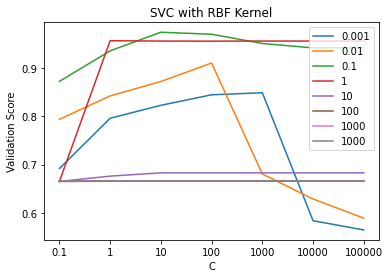

In [162]:
for i in range(8):
    plt.plot([str(j) for j in svc_params['rbf']['C']],
             svc_rbf_grid.cv_results_['mean_test_score'][i::8],
             label = svc_params['rbf']['gamma'][i])
plt.xlabel('C')
plt.ylabel('Validation Score')
plt.legend()
plt.title('SVC with RBF Kernel')

In [163]:
best_rbf_C = svc_poly_grid.best_params_['C']
best_rbf_gamma = svc_poly_grid.best_params_['gamma']
best_rbf_SVC = svm.SVC(kernel='rbf',  random_state = 2022,cache_size = 2000,verbose = True, 
                        C = best_rbf_C, gamma = best_rbf_gamma,
                        max_iter = 100000, probability = True)
best_rbf_SVC.fit(x_train, y_train)
y_pred = best_rbf_SVC.predict(x_test)
result_dict['Radial-Basis-Function SVC'] = print_results(y_test, y_pred)

[LibSVM]Model Accuracy Score: 0.9717777777777777
Model Recall Score: 0.9914529914529915
Model FBeta Score (Beta = 2): 0.9771163835462588
Model ROC_AUC Score: 0.9771541443053071


In [164]:
# multi_decision_boundary_2D(best_rbf_SVC)

## 6. Artificial Neural Network <a id='ann'/>

In [165]:
import tensorflow as tf
from tensorflow.keras import layers

In [166]:
x_train, x_test, y_train, y_test = standard_transform()

In [167]:
ann_models = []
ann_score = []
learning_rates = [0.00001, 0.0001, 0.001, 0.01, 0.1, 1]
for ind in range(len(learning_rates)):
    ann_models.append(tf.keras.models.Sequential())
    for layer_no, unit in enumerate([30,20,10]):
        ann_models[ind].add(tf.keras.layers.Dense(units = unit, activation = 'relu', name = f'Hidden{layer_no}'))
    ann_models[ind].add(layers.Dense(units = 1, activation = 'sigmoid'))
    ann_models[ind].compile(optimizer=tf.keras.optimizers.Adam(lr=learning_rates[ind]),
                               loss='binary_crossentropy', metrics = ['accuracy'])
    history = ann_models[ind].fit(x=x_train, y=y_train, 
                  batch_size = 20, epochs=250, validation_split=0.2,
                  verbose=1, shuffle=True, workers=6, use_multiprocessing=True)
    ann_score.append(history.history)

Epoch 1/250
420/420 [==============================] - 0s 1ms/step - loss: 0.7209 - accuracy: 0.4232 - val_loss: 0.7133 - val_accuracy: 0.4419
Epoch 2/250
420/420 [==============================] - 0s 816us/step - loss: 0.7046 - accuracy: 0.4679 - val_loss: 0.6995 - val_accuracy: 0.4819
Epoch 3/250
420/420 [==============================] - 0s 777us/step - loss: 0.6914 - accuracy: 0.5108 - val_loss: 0.6881 - val_accuracy: 0.5224
Epoch 4/250
420/420 [==============================] - 0s 766us/step - loss: 0.6802 - accuracy: 0.5562 - val_loss: 0.6779 - val_accuracy: 0.5662
Epoch 5/250
420/420 [==============================] - 0s 622us/step - loss: 0.6697 - accuracy: 0.6036 - val_loss: 0.6683 - val_accuracy: 0.6043
Epoch 6/250
420/420 [==============================] - 0s 643us/step - loss: 0.6595 - accuracy: 0.6392 - val_loss: 0.6589 - val_accuracy: 0.6443
Epoch 7/250
420/420 [==============================] - 0s 586us/step - loss: 0.6495 - accuracy: 0.6719 - val_loss: 0.6496 - val_accu

420/420 [==============================] - 0s 487us/step - loss: 0.4359 - accuracy: 0.8043 - val_loss: 0.4649 - val_accuracy: 0.7871
Epoch 58/250
420/420 [==============================] - 0s 489us/step - loss: 0.4346 - accuracy: 0.8050 - val_loss: 0.4639 - val_accuracy: 0.7881
Epoch 59/250
420/420 [==============================] - 0s 526us/step - loss: 0.4333 - accuracy: 0.8058 - val_loss: 0.4629 - val_accuracy: 0.7900
Epoch 60/250
420/420 [==============================] - 0s 475us/step - loss: 0.4320 - accuracy: 0.8069 - val_loss: 0.4619 - val_accuracy: 0.7905
Epoch 61/250
420/420 [==============================] - 0s 553us/step - loss: 0.4308 - accuracy: 0.8086 - val_loss: 0.4610 - val_accuracy: 0.7910
Epoch 62/250
420/420 [==============================] - 0s 467us/step - loss: 0.4296 - accuracy: 0.8110 - val_loss: 0.4601 - val_accuracy: 0.7929
Epoch 63/250
420/420 [==============================] - 0s 494us/step - loss: 0.4284 - accuracy: 0.8111 - val_loss: 0.4592 - val_accuracy

420/420 [==============================] - 0s 508us/step - loss: 0.3900 - accuracy: 0.8386 - val_loss: 0.4301 - val_accuracy: 0.8133
Epoch 114/250
420/420 [==============================] - 0s 588us/step - loss: 0.3894 - accuracy: 0.8389 - val_loss: 0.4296 - val_accuracy: 0.8148
Epoch 115/250
420/420 [==============================] - 0s 527us/step - loss: 0.3888 - accuracy: 0.8399 - val_loss: 0.4291 - val_accuracy: 0.8152
Epoch 116/250
420/420 [==============================] - 0s 538us/step - loss: 0.3882 - accuracy: 0.8399 - val_loss: 0.4287 - val_accuracy: 0.8148
Epoch 117/250
420/420 [==============================] - 0s 528us/step - loss: 0.3876 - accuracy: 0.8394 - val_loss: 0.4282 - val_accuracy: 0.8157
Epoch 118/250
420/420 [==============================] - 0s 569us/step - loss: 0.3870 - accuracy: 0.8396 - val_loss: 0.4277 - val_accuracy: 0.8152
Epoch 119/250
420/420 [==============================] - 0s 506us/step - loss: 0.3865 - accuracy: 0.8404 - val_loss: 0.4272 - val_ac

Epoch 169/250
420/420 [==============================] - 0s 513us/step - loss: 0.3612 - accuracy: 0.8538 - val_loss: 0.4047 - val_accuracy: 0.8276
Epoch 170/250
420/420 [==============================] - 0s 659us/step - loss: 0.3607 - accuracy: 0.8540 - val_loss: 0.4042 - val_accuracy: 0.8276
Epoch 171/250
420/420 [==============================] - 0s 535us/step - loss: 0.3602 - accuracy: 0.8542 - val_loss: 0.4037 - val_accuracy: 0.8281
Epoch 172/250
420/420 [==============================] - 0s 494us/step - loss: 0.3598 - accuracy: 0.8542 - val_loss: 0.4033 - val_accuracy: 0.8276
Epoch 173/250
420/420 [==============================] - 0s 568us/step - loss: 0.3593 - accuracy: 0.8542 - val_loss: 0.4028 - val_accuracy: 0.8281
Epoch 174/250
420/420 [==============================] - 0s 515us/step - loss: 0.3588 - accuracy: 0.8545 - val_loss: 0.4023 - val_accuracy: 0.8286
Epoch 175/250
420/420 [==============================] - 0s 525us/step - loss: 0.3583 - accuracy: 0.8544 - val_loss: 0

Epoch 225/250
420/420 [==============================] - 0s 587us/step - loss: 0.3342 - accuracy: 0.8664 - val_loss: 0.3779 - val_accuracy: 0.8419
Epoch 226/250
420/420 [==============================] - 0s 473us/step - loss: 0.3337 - accuracy: 0.8662 - val_loss: 0.3774 - val_accuracy: 0.8419
Epoch 227/250
420/420 [==============================] - 0s 516us/step - loss: 0.3333 - accuracy: 0.8667 - val_loss: 0.3769 - val_accuracy: 0.8429
Epoch 228/250
420/420 [==============================] - 0s 458us/step - loss: 0.3328 - accuracy: 0.8674 - val_loss: 0.3765 - val_accuracy: 0.8433
Epoch 229/250
420/420 [==============================] - 0s 480us/step - loss: 0.3323 - accuracy: 0.8674 - val_loss: 0.3760 - val_accuracy: 0.8438
Epoch 230/250
420/420 [==============================] - 0s 515us/step - loss: 0.3319 - accuracy: 0.8675 - val_loss: 0.3756 - val_accuracy: 0.8438
Epoch 231/250
420/420 [==============================] - 0s 442us/step - loss: 0.3314 - accuracy: 0.8676 - val_loss: 0

Epoch 31/250
420/420 [==============================] - 0s 444us/step - loss: 0.2843 - accuracy: 0.8908 - val_loss: 0.3206 - val_accuracy: 0.8733
Epoch 32/250
420/420 [==============================] - 0s 514us/step - loss: 0.2800 - accuracy: 0.8920 - val_loss: 0.3167 - val_accuracy: 0.8743
Epoch 33/250
420/420 [==============================] - 0s 484us/step - loss: 0.2760 - accuracy: 0.8935 - val_loss: 0.3128 - val_accuracy: 0.8786
Epoch 34/250
420/420 [==============================] - 0s 473us/step - loss: 0.2718 - accuracy: 0.8951 - val_loss: 0.3098 - val_accuracy: 0.8795
Epoch 35/250
420/420 [==============================] - 0s 450us/step - loss: 0.2681 - accuracy: 0.8963 - val_loss: 0.3058 - val_accuracy: 0.8790
Epoch 36/250
420/420 [==============================] - 0s 551us/step - loss: 0.2644 - accuracy: 0.8970 - val_loss: 0.3013 - val_accuracy: 0.8819
Epoch 37/250
420/420 [==============================] - 0s 496us/step - loss: 0.2605 - accuracy: 0.8976 - val_loss: 0.2974 -

420/420 [==============================] - 0s 469us/step - loss: 0.1411 - accuracy: 0.9623 - val_loss: 0.1777 - val_accuracy: 0.9462
Epoch 88/250
420/420 [==============================] - 0s 458us/step - loss: 0.1396 - accuracy: 0.9625 - val_loss: 0.1762 - val_accuracy: 0.9486
Epoch 89/250
420/420 [==============================] - 0s 530us/step - loss: 0.1381 - accuracy: 0.9626 - val_loss: 0.1752 - val_accuracy: 0.9510
Epoch 90/250
420/420 [==============================] - 0s 453us/step - loss: 0.1370 - accuracy: 0.9643 - val_loss: 0.1744 - val_accuracy: 0.9510
Epoch 91/250
420/420 [==============================] - 0s 515us/step - loss: 0.1356 - accuracy: 0.9654 - val_loss: 0.1726 - val_accuracy: 0.9519
Epoch 92/250
420/420 [==============================] - 0s 531us/step - loss: 0.1343 - accuracy: 0.9656 - val_loss: 0.1707 - val_accuracy: 0.9524
Epoch 93/250
420/420 [==============================] - 0s 469us/step - loss: 0.1329 - accuracy: 0.9667 - val_loss: 0.1680 - val_accuracy

420/420 [==============================] - 0s 458us/step - loss: 0.0920 - accuracy: 0.9815 - val_loss: 0.1289 - val_accuracy: 0.9771
Epoch 143/250
420/420 [==============================] - 0s 465us/step - loss: 0.0911 - accuracy: 0.9821 - val_loss: 0.1297 - val_accuracy: 0.9757
Epoch 144/250
420/420 [==============================] - 0s 476us/step - loss: 0.0907 - accuracy: 0.9824 - val_loss: 0.1282 - val_accuracy: 0.9767
Epoch 145/250
420/420 [==============================] - 0s 478us/step - loss: 0.0903 - accuracy: 0.9824 - val_loss: 0.1274 - val_accuracy: 0.9771
Epoch 146/250
420/420 [==============================] - 0s 475us/step - loss: 0.0897 - accuracy: 0.9823 - val_loss: 0.1288 - val_accuracy: 0.9771
Epoch 147/250
420/420 [==============================] - 0s 593us/step - loss: 0.0891 - accuracy: 0.9819 - val_loss: 0.1270 - val_accuracy: 0.9771
Epoch 148/250
420/420 [==============================] - 0s 470us/step - loss: 0.0888 - accuracy: 0.9827 - val_loss: 0.1264 - val_ac

Epoch 198/250
420/420 [==============================] - 0s 507us/step - loss: 0.0716 - accuracy: 0.9848 - val_loss: 0.1160 - val_accuracy: 0.9781
Epoch 199/250
420/420 [==============================] - 0s 465us/step - loss: 0.0718 - accuracy: 0.9849 - val_loss: 0.1146 - val_accuracy: 0.9786
Epoch 200/250
420/420 [==============================] - 0s 545us/step - loss: 0.0713 - accuracy: 0.9850 - val_loss: 0.1150 - val_accuracy: 0.9781
Epoch 201/250
420/420 [==============================] - 0s 464us/step - loss: 0.0708 - accuracy: 0.9854 - val_loss: 0.1140 - val_accuracy: 0.9795
Epoch 202/250
420/420 [==============================] - 0s 600us/step - loss: 0.0707 - accuracy: 0.9840 - val_loss: 0.1154 - val_accuracy: 0.9767
Epoch 203/250
420/420 [==============================] - 0s 604us/step - loss: 0.0705 - accuracy: 0.9850 - val_loss: 0.1145 - val_accuracy: 0.9786
Epoch 204/250
420/420 [==============================] - 0s 565us/step - loss: 0.0704 - accuracy: 0.9850 - val_loss: 0

420/420 [==============================] - 0s 682us/step - loss: 0.3031 - accuracy: 0.8807 - val_loss: 0.3087 - val_accuracy: 0.8700
Epoch 4/250
420/420 [==============================] - 0s 728us/step - loss: 0.2539 - accuracy: 0.8987 - val_loss: 0.2564 - val_accuracy: 0.8981
Epoch 5/250
420/420 [==============================] - 0s 820us/step - loss: 0.2122 - accuracy: 0.9211 - val_loss: 0.2245 - val_accuracy: 0.9100
Epoch 6/250
420/420 [==============================] - 0s 742us/step - loss: 0.1792 - accuracy: 0.9354 - val_loss: 0.1917 - val_accuracy: 0.9319
Epoch 7/250
420/420 [==============================] - 0s 677us/step - loss: 0.1556 - accuracy: 0.9476 - val_loss: 0.1703 - val_accuracy: 0.9457
Epoch 8/250
420/420 [==============================] - 0s 804us/step - loss: 0.1386 - accuracy: 0.9602 - val_loss: 0.1585 - val_accuracy: 0.9562
Epoch 9/250
420/420 [==============================] - 0s 662us/step - loss: 0.1264 - accuracy: 0.9665 - val_loss: 0.1551 - val_accuracy: 0.96

420/420 [==============================] - 0s 674us/step - loss: 0.0487 - accuracy: 0.9865 - val_loss: 0.1433 - val_accuracy: 0.9662
Epoch 60/250
420/420 [==============================] - 0s 534us/step - loss: 0.0491 - accuracy: 0.9858 - val_loss: 0.1271 - val_accuracy: 0.9771
Epoch 61/250
420/420 [==============================] - 0s 510us/step - loss: 0.0494 - accuracy: 0.9861 - val_loss: 0.1309 - val_accuracy: 0.9805
Epoch 62/250
420/420 [==============================] - 0s 501us/step - loss: 0.0473 - accuracy: 0.9863 - val_loss: 0.1460 - val_accuracy: 0.9767
Epoch 63/250
420/420 [==============================] - 0s 493us/step - loss: 0.0486 - accuracy: 0.9867 - val_loss: 0.1272 - val_accuracy: 0.9795
Epoch 64/250
420/420 [==============================] - 0s 519us/step - loss: 0.0481 - accuracy: 0.9856 - val_loss: 0.1377 - val_accuracy: 0.9819
Epoch 65/250
420/420 [==============================] - 0s 492us/step - loss: 0.0463 - accuracy: 0.9861 - val_loss: 0.1394 - val_accuracy

420/420 [==============================] - 0s 544us/step - loss: 0.0361 - accuracy: 0.9879 - val_loss: 0.1708 - val_accuracy: 0.9700
Epoch 116/250
420/420 [==============================] - 0s 686us/step - loss: 0.0351 - accuracy: 0.9877 - val_loss: 0.1784 - val_accuracy: 0.9762
Epoch 117/250
420/420 [==============================] - 0s 527us/step - loss: 0.0341 - accuracy: 0.9892 - val_loss: 0.1669 - val_accuracy: 0.9757
Epoch 118/250
420/420 [==============================] - 0s 500us/step - loss: 0.0320 - accuracy: 0.9888 - val_loss: 0.1631 - val_accuracy: 0.9762
Epoch 119/250
420/420 [==============================] - 0s 496us/step - loss: 0.0340 - accuracy: 0.9887 - val_loss: 0.1797 - val_accuracy: 0.9771
Epoch 120/250
420/420 [==============================] - 0s 525us/step - loss: 0.0331 - accuracy: 0.9888 - val_loss: 0.1740 - val_accuracy: 0.9724
Epoch 121/250
420/420 [==============================] - 0s 494us/step - loss: 0.0318 - accuracy: 0.9886 - val_loss: 0.1812 - val_ac

Epoch 171/250
420/420 [==============================] - 0s 535us/step - loss: 0.0272 - accuracy: 0.9899 - val_loss: 0.2184 - val_accuracy: 0.9748
Epoch 172/250
420/420 [==============================] - 0s 642us/step - loss: 0.0272 - accuracy: 0.9899 - val_loss: 0.2218 - val_accuracy: 0.9700
Epoch 173/250
420/420 [==============================] - 0s 671us/step - loss: 0.0286 - accuracy: 0.9895 - val_loss: 0.2393 - val_accuracy: 0.9657
Epoch 174/250
420/420 [==============================] - 0s 724us/step - loss: 0.0287 - accuracy: 0.9902 - val_loss: 0.2307 - val_accuracy: 0.9690
Epoch 175/250
420/420 [==============================] - 0s 805us/step - loss: 0.0250 - accuracy: 0.9911 - val_loss: 0.2188 - val_accuracy: 0.9705
Epoch 176/250
420/420 [==============================] - 0s 725us/step - loss: 0.0254 - accuracy: 0.9908 - val_loss: 0.2366 - val_accuracy: 0.9624
Epoch 177/250
420/420 [==============================] - 0s 618us/step - loss: 0.0261 - accuracy: 0.9906 - val_loss: 0

Epoch 227/250
420/420 [==============================] - 0s 504us/step - loss: 0.0204 - accuracy: 0.9933 - val_loss: 0.2755 - val_accuracy: 0.9657
Epoch 228/250
420/420 [==============================] - 0s 512us/step - loss: 0.0217 - accuracy: 0.9915 - val_loss: 0.2675 - val_accuracy: 0.9657
Epoch 229/250
420/420 [==============================] - 0s 489us/step - loss: 0.0222 - accuracy: 0.9923 - val_loss: 0.2652 - val_accuracy: 0.9719
Epoch 230/250
420/420 [==============================] - 0s 498us/step - loss: 0.0187 - accuracy: 0.9923 - val_loss: 0.2620 - val_accuracy: 0.9695
Epoch 231/250
420/420 [==============================] - 0s 592us/step - loss: 0.0187 - accuracy: 0.9926 - val_loss: 0.2749 - val_accuracy: 0.9748
Epoch 232/250
420/420 [==============================] - 0s 560us/step - loss: 0.0227 - accuracy: 0.9919 - val_loss: 0.2765 - val_accuracy: 0.9667
Epoch 233/250
420/420 [==============================] - 0s 542us/step - loss: 0.0216 - accuracy: 0.9926 - val_loss: 0

420/420 [==============================] - 0s 523us/step - loss: 0.0612 - accuracy: 0.9855 - val_loss: 0.1065 - val_accuracy: 0.9762
Epoch 34/250
420/420 [==============================] - 0s 498us/step - loss: 0.0954 - accuracy: 0.9751 - val_loss: 0.0864 - val_accuracy: 0.9838
Epoch 35/250
420/420 [==============================] - 0s 517us/step - loss: 0.0658 - accuracy: 0.9846 - val_loss: 0.1072 - val_accuracy: 0.9762
Epoch 36/250
420/420 [==============================] - 0s 515us/step - loss: 0.0662 - accuracy: 0.9843 - val_loss: 0.0862 - val_accuracy: 0.9843
Epoch 37/250
420/420 [==============================] - 0s 502us/step - loss: 0.0625 - accuracy: 0.9852 - val_loss: 0.1145 - val_accuracy: 0.9762
Epoch 38/250
420/420 [==============================] - 0s 535us/step - loss: 0.0837 - accuracy: 0.9785 - val_loss: 0.0951 - val_accuracy: 0.9805
Epoch 39/250
420/420 [==============================] - 0s 773us/step - loss: 0.0639 - accuracy: 0.9846 - val_loss: 0.1077 - val_accuracy

420/420 [==============================] - 0s 515us/step - loss: 0.0561 - accuracy: 0.9843 - val_loss: 0.1180 - val_accuracy: 0.9790
Epoch 90/250
420/420 [==============================] - 0s 517us/step - loss: 0.0499 - accuracy: 0.9858 - val_loss: 0.1333 - val_accuracy: 0.9833
Epoch 91/250
420/420 [==============================] - 0s 517us/step - loss: 0.0482 - accuracy: 0.9864 - val_loss: 0.1143 - val_accuracy: 0.9790
Epoch 92/250
420/420 [==============================] - 0s 534us/step - loss: 0.0505 - accuracy: 0.9857 - val_loss: 0.1393 - val_accuracy: 0.9771
Epoch 93/250
420/420 [==============================] - 0s 514us/step - loss: 0.0555 - accuracy: 0.9845 - val_loss: 0.1303 - val_accuracy: 0.9810
Epoch 94/250
420/420 [==============================] - 0s 568us/step - loss: 0.0533 - accuracy: 0.9851 - val_loss: 0.1441 - val_accuracy: 0.9762
Epoch 95/250
420/420 [==============================] - 0s 554us/step - loss: 0.0624 - accuracy: 0.9843 - val_loss: 0.1504 - val_accuracy

Epoch 145/250
420/420 [==============================] - 0s 562us/step - loss: 0.0481 - accuracy: 0.9855 - val_loss: 0.1567 - val_accuracy: 0.9838
Epoch 146/250
420/420 [==============================] - 0s 509us/step - loss: 0.0544 - accuracy: 0.9856 - val_loss: 0.1891 - val_accuracy: 0.9790
Epoch 147/250
420/420 [==============================] - 0s 662us/step - loss: 0.0474 - accuracy: 0.9858 - val_loss: 0.1544 - val_accuracy: 0.9833
Epoch 148/250
420/420 [==============================] - 0s 509us/step - loss: 0.0450 - accuracy: 0.9861 - val_loss: 0.1933 - val_accuracy: 0.9838
Epoch 149/250
420/420 [==============================] - 0s 511us/step - loss: 0.0521 - accuracy: 0.9852 - val_loss: 0.2113 - val_accuracy: 0.9805
Epoch 150/250
420/420 [==============================] - 0s 563us/step - loss: 0.0471 - accuracy: 0.9845 - val_loss: 0.2028 - val_accuracy: 0.9819
Epoch 151/250
420/420 [==============================] - 0s 525us/step - loss: 0.0455 - accuracy: 0.9858 - val_loss: 0

Epoch 201/250
420/420 [==============================] - 0s 618us/step - loss: 0.0387 - accuracy: 0.9867 - val_loss: 0.2561 - val_accuracy: 0.9833
Epoch 202/250
420/420 [==============================] - 0s 614us/step - loss: 0.0714 - accuracy: 0.9830 - val_loss: 0.2035 - val_accuracy: 0.9795
Epoch 203/250
420/420 [==============================] - 0s 735us/step - loss: 0.0482 - accuracy: 0.9852 - val_loss: 0.1992 - val_accuracy: 0.9814
Epoch 204/250
420/420 [==============================] - 0s 719us/step - loss: 0.0446 - accuracy: 0.9861 - val_loss: 0.2047 - val_accuracy: 0.9724
Epoch 205/250
420/420 [==============================] - 0s 730us/step - loss: 0.0423 - accuracy: 0.9858 - val_loss: 0.2785 - val_accuracy: 0.9805
Epoch 206/250
420/420 [==============================] - 0s 676us/step - loss: 0.0376 - accuracy: 0.9865 - val_loss: 0.2509 - val_accuracy: 0.9819
Epoch 207/250
420/420 [==============================] - 0s 660us/step - loss: 0.0391 - accuracy: 0.9867 - val_loss: 0

Epoch 7/250
420/420 [==============================] - 0s 559us/step - loss: 0.4455 - accuracy: 0.7979 - val_loss: 0.6030 - val_accuracy: 0.8200
Epoch 8/250
420/420 [==============================] - 0s 542us/step - loss: 0.4699 - accuracy: 0.7736 - val_loss: 0.5361 - val_accuracy: 0.6586
Epoch 9/250
420/420 [==============================] - 0s 573us/step - loss: 0.5160 - accuracy: 0.7151 - val_loss: 0.5496 - val_accuracy: 0.6562
Epoch 10/250
420/420 [==============================] - 0s 529us/step - loss: 0.4973 - accuracy: 0.7507 - val_loss: 0.4920 - val_accuracy: 0.7671
Epoch 11/250
420/420 [==============================] - 0s 520us/step - loss: 0.4764 - accuracy: 0.7938 - val_loss: 0.5503 - val_accuracy: 0.7481
Epoch 12/250
420/420 [==============================] - 0s 565us/step - loss: 0.4956 - accuracy: 0.7863 - val_loss: 0.5535 - val_accuracy: 0.7829
Epoch 13/250
420/420 [==============================] - 0s 646us/step - loss: 0.5015 - accuracy: 0.7608 - val_loss: 0.6998 - va

420/420 [==============================] - 0s 665us/step - loss: 0.3617 - accuracy: 0.8436 - val_loss: 0.4721 - val_accuracy: 0.8314
Epoch 64/250
420/420 [==============================] - 0s 644us/step - loss: 0.3713 - accuracy: 0.8417 - val_loss: 0.4069 - val_accuracy: 0.8186
Epoch 65/250
420/420 [==============================] - 0s 682us/step - loss: 0.4285 - accuracy: 0.8343 - val_loss: 0.4501 - val_accuracy: 0.8152
Epoch 66/250
420/420 [==============================] - 0s 649us/step - loss: 0.4241 - accuracy: 0.8265 - val_loss: 0.5576 - val_accuracy: 0.8095
Epoch 67/250
420/420 [==============================] - 0s 674us/step - loss: 0.4372 - accuracy: 0.8210 - val_loss: 0.4686 - val_accuracy: 0.8076
Epoch 68/250
420/420 [==============================] - 0s 565us/step - loss: 0.4334 - accuracy: 0.8221 - val_loss: 0.4562 - val_accuracy: 0.8148
Epoch 69/250
420/420 [==============================] - 0s 566us/step - loss: 0.4215 - accuracy: 0.8307 - val_loss: 0.4438 - val_accuracy

420/420 [==============================] - 0s 555us/step - loss: 0.4586 - accuracy: 0.8198 - val_loss: 0.4617 - val_accuracy: 0.8171
Epoch 120/250
420/420 [==============================] - 0s 523us/step - loss: 0.4603 - accuracy: 0.8198 - val_loss: 0.4760 - val_accuracy: 0.8171
Epoch 121/250
420/420 [==============================] - 0s 713us/step - loss: 0.4586 - accuracy: 0.8198 - val_loss: 0.4616 - val_accuracy: 0.8171
Epoch 122/250
420/420 [==============================] - 0s 691us/step - loss: 0.4598 - accuracy: 0.8198 - val_loss: 0.4638 - val_accuracy: 0.8171
Epoch 123/250
420/420 [==============================] - 0s 620us/step - loss: 0.4605 - accuracy: 0.8198 - val_loss: 0.4613 - val_accuracy: 0.8171
Epoch 124/250
420/420 [==============================] - 0s 513us/step - loss: 0.4576 - accuracy: 0.8198 - val_loss: 0.4662 - val_accuracy: 0.8171
Epoch 125/250
420/420 [==============================] - 0s 519us/step - loss: 0.4594 - accuracy: 0.8198 - val_loss: 0.4668 - val_ac

Epoch 175/250
420/420 [==============================] - 0s 782us/step - loss: 0.4621 - accuracy: 0.8198 - val_loss: 0.4620 - val_accuracy: 0.8171
Epoch 176/250
420/420 [==============================] - 0s 804us/step - loss: 0.4587 - accuracy: 0.8198 - val_loss: 0.4624 - val_accuracy: 0.8171
Epoch 177/250
420/420 [==============================] - 0s 682us/step - loss: 0.4614 - accuracy: 0.8198 - val_loss: 0.4647 - val_accuracy: 0.8171
Epoch 178/250
420/420 [==============================] - 0s 648us/step - loss: 0.4568 - accuracy: 0.8198 - val_loss: 0.4668 - val_accuracy: 0.8171
Epoch 179/250
420/420 [==============================] - 0s 604us/step - loss: 0.4620 - accuracy: 0.8198 - val_loss: 0.4626 - val_accuracy: 0.8171
Epoch 180/250
420/420 [==============================] - 0s 638us/step - loss: 0.4579 - accuracy: 0.8198 - val_loss: 0.4611 - val_accuracy: 0.8171
Epoch 181/250
420/420 [==============================] - 0s 569us/step - loss: 0.4601 - accuracy: 0.8198 - val_loss: 0

Epoch 231/250
420/420 [==============================] - 0s 556us/step - loss: 0.4608 - accuracy: 0.8198 - val_loss: 0.4691 - val_accuracy: 0.8171
Epoch 232/250
420/420 [==============================] - 0s 658us/step - loss: 0.4600 - accuracy: 0.8198 - val_loss: 0.4625 - val_accuracy: 0.8171
Epoch 233/250
420/420 [==============================] - 0s 542us/step - loss: 0.4590 - accuracy: 0.8198 - val_loss: 0.4633 - val_accuracy: 0.8171
Epoch 234/250
420/420 [==============================] - 0s 543us/step - loss: 0.4590 - accuracy: 0.8198 - val_loss: 0.4625 - val_accuracy: 0.8171
Epoch 235/250
420/420 [==============================] - 0s 577us/step - loss: 0.4592 - accuracy: 0.8198 - val_loss: 0.4653 - val_accuracy: 0.8171
Epoch 236/250
420/420 [==============================] - 0s 625us/step - loss: 0.4580 - accuracy: 0.8198 - val_loss: 0.4663 - val_accuracy: 0.8171
Epoch 237/250
420/420 [==============================] - 0s 542us/step - loss: 0.4603 - accuracy: 0.8198 - val_loss: 0

420/420 [==============================] - 0s 631us/step - loss: 0.6618 - accuracy: 0.6494 - val_loss: 0.6516 - val_accuracy: 0.6586
Epoch 38/250
420/420 [==============================] - 0s 600us/step - loss: 0.6552 - accuracy: 0.6570 - val_loss: 0.6492 - val_accuracy: 0.6586
Epoch 39/250
420/420 [==============================] - 0s 624us/step - loss: 0.6499 - accuracy: 0.6582 - val_loss: 0.6431 - val_accuracy: 0.6586
Epoch 40/250
420/420 [==============================] - 0s 595us/step - loss: 0.6530 - accuracy: 0.6592 - val_loss: 0.6862 - val_accuracy: 0.6586
Epoch 41/250
420/420 [==============================] - 0s 557us/step - loss: 0.6578 - accuracy: 0.6520 - val_loss: 0.6426 - val_accuracy: 0.6586
Epoch 42/250
420/420 [==============================] - 0s 588us/step - loss: 0.6561 - accuracy: 0.6513 - val_loss: 0.6675 - val_accuracy: 0.6586
Epoch 43/250
420/420 [==============================] - 0s 631us/step - loss: 0.6535 - accuracy: 0.6577 - val_loss: 0.6427 - val_accuracy

420/420 [==============================] - 0s 570us/step - loss: 0.6598 - accuracy: 0.6470 - val_loss: 0.6436 - val_accuracy: 0.6586
Epoch 94/250
420/420 [==============================] - 0s 686us/step - loss: 0.6509 - accuracy: 0.6568 - val_loss: 0.6499 - val_accuracy: 0.6586
Epoch 95/250
420/420 [==============================] - 0s 553us/step - loss: 0.6603 - accuracy: 0.6542 - val_loss: 0.6592 - val_accuracy: 0.6586
Epoch 96/250
420/420 [==============================] - 0s 566us/step - loss: 0.6513 - accuracy: 0.6630 - val_loss: 0.6423 - val_accuracy: 0.6586
Epoch 97/250
420/420 [==============================] - 0s 558us/step - loss: 0.6609 - accuracy: 0.6465 - val_loss: 0.6508 - val_accuracy: 0.6586
Epoch 98/250
420/420 [==============================] - 0s 699us/step - loss: 0.6611 - accuracy: 0.6437 - val_loss: 0.6436 - val_accuracy: 0.6586
Epoch 99/250
420/420 [==============================] - 0s 588us/step - loss: 0.6528 - accuracy: 0.6582 - val_loss: 0.6627 - val_accuracy

Epoch 149/250
420/420 [==============================] - 0s 650us/step - loss: 0.6657 - accuracy: 0.6430 - val_loss: 0.6450 - val_accuracy: 0.6586
Epoch 150/250
420/420 [==============================] - 0s 613us/step - loss: 0.6565 - accuracy: 0.6554 - val_loss: 0.6442 - val_accuracy: 0.6586
Epoch 151/250
420/420 [==============================] - 0s 579us/step - loss: 0.6608 - accuracy: 0.6492 - val_loss: 0.6468 - val_accuracy: 0.6586
Epoch 152/250
420/420 [==============================] - 0s 581us/step - loss: 0.6650 - accuracy: 0.6446 - val_loss: 0.7182 - val_accuracy: 0.6586
Epoch 153/250
420/420 [==============================] - 0s 657us/step - loss: 0.6526 - accuracy: 0.6554 - val_loss: 0.6828 - val_accuracy: 0.6586
Epoch 154/250
420/420 [==============================] - 0s 602us/step - loss: 0.6608 - accuracy: 0.6546 - val_loss: 0.6431 - val_accuracy: 0.6586
Epoch 155/250
420/420 [==============================] - 0s 594us/step - loss: 0.6520 - accuracy: 0.6625 - val_loss: 0

Epoch 205/250
420/420 [==============================] - 0s 697us/step - loss: 0.6533 - accuracy: 0.6577 - val_loss: 0.6421 - val_accuracy: 0.6586
Epoch 206/250
420/420 [==============================] - 0s 756us/step - loss: 0.6592 - accuracy: 0.6530 - val_loss: 0.6537 - val_accuracy: 0.6586
Epoch 207/250
420/420 [==============================] - 0s 686us/step - loss: 0.6635 - accuracy: 0.6482 - val_loss: 0.9720 - val_accuracy: 0.6586
Epoch 208/250
420/420 [==============================] - 0s 665us/step - loss: 0.6592 - accuracy: 0.6482 - val_loss: 0.6491 - val_accuracy: 0.6586
Epoch 209/250
420/420 [==============================] - 0s 783us/step - loss: 0.6551 - accuracy: 0.6580 - val_loss: 0.6528 - val_accuracy: 0.6586
Epoch 210/250
420/420 [==============================] - 0s 682us/step - loss: 0.6592 - accuracy: 0.6463 - val_loss: 0.6601 - val_accuracy: 0.6586
Epoch 211/250
420/420 [==============================] - 0s 704us/step - loss: 0.6540 - accuracy: 0.6585 - val_loss: 0

In [168]:
ann_models[3].summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Hidden0 (Dense)              (20, 30)                  630       
_________________________________________________________________
Hidden1 (Dense)              (20, 20)                  620       
_________________________________________________________________
Hidden2 (Dense)              (20, 10)                  210       
_________________________________________________________________
dense_3 (Dense)              (20, 1)                   11        
Total params: 1,471
Trainable params: 1,471
Non-trainable params: 0
_________________________________________________________________


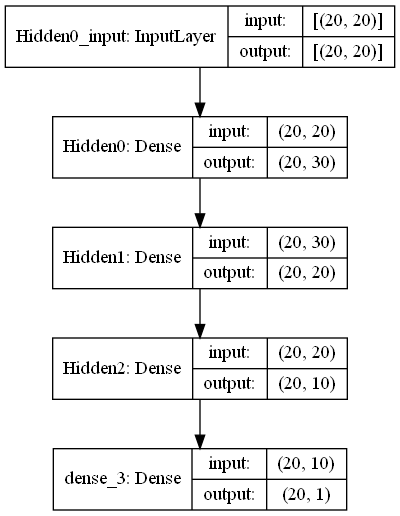

In [169]:
tf.keras.utils.plot_model(ann_models[3], "multi_input_and_output_model.png", show_shapes=True)

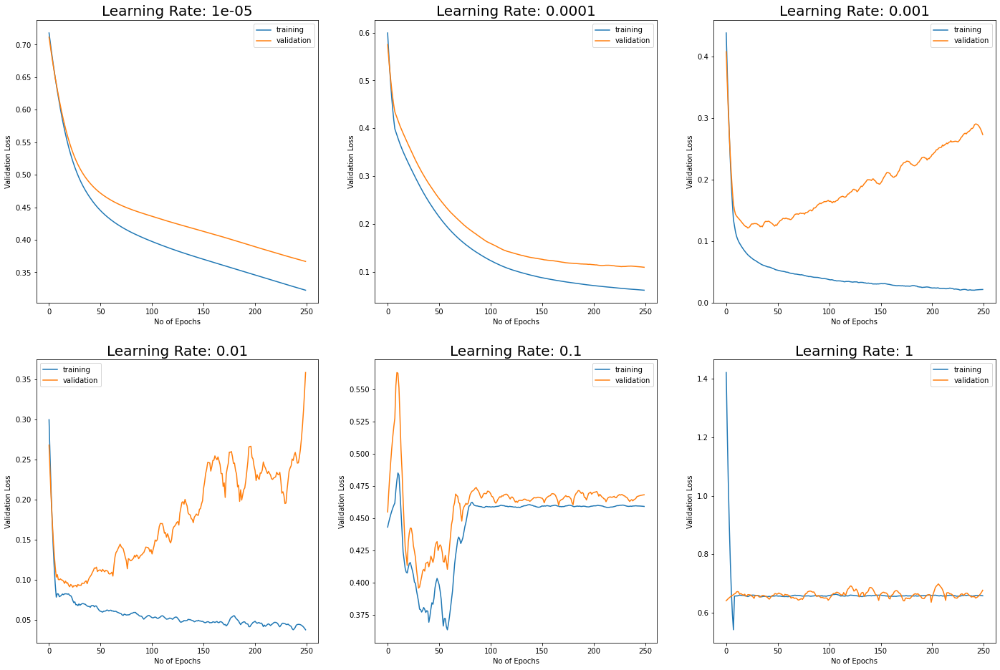

In [170]:
plt.figure(figsize = (24,16))
ind = 1
for i in range(len(ann_score)):
    history = ann_score[i]
    plt.subplot(2,3,ind)
    plt.plot(savgol_filter(history['loss'],15,2),label = 'training')
    plt.plot(savgol_filter(history['val_loss'],15,2),label = 'validation')
    ind += 1
    plt.xlabel('No of Epochs')
    plt.ylabel('Validation Loss')
    plt.title('Learning Rate: ' + str(learning_rates[i]), fontsize=20)
    plt.legend()
plt.show()

## plt.figure(figsize = (10,8))
colors = ['red','blue','green','orange','black','purple']
for i in range(len(ann_score)):
    history = ann_score[i]
    plt.plot(savgol_filter(history['val_loss'],15,2), color = colors[i], label = learning_rates[i])
    plt.xlabel('No of Epochs')
    plt.ylabel('Validation Loss')
    plt.title('Validation Loss vs Learning Rates', fontsize = 20)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

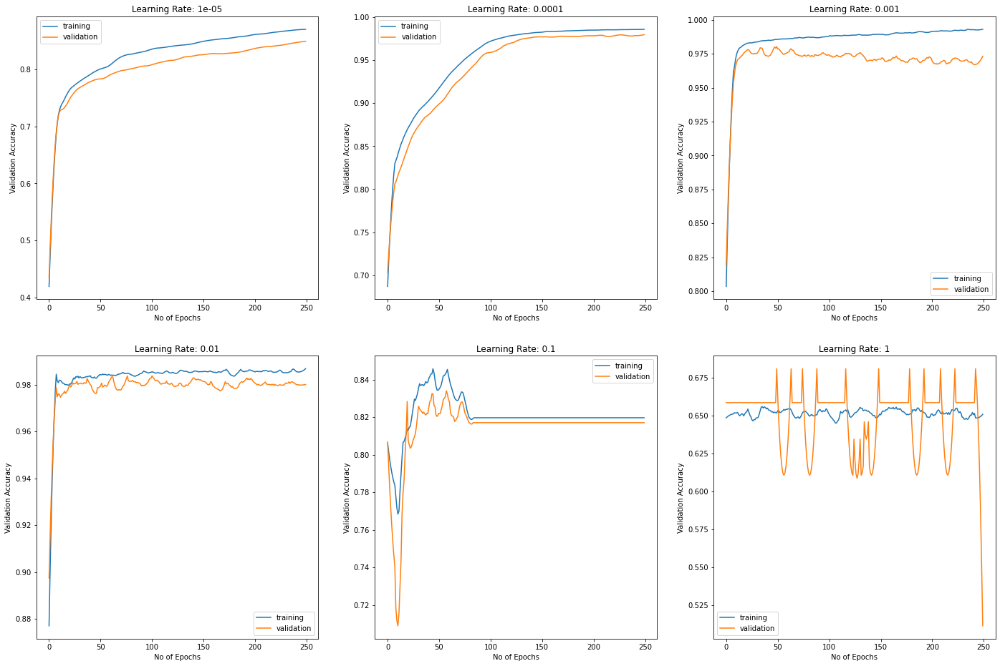

In [171]:
plt.figure(figsize = (24,16))
ind = 1
for i in range(len(ann_score)):
    history = ann_score[i]
    plt.subplot(2,3,ind)
    plt.plot(savgol_filter(history['accuracy'],15,2),label = 'training')
    plt.plot(savgol_filter(history['val_accuracy'],15,2),label = 'validation')
    ind += 1
    plt.xlabel('No of Epochs')
    plt.ylabel('Validation Accuracy')
    plt.title('Learning Rate: ' + str(learning_rates[i]))
    plt.legend()

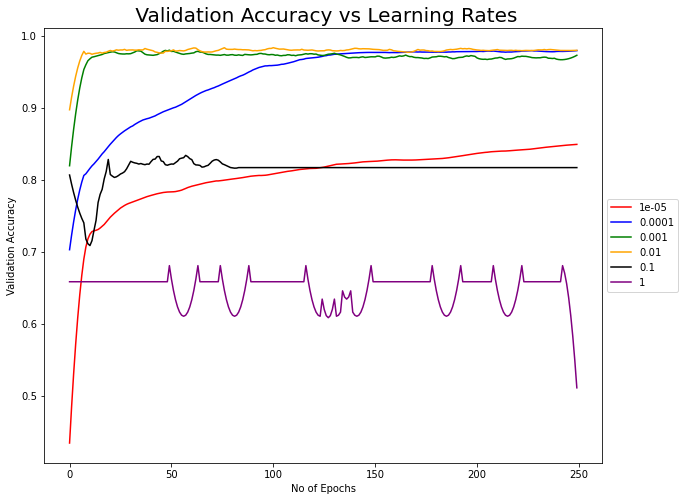

In [172]:
plt.figure(figsize = (10,8))
colors = ['red','blue','green','orange','black','purple']
for i in range(len(ann_score)):
    history = ann_score[i]
    plt.plot(savgol_filter(history['val_accuracy'],15,2), color = colors[i], label = learning_rates[i])
    plt.xlabel('No of Epochs')
    plt.ylabel('Validation Accuracy')
    plt.title(' Validation Accuracy vs Learning Rates', fontsize = 20)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

## Artificial Neural Network with l1/l2 regularization <a id='annl12'/>

In [173]:
x_train, x_test, y_train, y_test = standard_transform()

In [174]:
weights = [0, 0.05, 0.1]

reg_l1_models = []
reg_l1_scores = []

for i in range(len(weights)):
    reg_l1_models.append(tf.keras.models.Sequential())
    for layer_no, unit in enumerate([30,20,10]):
        reg_l1_models[i].add(tf.keras.layers.Dense(units = unit, activation = 'relu',
                                            kernel_regularizer= tf.keras.regularizers.l1(l = weights[i])))
    reg_l1_models[i].add(layers.Dense(units = 1, activation = 'sigmoid'))
    reg_l1_models[i].compile(optimizer=tf.keras.optimizers.Adam(lr=0.01),
                               loss='binary_crossentropy', metrics = ['accuracy'])
    history = reg_l1_models[i].fit(x=x_train, y=y_train, 
                  batch_size = 20, epochs=250, validation_split=0.2,
                  verbose=1, shuffle=True, workers=6, use_multiprocessing=True)
    
    reg_l1_scores.append(history.history)

Epoch 1/250
420/420 [==============================] - 0s 854us/step - loss: 0.3831 - accuracy: 0.8280 - val_loss: 0.3387 - val_accuracy: 0.8581
Epoch 2/250
420/420 [==============================] - 0s 647us/step - loss: 0.2394 - accuracy: 0.9081 - val_loss: 0.2294 - val_accuracy: 0.9105
Epoch 3/250
420/420 [==============================] - 0s 587us/step - loss: 0.1862 - accuracy: 0.9348 - val_loss: 0.1895 - val_accuracy: 0.9348
Epoch 4/250
420/420 [==============================] - 0s 579us/step - loss: 0.1405 - accuracy: 0.9575 - val_loss: 0.1561 - val_accuracy: 0.9533
Epoch 5/250
420/420 [==============================] - 0s 652us/step - loss: 0.1351 - accuracy: 0.9613 - val_loss: 0.1396 - val_accuracy: 0.9590
Epoch 6/250
420/420 [==============================] - 0s 627us/step - loss: 0.1025 - accuracy: 0.9743 - val_loss: 0.1167 - val_accuracy: 0.9714
Epoch 7/250
420/420 [==============================] - 0s 581us/step - loss: 0.0941 - accuracy: 0.9756 - val_loss: 0.1155 - val_ac

420/420 [==============================] - 0s 634us/step - loss: 0.0548 - accuracy: 0.9864 - val_loss: 0.0968 - val_accuracy: 0.9805
Epoch 58/250
420/420 [==============================] - 0s 567us/step - loss: 0.0561 - accuracy: 0.9855 - val_loss: 0.1178 - val_accuracy: 0.9814
Epoch 59/250
420/420 [==============================] - 0s 572us/step - loss: 0.0591 - accuracy: 0.9850 - val_loss: 0.1320 - val_accuracy: 0.9786
Epoch 60/250
420/420 [==============================] - 0s 695us/step - loss: 0.0642 - accuracy: 0.9842 - val_loss: 0.1308 - val_accuracy: 0.9757
Epoch 61/250
420/420 [==============================] - 0s 623us/step - loss: 0.0651 - accuracy: 0.9831 - val_loss: 0.1159 - val_accuracy: 0.9833
Epoch 62/250
420/420 [==============================] - 0s 569us/step - loss: 0.0614 - accuracy: 0.9848 - val_loss: 0.1034 - val_accuracy: 0.9843
Epoch 63/250
420/420 [==============================] - 0s 568us/step - loss: 0.0619 - accuracy: 0.9856 - val_loss: 0.1177 - val_accuracy

420/420 [==============================] - 0s 599us/step - loss: 0.0518 - accuracy: 0.9865 - val_loss: 0.1221 - val_accuracy: 0.9805
Epoch 114/250
420/420 [==============================] - 0s 566us/step - loss: 0.0548 - accuracy: 0.9846 - val_loss: 0.1535 - val_accuracy: 0.9814
Epoch 115/250
420/420 [==============================] - 0s 627us/step - loss: 0.0639 - accuracy: 0.9830 - val_loss: 0.1428 - val_accuracy: 0.9805
Epoch 116/250
420/420 [==============================] - 0s 612us/step - loss: 0.0496 - accuracy: 0.9862 - val_loss: 0.1645 - val_accuracy: 0.9800
Epoch 117/250
420/420 [==============================] - 0s 567us/step - loss: 0.0456 - accuracy: 0.9871 - val_loss: 0.1878 - val_accuracy: 0.9829
Epoch 118/250
420/420 [==============================] - 0s 563us/step - loss: 0.0532 - accuracy: 0.9863 - val_loss: 0.1795 - val_accuracy: 0.9819
Epoch 119/250
420/420 [==============================] - 0s 607us/step - loss: 0.0480 - accuracy: 0.9870 - val_loss: 0.1589 - val_ac

Epoch 169/250
420/420 [==============================] - 0s 598us/step - loss: 0.0623 - accuracy: 0.9840 - val_loss: 0.2383 - val_accuracy: 0.9838
Epoch 170/250
420/420 [==============================] - 0s 609us/step - loss: 0.0446 - accuracy: 0.9863 - val_loss: 0.2432 - val_accuracy: 0.9800
Epoch 171/250
420/420 [==============================] - 0s 584us/step - loss: 0.0440 - accuracy: 0.9865 - val_loss: 0.2145 - val_accuracy: 0.9838
Epoch 172/250
420/420 [==============================] - 0s 583us/step - loss: 0.0407 - accuracy: 0.9871 - val_loss: 0.2430 - val_accuracy: 0.9833
Epoch 173/250
420/420 [==============================] - 0s 595us/step - loss: 0.0474 - accuracy: 0.9861 - val_loss: 0.2269 - val_accuracy: 0.9819
Epoch 174/250
420/420 [==============================] - 0s 672us/step - loss: 0.0435 - accuracy: 0.9849 - val_loss: 0.2428 - val_accuracy: 0.9810
Epoch 175/250
420/420 [==============================] - 0s 597us/step - loss: 0.0433 - accuracy: 0.9865 - val_loss: 0

Epoch 225/250
420/420 [==============================] - 0s 674us/step - loss: 0.0418 - accuracy: 0.9861 - val_loss: 0.3098 - val_accuracy: 0.9805
Epoch 226/250
420/420 [==============================] - 0s 598us/step - loss: 0.0582 - accuracy: 0.9843 - val_loss: 0.3204 - val_accuracy: 0.9800
Epoch 227/250
420/420 [==============================] - 0s 655us/step - loss: 0.0410 - accuracy: 0.9868 - val_loss: 0.1903 - val_accuracy: 0.9814
Epoch 228/250
420/420 [==============================] - 0s 617us/step - loss: 0.0474 - accuracy: 0.9856 - val_loss: 0.2408 - val_accuracy: 0.9776
Epoch 229/250
420/420 [==============================] - 0s 600us/step - loss: 0.0416 - accuracy: 0.9860 - val_loss: 0.2471 - val_accuracy: 0.9810
Epoch 230/250
420/420 [==============================] - 0s 577us/step - loss: 0.0360 - accuracy: 0.9873 - val_loss: 0.2397 - val_accuracy: 0.9819
Epoch 231/250
420/420 [==============================] - 0s 576us/step - loss: 0.0394 - accuracy: 0.9863 - val_loss: 0

Epoch 31/250
420/420 [==============================] - 0s 797us/step - loss: 0.7251 - accuracy: 0.6668 - val_loss: 0.7296 - val_accuracy: 0.6586
Epoch 32/250
420/420 [==============================] - 0s 627us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0.7304 - val_accuracy: 0.6586
Epoch 33/250
420/420 [==============================] - 0s 574us/step - loss: 0.7250 - accuracy: 0.6668 - val_loss: 0.7293 - val_accuracy: 0.6586
Epoch 34/250
420/420 [==============================] - 0s 686us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0.7294 - val_accuracy: 0.6586
Epoch 35/250
420/420 [==============================] - 0s 628us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0.7300 - val_accuracy: 0.6586
Epoch 36/250
420/420 [==============================] - 0s 577us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0.7296 - val_accuracy: 0.6586
Epoch 37/250
420/420 [==============================] - 0s 572us/step - loss: 0.7247 - accuracy: 0.6668 - val_loss: 0.7303 -

420/420 [==============================] - 0s 607us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0.7294 - val_accuracy: 0.6586
Epoch 88/250
420/420 [==============================] - 0s 638us/step - loss: 0.7250 - accuracy: 0.6668 - val_loss: 0.7300 - val_accuracy: 0.6586
Epoch 89/250
420/420 [==============================] - 0s 656us/step - loss: 0.7248 - accuracy: 0.6668 - val_loss: 0.7305 - val_accuracy: 0.6586
Epoch 90/250
420/420 [==============================] - 0s 577us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0.7289 - val_accuracy: 0.6586
Epoch 91/250
420/420 [==============================] - 0s 652us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0.7307 - val_accuracy: 0.6586
Epoch 92/250
420/420 [==============================] - 0s 711us/step - loss: 0.7248 - accuracy: 0.6668 - val_loss: 0.7293 - val_accuracy: 0.6586
Epoch 93/250
420/420 [==============================] - 0s 619us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0.7289 - val_accuracy

Epoch 143/250
420/420 [==============================] - 0s 731us/step - loss: 0.7250 - accuracy: 0.6668 - val_loss: 0.7302 - val_accuracy: 0.6586
Epoch 144/250
420/420 [==============================] - 0s 738us/step - loss: 0.7250 - accuracy: 0.6668 - val_loss: 0.7288 - val_accuracy: 0.6586
Epoch 145/250
420/420 [==============================] - 0s 771us/step - loss: 0.7250 - accuracy: 0.6668 - val_loss: 0.7298 - val_accuracy: 0.6586
Epoch 146/250
420/420 [==============================] - 0s 746us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0.7300 - val_accuracy: 0.6586
Epoch 147/250
420/420 [==============================] - 0s 752us/step - loss: 0.7250 - accuracy: 0.6668 - val_loss: 0.7300 - val_accuracy: 0.6586
Epoch 148/250
420/420 [==============================] - 0s 750us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0.7304 - val_accuracy: 0.6586
Epoch 149/250
420/420 [==============================] - 0s 724us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0

Epoch 199/250
420/420 [==============================] - 0s 669us/step - loss: 0.7247 - accuracy: 0.6668 - val_loss: 0.7304 - val_accuracy: 0.6586
Epoch 200/250
420/420 [==============================] - 0s 604us/step - loss: 0.7250 - accuracy: 0.6668 - val_loss: 0.7297 - val_accuracy: 0.6586
Epoch 201/250
420/420 [==============================] - 0s 578us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0.7287 - val_accuracy: 0.6586
Epoch 202/250
420/420 [==============================] - 0s 585us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0.7300 - val_accuracy: 0.6586
Epoch 203/250
420/420 [==============================] - 0s 703us/step - loss: 0.7250 - accuracy: 0.6668 - val_loss: 0.7298 - val_accuracy: 0.6586
Epoch 204/250
420/420 [==============================] - 0s 576us/step - loss: 0.7248 - accuracy: 0.6668 - val_loss: 0.7287 - val_accuracy: 0.6586
Epoch 205/250
420/420 [==============================] - 0s 581us/step - loss: 0.7249 - accuracy: 0.6668 - val_loss: 0

Epoch 5/250
420/420 [==============================] - 0s 613us/step - loss: 0.8063 - accuracy: 0.6668 - val_loss: 0.8062 - val_accuracy: 0.6586
Epoch 6/250
420/420 [==============================] - 0s 569us/step - loss: 0.8063 - accuracy: 0.6668 - val_loss: 0.8123 - val_accuracy: 0.6586
Epoch 7/250
420/420 [==============================] - 0s 611us/step - loss: 0.8063 - accuracy: 0.6668 - val_loss: 0.8104 - val_accuracy: 0.6586
Epoch 8/250
420/420 [==============================] - 0s 735us/step - loss: 0.8057 - accuracy: 0.6668 - val_loss: 0.8112 - val_accuracy: 0.6586
Epoch 9/250
420/420 [==============================] - 0s 615us/step - loss: 0.8061 - accuracy: 0.6668 - val_loss: 0.8102 - val_accuracy: 0.6586
Epoch 10/250
420/420 [==============================] - 0s 586us/step - loss: 0.8060 - accuracy: 0.6668 - val_loss: 0.8145 - val_accuracy: 0.6586
Epoch 11/250
420/420 [==============================] - 0s 586us/step - loss: 0.8055 - accuracy: 0.6668 - val_loss: 0.8105 - val_

420/420 [==============================] - 0s 733us/step - loss: 0.8055 - accuracy: 0.6668 - val_loss: 0.8135 - val_accuracy: 0.6586
Epoch 62/250
420/420 [==============================] - 0s 595us/step - loss: 0.8056 - accuracy: 0.6668 - val_loss: 0.8087 - val_accuracy: 0.6586
Epoch 63/250
420/420 [==============================] - 0s 656us/step - loss: 0.8056 - accuracy: 0.6668 - val_loss: 0.8061 - val_accuracy: 0.6586
Epoch 64/250
420/420 [==============================] - 0s 671us/step - loss: 0.8055 - accuracy: 0.6668 - val_loss: 0.8148 - val_accuracy: 0.6586
Epoch 65/250
420/420 [==============================] - 0s 609us/step - loss: 0.8058 - accuracy: 0.6668 - val_loss: 0.8112 - val_accuracy: 0.6586
Epoch 66/250
420/420 [==============================] - 0s 633us/step - loss: 0.8055 - accuracy: 0.6668 - val_loss: 0.8105 - val_accuracy: 0.6586
Epoch 67/250
420/420 [==============================] - 0s 603us/step - loss: 0.8055 - accuracy: 0.6668 - val_loss: 0.8114 - val_accuracy

420/420 [==============================] - 0s 731us/step - loss: 0.8054 - accuracy: 0.6668 - val_loss: 0.8094 - val_accuracy: 0.6586
Epoch 118/250
420/420 [==============================] - 0s 574us/step - loss: 0.8054 - accuracy: 0.6668 - val_loss: 0.8128 - val_accuracy: 0.6586
Epoch 119/250
420/420 [==============================] - 0s 604us/step - loss: 0.8054 - accuracy: 0.6668 - val_loss: 0.8083 - val_accuracy: 0.6586
Epoch 120/250
420/420 [==============================] - 0s 618us/step - loss: 0.8053 - accuracy: 0.6668 - val_loss: 0.8108 - val_accuracy: 0.6586
Epoch 121/250
420/420 [==============================] - 0s 703us/step - loss: 0.8055 - accuracy: 0.6668 - val_loss: 0.8091 - val_accuracy: 0.6586
Epoch 122/250
420/420 [==============================] - 0s 684us/step - loss: 0.8053 - accuracy: 0.6668 - val_loss: 0.8088 - val_accuracy: 0.6586
Epoch 123/250
420/420 [==============================] - 0s 609us/step - loss: 0.8054 - accuracy: 0.6668 - val_loss: 0.8091 - val_ac

Epoch 173/250
420/420 [==============================] - 0s 755us/step - loss: 0.8054 - accuracy: 0.6668 - val_loss: 0.8056 - val_accuracy: 0.6586
Epoch 174/250
420/420 [==============================] - 0s 705us/step - loss: 0.8055 - accuracy: 0.6668 - val_loss: 0.8132 - val_accuracy: 0.6586
Epoch 175/250
420/420 [==============================] - 0s 616us/step - loss: 0.8055 - accuracy: 0.6668 - val_loss: 0.8121 - val_accuracy: 0.6586
Epoch 176/250
420/420 [==============================] - 0s 699us/step - loss: 0.8056 - accuracy: 0.6668 - val_loss: 0.8068 - val_accuracy: 0.6586
Epoch 177/250
420/420 [==============================] - 0s 618us/step - loss: 0.8054 - accuracy: 0.6668 - val_loss: 0.8096 - val_accuracy: 0.6586
Epoch 178/250
420/420 [==============================] - 0s 625us/step - loss: 0.8056 - accuracy: 0.6668 - val_loss: 0.8116 - val_accuracy: 0.6586
Epoch 179/250
420/420 [==============================] - 0s 647us/step - loss: 0.8057 - accuracy: 0.6668 - val_loss: 0

Epoch 229/250
420/420 [==============================] - 0s 629us/step - loss: 0.8055 - accuracy: 0.6668 - val_loss: 0.8136 - val_accuracy: 0.6586
Epoch 230/250
420/420 [==============================] - 0s 794us/step - loss: 0.8057 - accuracy: 0.6668 - val_loss: 0.8112 - val_accuracy: 0.6586
Epoch 231/250
420/420 [==============================] - 0s 618us/step - loss: 0.8056 - accuracy: 0.6668 - val_loss: 0.8088 - val_accuracy: 0.6586
Epoch 232/250
420/420 [==============================] - 0s 658us/step - loss: 0.8056 - accuracy: 0.6668 - val_loss: 0.8124 - val_accuracy: 0.6586
Epoch 233/250
420/420 [==============================] - 0s 671us/step - loss: 0.8056 - accuracy: 0.6668 - val_loss: 0.8068 - val_accuracy: 0.6586
Epoch 234/250
420/420 [==============================] - 0s 716us/step - loss: 0.8055 - accuracy: 0.6668 - val_loss: 0.8106 - val_accuracy: 0.6586
Epoch 235/250
420/420 [==============================] - 0s 668us/step - loss: 0.8055 - accuracy: 0.6668 - val_loss: 0

In [175]:
weights = [0, 0.05, 0.1]

reg_l2_models = []
reg_l2_scores = []

for i in range(len(weights)):
    reg_l2_models.append(tf.keras.models.Sequential())
    for layer_no, unit in enumerate([30,20,10]):
        reg_l2_models[i].add(tf.keras.layers.Dense(units = unit, activation = 'relu',
                                            kernel_regularizer= tf.keras.regularizers.l2(l = weights[i])))
    reg_l2_models[i].add(layers.Dense(units = 1, activation = 'sigmoid'))
    reg_l2_models[i].compile(optimizer=tf.keras.optimizers.Adam(lr=0.01),
                               loss='binary_crossentropy', metrics = ['accuracy'])
    history = reg_l2_models[i].fit(x=x_train, y=y_train, 
                  batch_size = 20, epochs=250, validation_split=0.2,
                  verbose=1, shuffle=True, workers=6, use_multiprocessing=True)
    
    reg_l2_scores.append(history.history)

Epoch 1/250
420/420 [==============================] - 0s 992us/step - loss: 0.3777 - accuracy: 0.8358 - val_loss: 0.3206 - val_accuracy: 0.8719
Epoch 2/250
420/420 [==============================] - 0s 688us/step - loss: 0.2600 - accuracy: 0.8939 - val_loss: 0.2397 - val_accuracy: 0.9090
Epoch 3/250
420/420 [==============================] - 0s 619us/step - loss: 0.1937 - accuracy: 0.9296 - val_loss: 0.1667 - val_accuracy: 0.9471
Epoch 4/250
420/420 [==============================] - 0s 702us/step - loss: 0.1393 - accuracy: 0.9599 - val_loss: 0.1656 - val_accuracy: 0.9486
Epoch 5/250
420/420 [==============================] - 0s 661us/step - loss: 0.1242 - accuracy: 0.9656 - val_loss: 0.1170 - val_accuracy: 0.9733
Epoch 6/250
420/420 [==============================] - 0s 775us/step - loss: 0.1047 - accuracy: 0.9730 - val_loss: 0.1153 - val_accuracy: 0.9714
Epoch 7/250
420/420 [==============================] - 0s 614us/step - loss: 0.1044 - accuracy: 0.9725 - val_loss: 0.1362 - val_ac

420/420 [==============================] - 0s 748us/step - loss: 0.0714 - accuracy: 0.9837 - val_loss: 0.1142 - val_accuracy: 0.9752
Epoch 56/250
420/420 [==============================] - 0s 724us/step - loss: 0.0668 - accuracy: 0.9836 - val_loss: 0.0922 - val_accuracy: 0.9833
Epoch 57/250
420/420 [==============================] - 0s 729us/step - loss: 0.0580 - accuracy: 0.9863 - val_loss: 0.1163 - val_accuracy: 0.9819
Epoch 58/250
420/420 [==============================] - 0s 750us/step - loss: 0.0605 - accuracy: 0.9863 - val_loss: 0.1082 - val_accuracy: 0.9819
Epoch 59/250
420/420 [==============================] - 0s 744us/step - loss: 0.0650 - accuracy: 0.9842 - val_loss: 0.0909 - val_accuracy: 0.9814
Epoch 60/250
420/420 [==============================] - 0s 815us/step - loss: 0.0727 - accuracy: 0.9829 - val_loss: 0.1014 - val_accuracy: 0.9786
Epoch 61/250
420/420 [==============================] - 0s 748us/step - loss: 0.0686 - accuracy: 0.9829 - val_loss: 0.1384 - val_accuracy

420/420 [==============================] - 0s 680us/step - loss: 0.0628 - accuracy: 0.9860 - val_loss: 0.1497 - val_accuracy: 0.9800
Epoch 112/250
420/420 [==============================] - 0s 719us/step - loss: 0.0568 - accuracy: 0.9863 - val_loss: 0.1704 - val_accuracy: 0.9829
Epoch 113/250
420/420 [==============================] - 0s 677us/step - loss: 0.0661 - accuracy: 0.9845 - val_loss: 0.1246 - val_accuracy: 0.9819
Epoch 114/250
420/420 [==============================] - 0s 627us/step - loss: 0.0525 - accuracy: 0.9861 - val_loss: 0.1518 - val_accuracy: 0.9829
Epoch 115/250
420/420 [==============================] - 0s 636us/step - loss: 0.0571 - accuracy: 0.9854 - val_loss: 0.1349 - val_accuracy: 0.9814
Epoch 116/250
420/420 [==============================] - 0s 922us/step - loss: 0.0521 - accuracy: 0.9869 - val_loss: 0.1291 - val_accuracy: 0.9833
Epoch 117/250
420/420 [==============================] - 0s 653us/step - loss: 0.0560 - accuracy: 0.9852 - val_loss: 0.1622 - val_ac

Epoch 167/250
420/420 [==============================] - 0s 651us/step - loss: 0.0514 - accuracy: 0.9856 - val_loss: 0.2601 - val_accuracy: 0.9690
Epoch 168/250
420/420 [==============================] - 0s 719us/step - loss: 0.0562 - accuracy: 0.9861 - val_loss: 0.2136 - val_accuracy: 0.9795
Epoch 169/250
420/420 [==============================] - 0s 722us/step - loss: 0.0468 - accuracy: 0.9864 - val_loss: 0.2161 - val_accuracy: 0.9805
Epoch 170/250
420/420 [==============================] - 0s 756us/step - loss: 0.0507 - accuracy: 0.9861 - val_loss: 0.1977 - val_accuracy: 0.9781
Epoch 171/250
420/420 [==============================] - 0s 655us/step - loss: 0.0552 - accuracy: 0.9852 - val_loss: 0.1498 - val_accuracy: 0.9819
Epoch 172/250
420/420 [==============================] - 0s 785us/step - loss: 0.0473 - accuracy: 0.9868 - val_loss: 0.1798 - val_accuracy: 0.9814
Epoch 173/250
420/420 [==============================] - 0s 666us/step - loss: 0.0472 - accuracy: 0.9874 - val_loss: 0

Epoch 223/250
420/420 [==============================] - 0s 652us/step - loss: 0.0566 - accuracy: 0.9856 - val_loss: 0.1728 - val_accuracy: 0.9805
Epoch 224/250
420/420 [==============================] - 0s 627us/step - loss: 0.0483 - accuracy: 0.9864 - val_loss: 0.4471 - val_accuracy: 0.9805
Epoch 225/250
420/420 [==============================] - 0s 634us/step - loss: 0.0515 - accuracy: 0.9865 - val_loss: 0.2829 - val_accuracy: 0.9824
Epoch 226/250
420/420 [==============================] - 0s 665us/step - loss: 0.0503 - accuracy: 0.9848 - val_loss: 0.2272 - val_accuracy: 0.9810
Epoch 227/250
420/420 [==============================] - 0s 671us/step - loss: 0.0455 - accuracy: 0.9864 - val_loss: 0.1826 - val_accuracy: 0.9810
Epoch 228/250
420/420 [==============================] - 0s 628us/step - loss: 0.0522 - accuracy: 0.9861 - val_loss: 0.3852 - val_accuracy: 0.9762
Epoch 229/250
420/420 [==============================] - 0s 630us/step - loss: 0.0625 - accuracy: 0.9854 - val_loss: 0

Epoch 29/250
420/420 [==============================] - 0s 643us/step - loss: 0.4891 - accuracy: 0.8121 - val_loss: 0.5069 - val_accuracy: 0.7900
Epoch 30/250
420/420 [==============================] - 0s 777us/step - loss: 0.4832 - accuracy: 0.8167 - val_loss: 0.5025 - val_accuracy: 0.7938
Epoch 31/250
420/420 [==============================] - 0s 720us/step - loss: 0.4842 - accuracy: 0.8120 - val_loss: 0.4960 - val_accuracy: 0.8162
Epoch 32/250
420/420 [==============================] - 0s 716us/step - loss: 0.4856 - accuracy: 0.8151 - val_loss: 0.5101 - val_accuracy: 0.7962
Epoch 33/250
420/420 [==============================] - 0s 691us/step - loss: 0.4871 - accuracy: 0.8146 - val_loss: 0.5085 - val_accuracy: 0.7976
Epoch 34/250
420/420 [==============================] - 0s 735us/step - loss: 0.4882 - accuracy: 0.8124 - val_loss: 0.5046 - val_accuracy: 0.7957
Epoch 35/250
420/420 [==============================] - 0s 677us/step - loss: 0.4824 - accuracy: 0.8158 - val_loss: 0.5036 -

420/420 [==============================] - 0s 799us/step - loss: 0.4722 - accuracy: 0.8170 - val_loss: 0.5154 - val_accuracy: 0.7862
Epoch 86/250
420/420 [==============================] - 0s 676us/step - loss: 0.4740 - accuracy: 0.8155 - val_loss: 0.5078 - val_accuracy: 0.8010
Epoch 87/250
420/420 [==============================] - 0s 648us/step - loss: 0.4718 - accuracy: 0.8176 - val_loss: 0.5073 - val_accuracy: 0.7929
Epoch 88/250
420/420 [==============================] - 0s 734us/step - loss: 0.4748 - accuracy: 0.8137 - val_loss: 0.4878 - val_accuracy: 0.8071
Epoch 89/250
420/420 [==============================] - 0s 676us/step - loss: 0.4811 - accuracy: 0.8151 - val_loss: 0.5377 - val_accuracy: 0.7724
Epoch 90/250
420/420 [==============================] - 0s 691us/step - loss: 0.4783 - accuracy: 0.8080 - val_loss: 0.5286 - val_accuracy: 0.7886
Epoch 91/250
420/420 [==============================] - 0s 643us/step - loss: 0.4745 - accuracy: 0.8142 - val_loss: 0.5106 - val_accuracy

Epoch 141/250
420/420 [==============================] - 0s 668us/step - loss: 0.4768 - accuracy: 0.8129 - val_loss: 0.4930 - val_accuracy: 0.8062
Epoch 142/250
420/420 [==============================] - 0s 671us/step - loss: 0.4723 - accuracy: 0.8132 - val_loss: 0.4886 - val_accuracy: 0.7995
Epoch 143/250
420/420 [==============================] - 0s 738us/step - loss: 0.4718 - accuracy: 0.8112 - val_loss: 0.5034 - val_accuracy: 0.7919
Epoch 144/250
420/420 [==============================] - 0s 686us/step - loss: 0.4733 - accuracy: 0.8142 - val_loss: 0.5021 - val_accuracy: 0.8076
Epoch 145/250
420/420 [==============================] - 0s 665us/step - loss: 0.4738 - accuracy: 0.8105 - val_loss: 0.5075 - val_accuracy: 0.7943
Epoch 146/250
420/420 [==============================] - 0s 683us/step - loss: 0.4776 - accuracy: 0.8136 - val_loss: 0.4892 - val_accuracy: 0.8038
Epoch 147/250
420/420 [==============================] - 0s 713us/step - loss: 0.4729 - accuracy: 0.8102 - val_loss: 0

Epoch 197/250
420/420 [==============================] - 0s 897us/step - loss: 0.4736 - accuracy: 0.8177 - val_loss: 0.5236 - val_accuracy: 0.7867
Epoch 198/250
420/420 [==============================] - 0s 825us/step - loss: 0.4738 - accuracy: 0.8126 - val_loss: 0.5711 - val_accuracy: 0.7652
Epoch 199/250
420/420 [==============================] - 0s 853us/step - loss: 0.4761 - accuracy: 0.8119 - val_loss: 0.4946 - val_accuracy: 0.8081
Epoch 200/250
420/420 [==============================] - 0s 819us/step - loss: 0.4757 - accuracy: 0.8146 - val_loss: 0.4879 - val_accuracy: 0.8057
Epoch 201/250
420/420 [==============================] - 0s 828us/step - loss: 0.4735 - accuracy: 0.8181 - val_loss: 0.5074 - val_accuracy: 0.8019
Epoch 202/250
420/420 [==============================] - 0s 839us/step - loss: 0.4748 - accuracy: 0.8129 - val_loss: 0.4998 - val_accuracy: 0.7938
Epoch 203/250
420/420 [==============================] - 0s 814us/step - loss: 0.4809 - accuracy: 0.8114 - val_loss: 0

420/420 [==============================] - 0s 978us/step - loss: 0.7874 - accuracy: 0.6664 - val_loss: 0.6425 - val_accuracy: 0.6586
Epoch 2/250
420/420 [==============================] - 0s 753us/step - loss: 0.6376 - accuracy: 0.6668 - val_loss: 0.6431 - val_accuracy: 0.6586
Epoch 3/250
420/420 [==============================] - 0s 713us/step - loss: 0.6375 - accuracy: 0.6668 - val_loss: 0.6448 - val_accuracy: 0.6586
Epoch 4/250
420/420 [==============================] - 0s 691us/step - loss: 0.6370 - accuracy: 0.6668 - val_loss: 0.6420 - val_accuracy: 0.6586
Epoch 5/250
420/420 [==============================] - 0s 812us/step - loss: 0.6372 - accuracy: 0.6668 - val_loss: 0.6421 - val_accuracy: 0.6586
Epoch 6/250
420/420 [==============================] - 0s 705us/step - loss: 0.6369 - accuracy: 0.6668 - val_loss: 0.6421 - val_accuracy: 0.6586
Epoch 7/250
420/420 [==============================] - 0s 744us/step - loss: 0.6371 - accuracy: 0.6668 - val_loss: 0.6423 - val_accuracy: 0.65

420/420 [==============================] - 0s 881us/step - loss: 0.6366 - accuracy: 0.6668 - val_loss: 0.6422 - val_accuracy: 0.6586
Epoch 58/250
420/420 [==============================] - 0s 738us/step - loss: 0.6366 - accuracy: 0.6668 - val_loss: 0.6430 - val_accuracy: 0.6586
Epoch 59/250
420/420 [==============================] - 0s 689us/step - loss: 0.6369 - accuracy: 0.6668 - val_loss: 0.6423 - val_accuracy: 0.6586
Epoch 60/250
420/420 [==============================] - 0s 835us/step - loss: 0.6366 - accuracy: 0.6668 - val_loss: 0.6425 - val_accuracy: 0.6586
Epoch 61/250
420/420 [==============================] - 0s 730us/step - loss: 0.6366 - accuracy: 0.6668 - val_loss: 0.6420 - val_accuracy: 0.6586
Epoch 62/250
420/420 [==============================] - 0s 693us/step - loss: 0.6368 - accuracy: 0.6668 - val_loss: 0.6427 - val_accuracy: 0.6586
Epoch 63/250
420/420 [==============================] - 0s 853us/step - loss: 0.6367 - accuracy: 0.6668 - val_loss: 0.6420 - val_accuracy

420/420 [==============================] - 0s 701us/step - loss: 0.6366 - accuracy: 0.6668 - val_loss: 0.6423 - val_accuracy: 0.6586
Epoch 114/250
420/420 [==============================] - 0s 832us/step - loss: 0.6368 - accuracy: 0.6668 - val_loss: 0.6425 - val_accuracy: 0.6586
Epoch 115/250
420/420 [==============================] - 0s 701us/step - loss: 0.6368 - accuracy: 0.6668 - val_loss: 0.6423 - val_accuracy: 0.6586
Epoch 116/250
420/420 [==============================] - 0s 705us/step - loss: 0.6363 - accuracy: 0.6668 - val_loss: 0.6429 - val_accuracy: 0.6586
Epoch 117/250
420/420 [==============================] - 0s 801us/step - loss: 0.6370 - accuracy: 0.6668 - val_loss: 0.6421 - val_accuracy: 0.6586
Epoch 118/250
420/420 [==============================] - 0s 726us/step - loss: 0.6367 - accuracy: 0.6668 - val_loss: 0.6420 - val_accuracy: 0.6586
Epoch 119/250
420/420 [==============================] - 0s 772us/step - loss: 0.6368 - accuracy: 0.6668 - val_loss: 0.6420 - val_ac

Epoch 169/250
420/420 [==============================] - 0s 720us/step - loss: 0.6364 - accuracy: 0.6668 - val_loss: 0.6427 - val_accuracy: 0.6586
Epoch 170/250
420/420 [==============================] - 0s 863us/step - loss: 0.6370 - accuracy: 0.6668 - val_loss: 0.6420 - val_accuracy: 0.6586
Epoch 171/250
420/420 [==============================] - 0s 836us/step - loss: 0.6368 - accuracy: 0.6668 - val_loss: 0.6420 - val_accuracy: 0.6586
Epoch 172/250
420/420 [==============================] - 0s 700us/step - loss: 0.6369 - accuracy: 0.6668 - val_loss: 0.6426 - val_accuracy: 0.6586
Epoch 173/250
420/420 [==============================] - 0s 859us/step - loss: 0.6370 - accuracy: 0.6668 - val_loss: 0.6420 - val_accuracy: 0.6586
Epoch 174/250
420/420 [==============================] - 0s 786us/step - loss: 0.6368 - accuracy: 0.6668 - val_loss: 0.6423 - val_accuracy: 0.6586
Epoch 175/250
420/420 [==============================] - 0s 682us/step - loss: 0.6366 - accuracy: 0.6668 - val_loss: 0

Epoch 225/250
420/420 [==============================] - 0s 907us/step - loss: 0.6369 - accuracy: 0.6668 - val_loss: 0.6424 - val_accuracy: 0.6586
Epoch 226/250
420/420 [==============================] - 0s 793us/step - loss: 0.6368 - accuracy: 0.6668 - val_loss: 0.6420 - val_accuracy: 0.6586
Epoch 227/250
420/420 [==============================] - 0s 717us/step - loss: 0.6366 - accuracy: 0.6668 - val_loss: 0.6420 - val_accuracy: 0.6586
Epoch 228/250
420/420 [==============================] - 0s 816us/step - loss: 0.6370 - accuracy: 0.6668 - val_loss: 0.6421 - val_accuracy: 0.6586
Epoch 229/250
420/420 [==============================] - 0s 776us/step - loss: 0.6364 - accuracy: 0.6668 - val_loss: 0.6436 - val_accuracy: 0.6586
Epoch 230/250
420/420 [==============================] - 0s 745us/step - loss: 0.6368 - accuracy: 0.6668 - val_loss: 0.6420 - val_accuracy: 0.6586
Epoch 231/250
420/420 [==============================] - 0s 845us/step - loss: 0.6367 - accuracy: 0.6668 - val_loss: 0

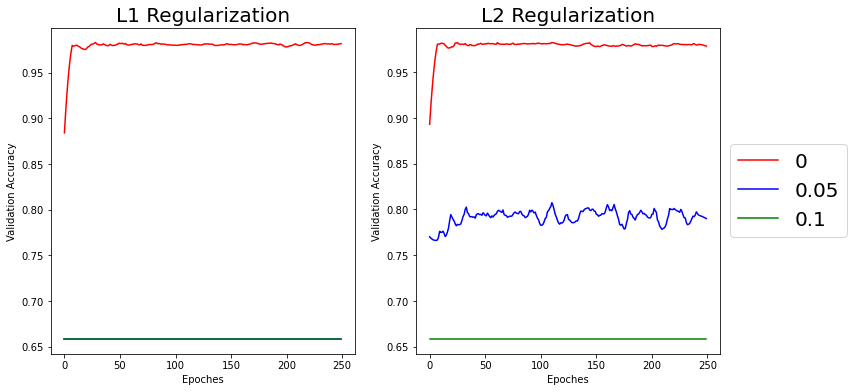

In [176]:
plt.figure(figsize = (12,6))
plt.subplot(1,2,1)
colors = ['red','blue','green','orange']
for i in range(len(reg_l1_scores)):
    plt.plot(savgol_filter(reg_l1_scores[i]['val_accuracy'],15,2),color = colors[i], label = weights[i])
    plt.xlabel('Epoches')
    plt.ylabel('Validation Accuracy')
    plt.title('L1 Regularization', fontsize = 20)
plt.subplot(1,2,2)
for i in range(len(reg_l2_scores)):
    plt.plot(savgol_filter(reg_l2_scores[i]['val_accuracy'],15,2),color = colors[i], label = weights[i])
    plt.xlabel('Epoches')
    plt.ylabel('Validation Accuracy')
    plt.title('L2 Regularization', fontsize = 20)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize = 20)

## Artificial Neural Network with dropout regularization <a id='anndrop'/>

In [177]:
x_train, x_test, y_train, y_test = standard_transform()

In [178]:
dropout_models = []
dropout_score = []
dropout_rates = [0, 0.25, 0.5]
for ind in range(len(dropout_rates)):
    dropout_models.append(tf.keras.models.Sequential())
    for layer_no, unit in enumerate([30,20,10]):
        dropout_models[ind].add(tf.keras.layers.Dense(units = unit, activation = 'relu', name = f'Hidden{layer_no}'))
        dropout_models[ind].add(layers.Dropout(rate = dropout_rates[ind]))
    dropout_models[ind].add(layers.Dense(units = 1, activation = 'sigmoid'))
    dropout_models[ind].compile(optimizer=tf.keras.optimizers.Adam(lr=0.01),
                               loss='binary_crossentropy', metrics = ['accuracy'])
    history = dropout_models[ind].fit(x=x_train, y=y_train, 
                  batch_size = 20, epochs=250, validation_split=0.2,
                  verbose=1, shuffle=True, workers=6, use_multiprocessing=True)
    dropout_score.append(history.history)

Epoch 1/250
420/420 [==============================] - 0s 1ms/step - loss: 0.3737 - accuracy: 0.8411 - val_loss: 0.3237 - val_accuracy: 0.8724
Epoch 2/250
420/420 [==============================] - 0s 833us/step - loss: 0.2473 - accuracy: 0.9048 - val_loss: 0.2283 - val_accuracy: 0.9124
Epoch 3/250
420/420 [==============================] - 0s 1ms/step - loss: 0.1865 - accuracy: 0.9335 - val_loss: 0.2089 - val_accuracy: 0.9224
Epoch 4/250
420/420 [==============================] - 0s 810us/step - loss: 0.1474 - accuracy: 0.9532 - val_loss: 0.1341 - val_accuracy: 0.9638
Epoch 5/250
420/420 [==============================] - 0s 970us/step - loss: 0.1330 - accuracy: 0.9607 - val_loss: 0.1656 - val_accuracy: 0.9476
Epoch 6/250
420/420 [==============================] - 0s 870us/step - loss: 0.1166 - accuracy: 0.9679 - val_loss: 0.1328 - val_accuracy: 0.9567
Epoch 7/250
420/420 [==============================] - 0s 749us/step - loss: 0.1101 - accuracy: 0.9701 - val_loss: 0.1305 - val_accura

420/420 [==============================] - 0s 893us/step - loss: 0.0586 - accuracy: 0.9855 - val_loss: 0.1067 - val_accuracy: 0.9843
Epoch 56/250
420/420 [==============================] - 0s 841us/step - loss: 0.0735 - accuracy: 0.9805 - val_loss: 0.1545 - val_accuracy: 0.9738
Epoch 57/250
420/420 [==============================] - 0s 878us/step - loss: 0.0722 - accuracy: 0.9815 - val_loss: 0.0932 - val_accuracy: 0.9814
Epoch 58/250
420/420 [==============================] - 0s 872us/step - loss: 0.0693 - accuracy: 0.9821 - val_loss: 0.1095 - val_accuracy: 0.9819
Epoch 59/250
420/420 [==============================] - 0s 908us/step - loss: 0.0595 - accuracy: 0.9858 - val_loss: 0.1104 - val_accuracy: 0.9800
Epoch 60/250
420/420 [==============================] - 0s 912us/step - loss: 0.0679 - accuracy: 0.9827 - val_loss: 0.1099 - val_accuracy: 0.9814
Epoch 61/250
420/420 [==============================] - 0s 882us/step - loss: 0.0623 - accuracy: 0.9851 - val_loss: 0.1002 - val_accuracy

420/420 [==============================] - 0s 858us/step - loss: 0.0546 - accuracy: 0.9856 - val_loss: 0.1837 - val_accuracy: 0.9790
Epoch 112/250
420/420 [==============================] - 0s 862us/step - loss: 0.0568 - accuracy: 0.9843 - val_loss: 0.1440 - val_accuracy: 0.9824
Epoch 113/250
420/420 [==============================] - 0s 978us/step - loss: 0.0531 - accuracy: 0.9857 - val_loss: 0.1524 - val_accuracy: 0.9829
Epoch 114/250
420/420 [==============================] - 0s 784us/step - loss: 0.0596 - accuracy: 0.9843 - val_loss: 0.1309 - val_accuracy: 0.9824
Epoch 115/250
420/420 [==============================] - 0s 805us/step - loss: 0.0570 - accuracy: 0.9844 - val_loss: 0.1471 - val_accuracy: 0.9833
Epoch 116/250
420/420 [==============================] - 0s 949us/step - loss: 0.0539 - accuracy: 0.9861 - val_loss: 0.1981 - val_accuracy: 0.9786
Epoch 117/250
420/420 [==============================] - 0s 861us/step - loss: 0.0570 - accuracy: 0.9846 - val_loss: 0.1473 - val_ac

Epoch 167/250
420/420 [==============================] - 0s 994us/step - loss: 0.0471 - accuracy: 0.9857 - val_loss: 0.2406 - val_accuracy: 0.9829
Epoch 168/250
420/420 [==============================] - 0s 780us/step - loss: 0.0627 - accuracy: 0.9836 - val_loss: 0.1134 - val_accuracy: 0.9829
Epoch 169/250
420/420 [==============================] - 0s 919us/step - loss: 0.0490 - accuracy: 0.9865 - val_loss: 0.1775 - val_accuracy: 0.9814
Epoch 170/250
420/420 [==============================] - 0s 851us/step - loss: 0.0483 - accuracy: 0.9860 - val_loss: 0.2783 - val_accuracy: 0.9814
Epoch 171/250
420/420 [==============================] - 0s 746us/step - loss: 0.0462 - accuracy: 0.9869 - val_loss: 0.2324 - val_accuracy: 0.9810
Epoch 172/250
420/420 [==============================] - 0s 830us/step - loss: 0.0544 - accuracy: 0.9849 - val_loss: 0.1488 - val_accuracy: 0.9790
Epoch 173/250
420/420 [==============================] - 0s 770us/step - loss: 0.0646 - accuracy: 0.9848 - val_loss: 0

Epoch 223/250
420/420 [==============================] - 0s 903us/step - loss: 0.0440 - accuracy: 0.9863 - val_loss: 0.1272 - val_accuracy: 0.9810
Epoch 224/250
420/420 [==============================] - 0s 848us/step - loss: 0.0647 - accuracy: 0.9838 - val_loss: 0.1867 - val_accuracy: 0.9776
Epoch 225/250
420/420 [==============================] - 0s 865us/step - loss: 0.0415 - accuracy: 0.9862 - val_loss: 0.2161 - val_accuracy: 0.9833
Epoch 226/250
420/420 [==============================] - 0s 911us/step - loss: 0.0387 - accuracy: 0.9871 - val_loss: 0.2261 - val_accuracy: 0.9819
Epoch 227/250
420/420 [==============================] - 0s 863us/step - loss: 0.0398 - accuracy: 0.9871 - val_loss: 0.2194 - val_accuracy: 0.9843
Epoch 228/250
420/420 [==============================] - 0s 925us/step - loss: 0.0447 - accuracy: 0.9862 - val_loss: 0.2301 - val_accuracy: 0.9805
Epoch 229/250
420/420 [==============================] - 0s 797us/step - loss: 0.0397 - accuracy: 0.9863 - val_loss: 0

Epoch 29/250
420/420 [==============================] - 0s 906us/step - loss: 0.2082 - accuracy: 0.9218 - val_loss: 0.1742 - val_accuracy: 0.9414
Epoch 30/250
420/420 [==============================] - 0s 854us/step - loss: 0.2102 - accuracy: 0.9199 - val_loss: 0.1589 - val_accuracy: 0.9448
Epoch 31/250
420/420 [==============================] - 0s 861us/step - loss: 0.2092 - accuracy: 0.9221 - val_loss: 0.1737 - val_accuracy: 0.9410
Epoch 32/250
420/420 [==============================] - 0s 861us/step - loss: 0.2139 - accuracy: 0.9210 - val_loss: 0.1725 - val_accuracy: 0.9367
Epoch 33/250
420/420 [==============================] - 0s 838us/step - loss: 0.2124 - accuracy: 0.9201 - val_loss: 0.1633 - val_accuracy: 0.9448
Epoch 34/250
420/420 [==============================] - 0s 897us/step - loss: 0.2077 - accuracy: 0.9237 - val_loss: 0.1802 - val_accuracy: 0.9362
Epoch 35/250
420/420 [==============================] - 0s 923us/step - loss: 0.2071 - accuracy: 0.9210 - val_loss: 0.1597 -

420/420 [==============================] - 0s 879us/step - loss: 0.1809 - accuracy: 0.9376 - val_loss: 0.1323 - val_accuracy: 0.9590
Epoch 86/250
420/420 [==============================] - 0s 852us/step - loss: 0.1883 - accuracy: 0.9335 - val_loss: 0.1359 - val_accuracy: 0.9557
Epoch 87/250
420/420 [==============================] - 0s 883us/step - loss: 0.1829 - accuracy: 0.9339 - val_loss: 0.1322 - val_accuracy: 0.9595
Epoch 88/250
420/420 [==============================] - 0s 876us/step - loss: 0.1777 - accuracy: 0.9367 - val_loss: 0.1347 - val_accuracy: 0.9548
Epoch 89/250
420/420 [==============================] - 0s 850us/step - loss: 0.1858 - accuracy: 0.9352 - val_loss: 0.1296 - val_accuracy: 0.9619
Epoch 90/250
420/420 [==============================] - 0s 885us/step - loss: 0.1787 - accuracy: 0.9348 - val_loss: 0.1489 - val_accuracy: 0.9481
Epoch 91/250
420/420 [==============================] - 0s 879us/step - loss: 0.1894 - accuracy: 0.9311 - val_loss: 0.1389 - val_accuracy

420/420 [==============================] - 0s 878us/step - loss: 0.1735 - accuracy: 0.9402 - val_loss: 0.1269 - val_accuracy: 0.9605
Epoch 142/250
420/420 [==============================] - 0s 901us/step - loss: 0.1751 - accuracy: 0.9410 - val_loss: 0.1285 - val_accuracy: 0.9619
Epoch 143/250
420/420 [==============================] - 0s 881us/step - loss: 0.1804 - accuracy: 0.9412 - val_loss: 0.1255 - val_accuracy: 0.9600
Epoch 144/250
420/420 [==============================] - 0s 875us/step - loss: 0.1703 - accuracy: 0.9438 - val_loss: 0.1181 - val_accuracy: 0.9657
Epoch 145/250
420/420 [==============================] - 0s 876us/step - loss: 0.1611 - accuracy: 0.9449 - val_loss: 0.1270 - val_accuracy: 0.9590
Epoch 146/250
420/420 [==============================] - 0s 883us/step - loss: 0.1780 - accuracy: 0.9393 - val_loss: 0.1319 - val_accuracy: 0.9619
Epoch 147/250
420/420 [==============================] - 0s 918us/step - loss: 0.1694 - accuracy: 0.9465 - val_loss: 0.1251 - val_ac

Epoch 197/250
420/420 [==============================] - 0s 996us/step - loss: 0.1603 - accuracy: 0.9494 - val_loss: 0.1116 - val_accuracy: 0.9705
Epoch 198/250
420/420 [==============================] - 0s 1ms/step - loss: 0.1598 - accuracy: 0.9489 - val_loss: 0.1321 - val_accuracy: 0.9671
Epoch 199/250
420/420 [==============================] - 0s 973us/step - loss: 0.1647 - accuracy: 0.9455 - val_loss: 0.1284 - val_accuracy: 0.9629
Epoch 200/250
420/420 [==============================] - 0s 890us/step - loss: 0.1706 - accuracy: 0.9480 - val_loss: 0.1295 - val_accuracy: 0.9605
Epoch 201/250
420/420 [==============================] - 0s 920us/step - loss: 0.1724 - accuracy: 0.9439 - val_loss: 0.1286 - val_accuracy: 0.9671
Epoch 202/250
420/420 [==============================] - 0s 927us/step - loss: 0.1643 - accuracy: 0.9444 - val_loss: 0.1396 - val_accuracy: 0.9571
Epoch 203/250
420/420 [==============================] - 0s 895us/step - loss: 0.1708 - accuracy: 0.9431 - val_loss: 0.1

420/420 [==============================] - 0s 1ms/step - loss: 0.5481 - accuracy: 0.7326 - val_loss: 0.4511 - val_accuracy: 0.7990
Epoch 2/250
420/420 [==============================] - 0s 771us/step - loss: 0.4560 - accuracy: 0.7877 - val_loss: 0.3952 - val_accuracy: 0.8324
Epoch 3/250
420/420 [==============================] - 0s 826us/step - loss: 0.4352 - accuracy: 0.8036 - val_loss: 0.3678 - val_accuracy: 0.8414
Epoch 4/250
420/420 [==============================] - 0s 907us/step - loss: 0.4204 - accuracy: 0.8098 - val_loss: 0.3876 - val_accuracy: 0.8429
Epoch 5/250
420/420 [==============================] - 0s 747us/step - loss: 0.4159 - accuracy: 0.8143 - val_loss: 0.3703 - val_accuracy: 0.8505
Epoch 6/250
420/420 [==============================] - 0s 785us/step - loss: 0.4006 - accuracy: 0.8248 - val_loss: 0.3410 - val_accuracy: 0.8595
Epoch 7/250
420/420 [==============================] - 0s 872us/step - loss: 0.3969 - accuracy: 0.8205 - val_loss: 0.3310 - val_accuracy: 0.8529

420/420 [==============================] - 0s 884us/step - loss: 0.3411 - accuracy: 0.8398 - val_loss: 0.2808 - val_accuracy: 0.8695
Epoch 58/250
420/420 [==============================] - 0s 796us/step - loss: 0.3340 - accuracy: 0.8406 - val_loss: 0.2683 - val_accuracy: 0.8748
Epoch 59/250
420/420 [==============================] - 0s 1ms/step - loss: 0.3328 - accuracy: 0.8400 - val_loss: 0.2683 - val_accuracy: 0.8729
Epoch 60/250
420/420 [==============================] - 0s 693us/step - loss: 0.3384 - accuracy: 0.8432 - val_loss: 0.2576 - val_accuracy: 0.8786
Epoch 61/250
420/420 [==============================] - 0s 773us/step - loss: 0.3491 - accuracy: 0.8402 - val_loss: 0.2727 - val_accuracy: 0.8681
Epoch 62/250
420/420 [==============================] - 0s 872us/step - loss: 0.3297 - accuracy: 0.8462 - val_loss: 0.2568 - val_accuracy: 0.8814
Epoch 63/250
420/420 [==============================] - 0s 837us/step - loss: 0.3279 - accuracy: 0.8435 - val_loss: 0.2554 - val_accuracy: 

420/420 [==============================] - 0s 785us/step - loss: 0.3083 - accuracy: 0.8517 - val_loss: 0.2568 - val_accuracy: 0.8695
Epoch 114/250
420/420 [==============================] - 0s 822us/step - loss: 0.3297 - accuracy: 0.8414 - val_loss: 0.2524 - val_accuracy: 0.8810
Epoch 115/250
420/420 [==============================] - 0s 959us/step - loss: 0.3210 - accuracy: 0.8498 - val_loss: 0.2777 - val_accuracy: 0.8686
Epoch 116/250
420/420 [==============================] - 0s 804us/step - loss: 0.3265 - accuracy: 0.8423 - val_loss: 0.2455 - val_accuracy: 0.9043
Epoch 117/250
420/420 [==============================] - 0s 815us/step - loss: 0.3260 - accuracy: 0.8443 - val_loss: 0.2554 - val_accuracy: 0.8819
Epoch 118/250
420/420 [==============================] - 0s 928us/step - loss: 0.3264 - accuracy: 0.8455 - val_loss: 0.2543 - val_accuracy: 0.8943
Epoch 119/250
420/420 [==============================] - 0s 839us/step - loss: 0.3261 - accuracy: 0.8446 - val_loss: 0.2417 - val_ac

Epoch 169/250
420/420 [==============================] - 0s 805us/step - loss: 0.3280 - accuracy: 0.8448 - val_loss: 0.2597 - val_accuracy: 0.8748
Epoch 170/250
420/420 [==============================] - 0s 908us/step - loss: 0.3227 - accuracy: 0.8444 - val_loss: 0.2472 - val_accuracy: 0.9024
Epoch 171/250
420/420 [==============================] - 0s 860us/step - loss: 0.3263 - accuracy: 0.8440 - val_loss: 0.2746 - val_accuracy: 0.8767
Epoch 172/250
420/420 [==============================] - 0s 880us/step - loss: 0.3147 - accuracy: 0.8475 - val_loss: 0.2407 - val_accuracy: 0.8862
Epoch 173/250
420/420 [==============================] - 0s 951us/step - loss: 0.3279 - accuracy: 0.8440 - val_loss: 0.2586 - val_accuracy: 0.8814
Epoch 174/250
420/420 [==============================] - 0s 863us/step - loss: 0.3230 - accuracy: 0.8462 - val_loss: 0.2441 - val_accuracy: 0.8833
Epoch 175/250
420/420 [==============================] - 0s 943us/step - loss: 0.3209 - accuracy: 0.8439 - val_loss: 0

Epoch 225/250
420/420 [==============================] - 0s 899us/step - loss: 0.3298 - accuracy: 0.8492 - val_loss: 0.2442 - val_accuracy: 0.8752
Epoch 226/250
420/420 [==============================] - 0s 866us/step - loss: 0.3219 - accuracy: 0.8490 - val_loss: 0.2271 - val_accuracy: 0.9119
Epoch 227/250
420/420 [==============================] - 0s 821us/step - loss: 0.3179 - accuracy: 0.8514 - val_loss: 0.2373 - val_accuracy: 0.8824
Epoch 228/250
420/420 [==============================] - 0s 840us/step - loss: 0.3115 - accuracy: 0.8510 - val_loss: 0.2327 - val_accuracy: 0.9095
Epoch 229/250
420/420 [==============================] - 0s 774us/step - loss: 0.3155 - accuracy: 0.8506 - val_loss: 0.2536 - val_accuracy: 0.8781
Epoch 230/250
420/420 [==============================] - 0s 791us/step - loss: 0.3207 - accuracy: 0.8445 - val_loss: 0.2443 - val_accuracy: 0.8776
Epoch 231/250
420/420 [==============================] - 0s 800us/step - loss: 0.3117 - accuracy: 0.8513 - val_loss: 0

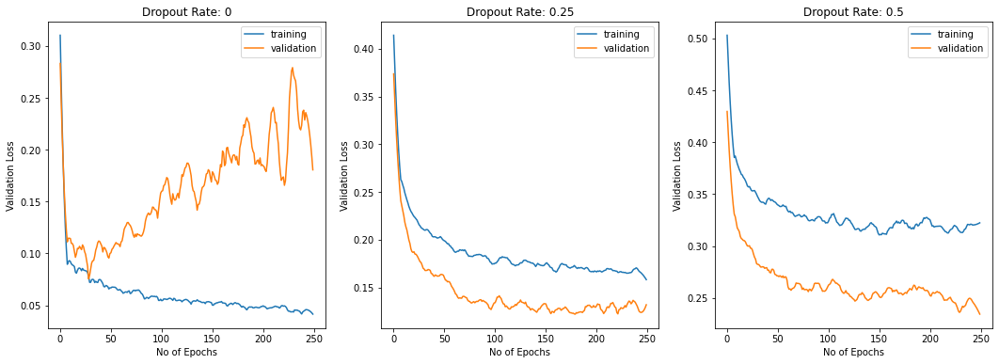

In [179]:
plt.figure(figsize = (18,6))

ind = 1

for i in range(len(dropout_score)):
    history = dropout_score[i]
    plt.subplot(1,3,ind)
    plt.plot(savgol_filter(history['loss'],15,2),label = 'training')
    plt.plot(savgol_filter(history['val_loss'],15,2),label = 'validation')
    ind += 1
    plt.xlabel('No of Epochs')
    plt.ylabel('Validation Loss')
    plt.title('Dropout Rate: ' + str(dropout_rates[i]))
    plt.legend()

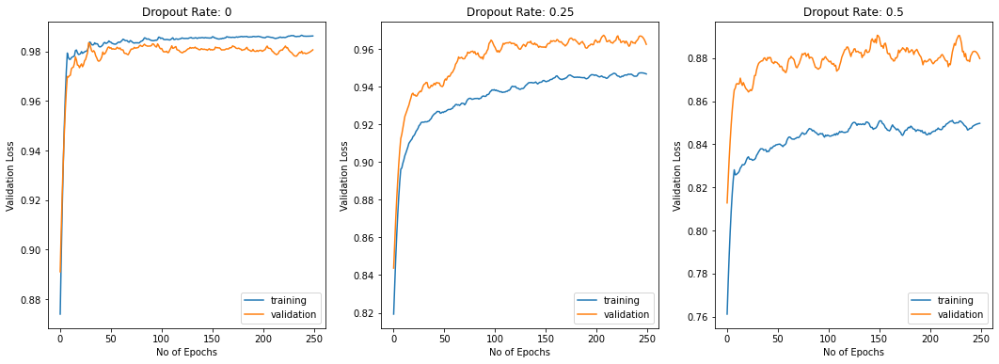

In [180]:
plt.figure(figsize = (18,6))

ind = 1

for i in range(len(dropout_score)):
    history = dropout_score[i]
    plt.subplot(1,3,ind)
    plt.plot(savgol_filter(history['accuracy'],15,2),label = 'training')
    plt.plot(savgol_filter(history['val_accuracy'],15,2),label = 'validation')
    ind += 1
    plt.xlabel('No of Epochs')
    plt.ylabel('Validation Loss')
    plt.title('Dropout Rate: ' + str(dropout_rates[i]))
    plt.legend()

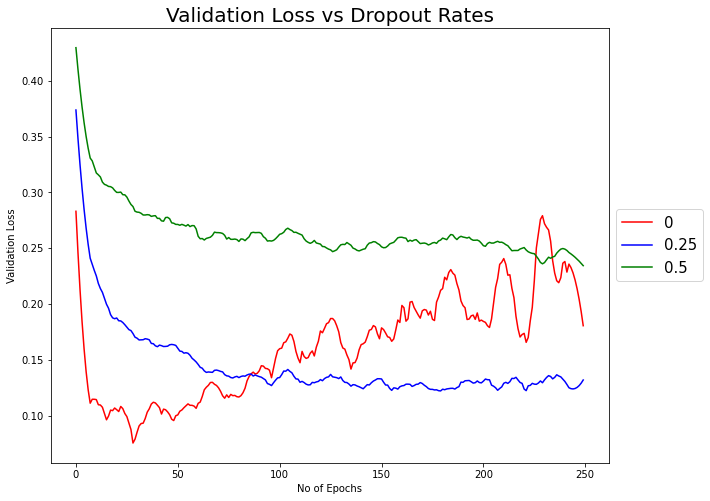

In [181]:
plt.figure(figsize = (10,8))
colors = ['red','blue','green','orange','black','purple']
for i in range(len(dropout_score)):
    history = dropout_score[i]
    plt.plot(savgol_filter(history['val_loss'],15,2), color = colors[i], label = dropout_rates[i])
    plt.xlabel('No of Epochs')
    plt.ylabel('Validation Loss')
    plt.title('Validation Loss vs Dropout Rates', fontsize = 20)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize = 15)
plt.show()

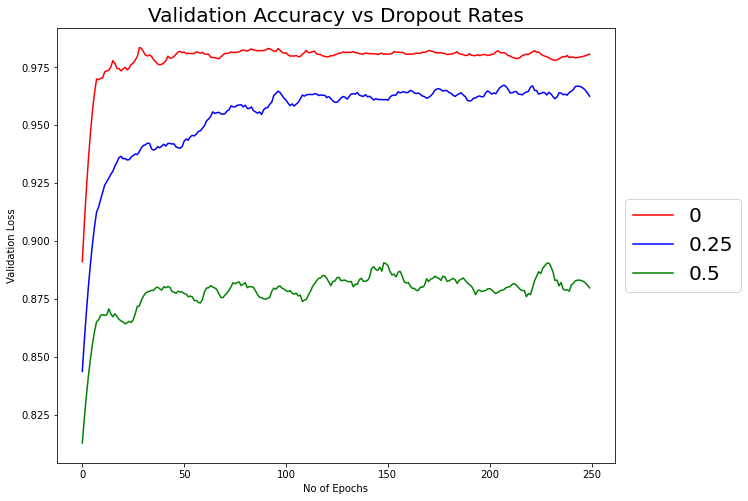

In [182]:
plt.figure(figsize = (10,8))
colors = ['red','blue','green','orange','black','purple']
for i in range(len(dropout_score)):
    history = dropout_score[i]
    plt.plot(savgol_filter(history['val_accuracy'],15,2), color = colors[i], label = dropout_rates[i])
    plt.xlabel('No of Epochs')
    plt.ylabel('Validation Loss')
    plt.title('Validation Accuracy vs Dropout Rates', fontsize = 20)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize = 20)
plt.show()

Best Neural Network Model is without any type of regularization (l1/l2/dropout) and learning_rate for Adam optimizer is 0.01.

In [183]:
best_ann = ann_models[3]
y_pred = np.array([1 if i > 0.5 else 0 for i in best_ann.predict(x_test)[:,0] ])
result_dict['Artificial Neural Network'] = print_results(y_test, y_pred)

Model Accuracy Score: 0.982
Model Recall Score: 0.9930843706777317
Model FBeta Score (Beta = 2): 0.9847757509257989
Model ROC_AUC Score: 0.984918085797281


# IV. Results and Summary

## 1. Model Comparison <a id='comparemodels'/>

### Accuracy, Precision, Recall, FBeta

In [184]:
results = pd.DataFrame(result_dict).drop(index = 'y_pred').transpose()
results

,accuracy,precision,recall,fbeta,roc_auc
K Nearest Neighbors,0.936444,0.891175,0.916724,0.911497,0.931344
Radius Neighbors,0.797333,0.416058,0.951442,0.756698,0.861167
Ensemble (K-NearestNeighbors),0.983333,0.952887,0.997222,0.988028,0.98701
Pre-prune Tree,0.971778,0.976519,0.938288,0.945693,0.963464
CCP Tree,0.976222,0.984094,0.94426,0.951967,0.968288
Random Forest Classifier,0.985556,0.956868,1.0,0.991065,0.989372
ExtraTree Classifier,0.975778,0.928334,0.999286,0.984241,0.982224
Bagging Tree Classifier,0.977778,0.933643,1.0,0.985985,0.983834
AdaBoost Classifier,0.984889,0.957532,0.997236,0.989034,0.988136
GradientBoosting Classifier,0.986222,0.958859,1.0,0.991492,0.989853
